In [1]:
!pip install rdkit

In [2]:
!pip install rdkit-pypi
!pip install matplotlib

In [3]:
!pip install torch

In [4]:
!pip install torch_geometric

In [5]:
!pip install torchvision

In [6]:
!pip install pytorch-lightning

In [7]:
!pip install deepchem

In [8]:
!pip install pytorch-lightning

In [9]:
# Import necessary libraries
import pandas as pd
from rdkit import Chem
from rdkit.Chem import rdchem
import torch
from torch_geometric.data import Data


In [10]:
import os
import csv
import glob
import torch
import numpy as np
import networkx as nx
from torch_geometric.data import Data

In [11]:
from typing import List, Tuple
import numpy as np

from deepchem.utils.typing import RDKitAtom, RDKitBond, RDKitMol
from deepchem.feat.graph_data import GraphData
from deepchem.feat.base_classes import MolecularFeaturizer
from deepchem.utils.molecule_feature_utils import one_hot_encode
from deepchem.utils.molecule_feature_utils import get_atom_type_one_hot
from deepchem.utils.molecule_feature_utils import construct_hydrogen_bonding_info
from deepchem.utils.molecule_feature_utils import get_atom_hydrogen_bonding_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_hybridization_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_total_num_Hs_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_is_in_aromatic_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_chirality_one_hot
from deepchem.utils.molecule_feature_utils import get_atom_formal_charge
from deepchem.utils.molecule_feature_utils import get_atom_partial_charge
from deepchem.utils.molecule_feature_utils import get_atom_total_degree_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_type_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_is_in_same_ring_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_is_conjugated_one_hot
from deepchem.utils.molecule_feature_utils import get_bond_stereo_one_hot

In [12]:
# from deepchem.utils.molecule_feature_utils import get_atom_formal_charge_one_hot
# from deepchem.utils.molecule_feature_utils import get_atom_implicit_valence_one_hot
# from deepchem.utils.molecule_feature_utils import get_atom_explicit_valence_one_hot
# from deepchem.utils.rdkit_utils import compute_all_pairs_shortest_path
# from deepchem.utils.rdkit_utils import compute_pairwise_ring_info

In [13]:
from rdkit import Chem
from rdkit.Chem import AllChem

In [14]:
DEFAULT_ATOM_TYPE_SET = [
    "C",
    "N",
    "O",
    "F",
    "P",
    "S",
    "Cl",
    "Br",
    "I",
]
DEFAULT_HYBRIDIZATION_SET = ["SP", "SP2", "SP3"]
DEFAULT_TOTAL_NUM_Hs_SET = [0, 1, 2, 3, 4]
DEFAULT_FORMAL_CHARGE_SET = [-2, -1, 0, 1, 2]
DEFAULT_TOTAL_DEGREE_SET = [0, 1, 2, 3, 4, 5]
DEFAULT_RING_SIZE_SET = [3, 4, 5, 6, 7, 8]
DEFAULT_BOND_TYPE_SET = ["SINGLE", "DOUBLE", "TRIPLE", "AROMATIC"]
DEFAULT_BOND_STEREO_SET = ["STEREONONE", "STEREOANY", "STEREOZ", "STEREOE"]
DEFAULT_GRAPH_DISTANCE_SET = [1, 2, 3, 4, 5, 6, 7]
DEFAULT_ATOM_IMPLICIT_VALENCE_SET = [0, 1, 2, 3, 4, 5, 6]
DEFAULT_ATOM_EXPLICIT_VALENCE_SET = [1, 2, 3, 4, 5, 6]

USER_ATOM_TYPE_SET  = ['C', 'N', 'O', 'S', 'F', 'Si', 'P', 'Cl', 'Br', 'Mg', 'Na', 'Ca',
       'Fe', 'As', 'Al', 'I', 'B', 'V', 'K', 'Tl', 'Yb', 'Sb', 'Sn', 'Ag',
       'Pd', 'Co', 'Se', 'Ti', 'Zn', 'H', 'Li', 'Ge', 'Cu', 'Au', 'Ni',
       'Cd', 'In', 'Mn', 'Zr', 'Cr', 'Pt', 'Hg', 'Pb']
USER_TOTAL_DEGREE_SET = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
USER_HYBRIDIZATION_SET = ["SP", "SP2", "SP3", 'SP3D','SP3D2']

In [15]:
def one_hot_encode(value, allowed_values, include_unknown_set=False):
    """Create a one-hot encoded vector based on allowed values."""
    if include_unknown_set and value not in allowed_values:
        value = allowed_values[-1]

    return [1.0 if v == value else 0.0 for v in allowed_values]


In [16]:
from rdkit import Chem
from rdkit.Chem import AllChem
import numpy as np
import torch
from torch_geometric.data import Data

class MolGraphConvFeaturizer:
    def __init__(self, use_edges=True, use_chirality=True, use_partial_charge=True):
        self.use_edges = use_edges
        self.use_chirality = use_chirality
        self.use_partial_charge = use_partial_charge

    def featurize(self, smiles):
        # Convert SMILES to RDKit Mol object
        mol = Chem.MolFromSmiles(smiles)
        if mol is None:
            return None

        # Compute Gasteiger charges if necessary
        if self.use_partial_charge:
            try:
                AllChem.ComputeGasteigerCharges(mol)
            except:
                return None  # Unable to compute charges for this molecule

        # Get atom features
        atom_features = np.array([self._get_atom_features(atom) for atom in mol.GetAtoms()])

        # Get bond features and indices
        if self.use_edges:
            edge_indices, edge_features = self._get_bond_features(mol)
        else:
            edge_indices, edge_features = None, None

        # Create a graph data object
        graph = Data(x=torch.tensor(atom_features, dtype=torch.float),
                     edge_index=torch.tensor(edge_indices, dtype=torch.long).t().contiguous() if edge_indices is not None else None,
                     edge_attr=torch.tensor(edge_features, dtype=torch.float) if edge_features is not None else None)

        return graph

    def _get_atom_features(self, atom):
        # One-hot encoding of atom type
        atom_type = one_hot_encode(atom.GetSymbol(), USER_ATOM_TYPE_SET, include_unknown_set=True)

        # Formal charge of the atom
        formal_charge = get_atom_formal_charge(atom)

        # One-hot encoding of the atom's hybridization
        hybridization = get_atom_hybridization_one_hot(atom, USER_HYBRIDIZATION_SET, include_unknown_set=True)

        # Aromaticity of the atom
        aromatic = get_atom_is_in_aromatic_one_hot(atom)

        # One-hot encoding of the atom's degree
        degree = get_atom_total_degree_one_hot(atom, USER_TOTAL_DEGREE_SET, include_unknown_set=True)

        # One-hot encoding of the total number of hydrogens connected to the atom
        total_num_Hs = get_atom_total_num_Hs_one_hot(atom, DEFAULT_TOTAL_NUM_Hs_SET, include_unknown_set=True)

        # Concatenating all the features
        atom_feat = np.concatenate([
            atom_type, formal_charge, hybridization, aromatic, degree, total_num_Hs
        ])

        if self.use_chirality:
            chirality = get_atom_chirality_one_hot(atom)
            atom_feat = np.concatenate([atom_feat, chirality])

        if self.use_partial_charge:
            partial_charge = get_atom_partial_charge(atom)
            atom_feat = np.concatenate([atom_feat, partial_charge])

        return atom_feat

    def _get_bond_features(self, mol):
        # Initialize lists for source and destination atoms of each bond
        src, dest, bond_features = [], [], []

        for bond in mol.GetBonds():
            start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
            src += [start, end]
            dest += [end, start]

            # Extract bond features and duplicate for both bond directions
            bond_feat = self._extract_bond_features(bond)
            bond_features += [bond_feat, bond_feat]

        edge_indices = [src, dest]
        #print("edge_indices : ",edge_indices)
        #print("bond_features : ",bond_features)
        return edge_indices, bond_features
        
    def _extract_bond_features(self, bond):
        """
        Extract bond features from a RDKit bond object.
        """

        # One-hot encoding of bond type
        bond_type = one_hot_encode(bond.GetBondTypeAsDouble(), [1.0, 1.5, 2.0, 3.0], include_unknown_set=True)

        # Whether the bond is in the same ring
        same_ring = [1.0] if bond.IsInRing() else [0.0]

        # Whether the bond is conjugated
        conjugated = [1.0] if bond.GetIsConjugated() else [0.0]

        # One-hot encoding of bond stereo configuration
        stereo = one_hot_encode(bond.GetStereo(), [Chem.rdchem.BondStereo.STEREONONE, 
                                                   Chem.rdchem.BondStereo.STEREOANY, 
                                                   Chem.rdchem.BondStereo.STEREOZ, 
                                                   Chem.rdchem.BondStereo.STEREOE], 
                                include_unknown_set=True)

        # Concatenate all bond features
        bond_feat = np.concatenate([bond_type, same_ring, conjugated, stereo])

        return bond_feat        


In [17]:
# Example usage
#featurizer = MolGraphConvFeaturizer()
#graph = featurizer.featurize('CCO')  # Example SMILES string
#print(type(graph))
#print((graph))

In [18]:
## Assuming graphs[0] is a torch_geometric.data.Data object from your graphs list

## Print node features
#print("Len of graph:", len(graph))
#print("Node Features:")
#for i, node_feature in enumerate(graph.x):
#    print(f"Node {i}: {node_feature}")

## Print edge pairs and edge features
#print("\nEdge Pairs and Features:")
#for i, edge in enumerate(graph.edge_index.t()):
#    src, dest = edge[0].item(), edge[1].item()
#    edge_feature = graph.edge_attr[i]
#    print(f"Edge {i} - Source: {src}, Destination: {dest}, Features: {edge_feature}")


In [19]:
#graph.is_directed()

In [20]:
import networkx as nx
import matplotlib.pyplot as plt
import torch

def visualize_graph(data):
    # Create a networkx graph
    G = nx.Graph()

    # Add nodes to the graph
    for i in range(data.num_nodes):
        G.add_node(i)

    # Add edges to the graph
    edge_index = data.edge_index.t().cpu().numpy()
    for edge in edge_index:
        src, dest = edge[0], edge[1]
        G.add_edge(src, dest)

    # Draw the graph
    pos = nx.spring_layout(G)  # positions for all nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, edge_color='gray')
    plt.title("Graph Visualization")
    plt.show()
#visualize_graph(graph)

In [21]:
# Load the data 
#smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-41-clean.txt", header=None, names=['SMILES'])
#smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-10m-clean.txt", header=None, names=['SMILES'])
#smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-10m-clean_test.txt", header=None, names=['SMILES'])
smiles_df = pd.read_csv("D:\\PhD\\Chapter3\\Unsupervised_GAN_Code\\pubchem-10m-clean_test50k.txt", header=None, names=['SMILES'])


In [22]:
smiles_df.head(5)

,SMILES
0,CN(c1ccccc1)c1ccccc1C(=O)NCC1(O)CCOCC1
1,CC[NH+](CC)C1CCC([NH2+]C2CC2)(C(=O)[O-])C1
2,COCC(CNC(=O)c1ccc2c(c1)NC(=O)C2)OC
3,OCCn1cc(CNc2cccc3c2CCCC3)nn1
4,CCCCCCc1ccc(C#Cc2ccc(C#CC3=CC=C(CCC)CC3)c(C3CC...


In [23]:
# Define a function to convert a SMILES string to a graph data object
def smiles_to_graph(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None

    # Get atom features
    atom_features = []
    for atom in mol.GetAtoms():
        atom_features.append(atom.GetAtomicNum())

    # Get bond features and adjacency information
    edge_indices = []
    edge_features = []
    for bond in mol.GetBonds():
        start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
        edge_indices += [(start, end), (end, start)]
        edge_feature = [bond.GetBondTypeAsDouble()]
        edge_features += [edge_feature, edge_feature]  # add twice for both directions

    # Convert to tensors
    x = torch.tensor(atom_features, dtype=torch.float).view(-1, 1)
    edge_index = torch.tensor(edge_indices, dtype=torch.long).t().contiguous()
    edge_attr = torch.tensor(edge_features, dtype=torch.float)

    # Create a graph data object
    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data


In [24]:
def read_smiles_df_check(smiles_df):
    graphs = []
    invalid_indices = []
    for idx, smiles in enumerate(smiles_df['SMILES']):
        graph = smiles_to_graph(smiles)
        if graph:
            graphs.append(graph)
        else:
            print("Invalid graph :", idx,smiles)
            invalid_indices.append(idx)
    return graphs, invalid_indices

graphs, invalid_indices = read_smiles_df_check(smiles_df)
print(f"Number of valid graphs: {len(graphs)}")
print(f"Indices of invalid SMILES: {invalid_indices}")

Number of valid graphs: 50001
Indices of invalid SMILES: []


In [25]:
# Check lengths after removal
print("Length of smiles_df:", len(smiles_df))


Length of smiles_df: 50001


In [26]:
# Initialize the featurizer
featurizer = MolGraphConvFeaturizer(use_edges=True, use_chirality=True, use_partial_charge=True)

# Featurize SMILES strings and track invalid entries
graphs = []
invalid_indices = []
for idx, smiles in enumerate(smiles_df['SMILES']):
    print(idx)
    graph = featurizer.featurize(smiles)
    graphs.append(graph)    
    
#    try:
#        graph = featurizer.featurize(smiles)
#        graphs.append(graph)
#    except Exception as e:
#        print(f"Invalid SMILES at index {idx}: {smiles} (Error: {e})")
#        invalid_indices.append(idx)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46


C:\Users\Malli\AppData\Local\Temp\ipykernel_11284\3029635957.py:38: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:264.)
  edge_attr=torch.tensor(edge_features, dtype=torch.float) if edge_features is not None else None)


47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
3

1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151


3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770
3771
3772
3773
3774
3775
3776
3777
3778
3779
3780
3781
3782
3783
3784
3785
3786
3787
3788
3789
3790
3791
3792
3793
3794
3795
3796
3797
3798
3799
3800
3801
3802
3803
3804
3805
3806
3807
3808
3809
3810
3811
3812
3813
3814
3815
3816
3817
3818
3819
3820
3821
3822


5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5468
5469


6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108


8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748


10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
10255
10256
10257
10258
10259
10260
10261
10262
10263
10264
10265
10266
10267
10268
10269
10270
10271
10272
10273
10274
10275
10276
10277
10278
10279
10280
10281
10282
10283
10284
10285
10286
10287
10288
10289
10290
10291
10292
10293
10294
10295
10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
10334
10335
10336
10337
10338
10339
10340
10341
10342
10343
1034

11614
11615
11616
11617
11618
11619
11620
11621
11622
11623
11624
11625
11626
11627
11628
11629
11630
11631
11632
11633
11634
11635
11636
11637
11638
11639
11640
11641
11642
11643
11644
11645
11646
11647
11648
11649
11650
11651
11652
11653
11654
11655
11656
11657
11658
11659
11660
11661
11662
11663
11664
11665
11666
11667
11668
11669
11670
11671
11672
11673
11674
11675
11676
11677
11678
11679
11680
11681
11682
11683
11684
11685
11686
11687
11688
11689
11690
11691
11692
11693
11694
11695
11696
11697
11698
11699
11700
11701
11702
11703
11704
11705
11706
11707
11708
11709
11710
11711
11712
11713
11714
11715
11716
11717
11718
11719
11720
11721
11722
11723
11724
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11737
11738
11739
11740
11741
11742
11743
11744
11745
11746
11747
11748
11749
11750
11751
11752
11753
11754
11755
11756
11757
11758
11759
11760
11761
11762
11763
11764
11765
11766
11767
11768
11769
11770
11771
11772
11773
11774
11775
11776
11777
11778
11779
1178

13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
13125
13126
13127
13128
13129
13130
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13180
13181
13182
13183
13184
13185
13186
13187
13188
13189
13190
13191
13192
13193
13194
13195
13196
13197
13198
13199
13200
13201
13202
13203
13204
13205
13206
13207
13208
13209
13210
13211
13212
13213
13214
13215
13216
13217
13218
13219
13220
13221
13222
13223
13224
13225
13226
13227
13228
13229
13230
13231
13232
13233
13234
13235
13236
13237
13238
13239
13240
13241
13242
13243
13244
13245
13246
13247
13248
13249
13250
13251
13252
13253
13254
13255
13256
13257
1325

14542
14543
14544
14545
14546
14547
14548
14549
14550
14551
14552
14553
14554
14555
14556
14557
14558
14559
14560
14561
14562
14563
14564
14565
14566
14567
14568
14569
14570
14571
14572
14573
14574
14575
14576
14577
14578
14579
14580
14581
14582
14583
14584
14585
14586
14587
14588
14589
14590
14591
14592
14593
14594
14595
14596
14597
14598
14599
14600
14601
14602
14603
14604
14605
14606
14607
14608
14609
14610
14611
14612
14613
14614
14615
14616
14617
14618
14619
14620
14621
14622
14623
14624
14625
14626
14627
14628
14629
14630
14631
14632
14633
14634
14635
14636
14637
14638
14639
14640
14641
14642
14643
14644
14645
14646
14647
14648
14649
14650
14651
14652
14653
14654
14655
14656
14657
14658
14659
14660
14661
14662
14663
14664
14665
14666
14667
14668
14669
14670
14671
14672
14673
14674
14675
14676
14677
14678
14679
14680
14681
14682
14683
14684
14685
14686
14687
14688
14689
14690
14691
14692
14693
14694
14695
14696
14697
14698
14699
14700
14701
14702
14703
14704
14705
14706
14707
1470

15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
16006
16007
16008
16009
16010
16011
16012
16013
16014
16015
16016
16017
16018
16019
16020
16021
16022
16023
16024
16025
16026
16027
16028
16029
16030
16031
16032
16033
16034
16035
16036
16037
16038
16039
16040
16041
16042
16043
16044
16045
16046
16047
16048
16049
16050
16051
16052
16053
16054
16055
16056
16057
16058
16059
16060
16061
16062
16063
16064
16065
16066
16067
16068
16069
16070
16071
16072
16073
16074
16075
16076
16077
16078
16079
16080
16081
16082
16083
16084
16085
16086
16087
16088
16089
16090
16091
16092
16093
16094
16095
16096
16097
16098
16099
16100
16101
16102
16103
16104
16105
16106
16107
16108
16109
16110
16111
16112
16113
16114
16115
16116
16117
16118
1611

17386
17387
17388
17389
17390
17391
17392
17393
17394
17395
17396
17397
17398
17399
17400
17401
17402
17403
17404
17405
17406
17407
17408
17409
17410
17411
17412
17413
17414
17415
17416
17417
17418
17419
17420
17421
17422
17423
17424
17425
17426
17427
17428
17429
17430
17431
17432
17433
17434
17435
17436
17437
17438
17439
17440
17441
17442
17443
17444
17445
17446
17447
17448
17449
17450
17451
17452
17453
17454
17455
17456
17457
17458
17459
17460
17461
17462
17463
17464
17465
17466
17467
17468
17469
17470
17471
17472
17473
17474
17475
17476
17477
17478
17479
17480
17481
17482
17483
17484
17485
17486
17487
17488
17489
17490
17491
17492
17493
17494
17495
17496
17497
17498
17499
17500
17501
17502
17503
17504
17505
17506
17507
17508
17509
17510
17511
17512
17513
17514
17515
17516
17517
17518
17519
17520
17521
17522
17523
17524
17525
17526
17527
17528
17529
17530
17531
17532
17533
17534
17535
17536
17537
17538
17539
17540
17541
17542
17543
17544
17545
17546
17547
17548
17549
17550
17551
1755

18851
18852
18853
18854
18855
18856
18857
18858
18859
18860
18861
18862
18863
18864
18865
18866
18867
18868
18869
18870
18871
18872
18873
18874
18875
18876
18877
18878
18879
18880
18881
18882
18883
18884
18885
18886
18887
18888
18889
18890
18891
18892
18893
18894
18895
18896
18897
18898
18899
18900
18901
18902
18903
18904
18905
18906
18907
18908
18909
18910
18911
18912
18913
18914
18915
18916
18917
18918
18919
18920
18921
18922
18923
18924
18925
18926
18927
18928
18929
18930
18931
18932
18933
18934
18935
18936
18937
18938
18939
18940
18941
18942
18943
18944
18945
18946
18947
18948
18949
18950
18951
18952
18953
18954
18955
18956
18957
18958
18959
18960
18961
18962
18963
18964
18965
18966
18967
18968
18969
18970
18971
18972
18973
18974
18975
18976
18977
18978
18979
18980
18981
18982
18983
18984
18985
18986
18987
18988
18989
18990
18991
18992
18993
18994
18995
18996
18997
18998
18999
19000
19001
19002
19003
19004
19005
19006
19007
19008
19009
19010
19011
19012
19013
19014
19015
19016
1901

20227
20228
20229
20230
20231
20232
20233
20234
20235
20236
20237
20238
20239
20240
20241
20242
20243
20244
20245
20246
20247
20248
20249
20250
20251
20252
20253
20254
20255
20256
20257
20258
20259
20260
20261
20262
20263
20264
20265
20266
20267
20268
20269
20270
20271
20272
20273
20274
20275
20276
20277
20278
20279
20280
20281
20282
20283
20284
20285
20286
20287
20288
20289
20290
20291
20292
20293
20294
20295
20296
20297
20298
20299
20300
20301
20302
20303
20304
20305
20306
20307
20308
20309
20310
20311
20312
20313
20314
20315
20316
20317
20318
20319
20320
20321
20322
20323
20324
20325
20326
20327
20328
20329
20330
20331
20332
20333
20334
20335
20336
20337
20338
20339
20340
20341
20342
20343
20344
20345
20346
20347
20348
20349
20350
20351
20352
20353
20354
20355
20356
20357
20358
20359
20360
20361
20362
20363
20364
20365
20366
20367
20368
20369
20370
20371
20372
20373
20374
20375
20376
20377
20378
20379
20380
20381
20382
20383
20384
20385
20386
20387
20388
20389
20390
20391
20392
2039

21658
21659
21660
21661
21662
21663
21664
21665
21666
21667
21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
21728
21729
21730
21731
21732
21733
21734
21735
21736
21737
21738
21739
21740
21741
21742
21743
21744
21745
21746
21747
21748
21749
21750
21751
21752
21753
21754
21755
21756
21757
21758
21759
21760
21761
21762
21763
21764
21765
21766
21767
21768
21769
21770
21771
21772
21773
21774
21775
21776
21777
21778
21779
21780
21781
21782
21783
21784
21785
21786
21787
21788
21789
21790
21791
21792
21793
21794
21795
21796
21797
21798
21799
21800
21801
21802
21803
21804
21805
21806
21807
21808
21809
21810
21811
21812
21813
21814
21815
21816
21817
21818
21819
21820
21821
21822
21823
2182

23120
23121
23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
23170
23171
23172
23173
23174
23175
23176
23177
23178
23179
23180
23181
23182
23183
23184
23185
23186
23187
23188
23189
23190
23191
23192
23193
23194
23195
23196
23197
23198
23199
23200
23201
23202
23203
23204
23205
23206
23207
23208
23209
23210
23211
23212
23213
23214
23215
23216
23217
23218
23219
23220
23221
23222
23223
23224
23225
23226
23227
23228
23229
23230
23231
23232
23233
23234
23235
23236
23237
23238
23239
23240
23241
23242
23243
23244
23245
23246
23247
23248
23249
23250
23251
23252
23253
23254
23255
23256
23257
23258
23259
23260
23261
23262
23263
23264
23265
23266
23267
23268
23269
23270
23271
23272
23273
23274
23275
23276
23277
23278
23279
23280
23281
23282
23283
23284
23285
2328

24569
24570
24571
24572
24573
24574
24575
24576
24577
24578
24579
24580
24581
24582
24583
24584
24585
24586
24587
24588
24589
24590
24591
24592
24593
24594
24595
24596
24597
24598
24599
24600
24601
24602
24603
24604
24605
24606
24607
24608
24609
24610
24611
24612
24613
24614
24615
24616
24617
24618
24619
24620
24621
24622
24623
24624
24625
24626
24627
24628
24629
24630
24631
24632
24633
24634
24635
24636
24637
24638
24639
24640
24641
24642
24643
24644
24645
24646
24647
24648
24649
24650
24651
24652
24653
24654
24655
24656
24657
24658
24659
24660
24661
24662
24663
24664
24665
24666
24667
24668
24669
24670
24671
24672
24673
24674
24675
24676
24677
24678
24679
24680
24681
24682
24683
24684
24685
24686
24687
24688
24689
24690
24691
24692
24693
24694
24695
24696
24697
24698
24699
24700
24701
24702
24703
24704
24705
24706
24707
24708
24709
24710
24711
24712
24713
24714
24715
24716
24717
24718
24719
24720
24721
24722
24723
24724
24725
24726
24727
24728
24729
24730
24731
24732
24733
24734
2473

26017
26018
26019
26020
26021
26022
26023
26024
26025
26026
26027
26028
26029
26030
26031
26032
26033
26034
26035
26036
26037
26038
26039
26040
26041
26042
26043
26044
26045
26046
26047
26048
26049
26050
26051
26052
26053
26054
26055
26056
26057
26058
26059
26060
26061
26062
26063
26064
26065
26066
26067
26068
26069
26070
26071
26072
26073
26074
26075
26076
26077
26078
26079
26080
26081
26082
26083
26084
26085
26086
26087
26088
26089
26090
26091
26092
26093
26094
26095
26096
26097
26098
26099
26100
26101
26102
26103
26104
26105
26106
26107
26108
26109
26110
26111
26112
26113
26114
26115
26116
26117
26118
26119
26120
26121
26122
26123
26124
26125
26126
26127
26128
26129
26130
26131
26132
26133
26134
26135
26136
26137
26138
26139
26140
26141
26142
26143
26144
26145
26146
26147
26148
26149
26150
26151
26152
26153
26154
26155
26156
26157
26158
26159
26160
26161
26162
26163
26164
26165
26166
26167
26168
26169
26170
26171
26172
26173
26174
26175
26176
26177
26178
26179
26180
26181
26182
2618

27489
27490
27491
27492
27493
27494
27495
27496
27497
27498
27499
27500
27501
27502
27503
27504
27505
27506
27507
27508
27509
27510
27511
27512
27513
27514
27515
27516
27517
27518
27519
27520
27521
27522
27523
27524
27525
27526
27527
27528
27529
27530
27531
27532
27533
27534
27535
27536
27537
27538
27539
27540
27541
27542
27543
27544
27545
27546
27547
27548
27549
27550
27551
27552
27553
27554
27555
27556
27557
27558
27559
27560
27561
27562
27563
27564
27565
27566
27567
27568
27569
27570
27571
27572
27573
27574
27575
27576
27577
27578
27579
27580
27581
27582
27583
27584
27585
27586
27587
27588
27589
27590
27591
27592
27593
27594
27595
27596
27597
27598
27599
27600
27601
27602
27603
27604
27605
27606
27607
27608
27609
27610
27611
27612
27613
27614
27615
27616
27617
27618
27619
27620
27621
27622
27623
27624
27625
27626
27627
27628
27629
27630
27631
27632
27633
27634
27635
27636
27637
27638
27639
27640
27641
27642
27643
27644
27645
27646
27647
27648
27649
27650
27651
27652
27653
27654
2765

28918
28919
28920
28921
28922
28923
28924
28925
28926
28927
28928
28929
28930
28931
28932
28933
28934
28935
28936
28937
28938
28939
28940
28941
28942
28943
28944
28945
28946
28947
28948
28949
28950
28951
28952
28953
28954
28955
28956
28957
28958
28959
28960
28961
28962
28963
28964
28965
28966
28967
28968
28969
28970
28971
28972
28973
28974
28975
28976
28977
28978
28979
28980
28981
28982
28983
28984
28985
28986
28987
28988
28989
28990
28991
28992
28993
28994
28995
28996
28997
28998
28999
29000
29001
29002
29003
29004
29005
29006
29007
29008
29009
29010
29011
29012
29013
29014
29015
29016
29017
29018
29019
29020
29021
29022
29023
29024
29025
29026
29027
29028
29029
29030
29031
29032
29033
29034
29035
29036
29037
29038
29039
29040
29041
29042
29043
29044
29045
29046
29047
29048
29049
29050
29051
29052
29053
29054
29055
29056
29057
29058
29059
29060
29061
29062
29063
29064
29065
29066
29067
29068
29069
29070
29071
29072
29073
29074
29075
29076
29077
29078
29079
29080
29081
29082
29083
2908

30376
30377
30378
30379
30380
30381
30382
30383
30384
30385
30386
30387
30388
30389
30390
30391
30392
30393
30394
30395
30396
30397
30398
30399
30400
30401
30402
30403
30404
30405
30406
30407
30408
30409
30410
30411
30412
30413
30414
30415
30416
30417
30418
30419
30420
30421
30422
30423
30424
30425
30426
30427
30428
30429
30430
30431
30432
30433
30434
30435
30436
30437
30438
30439
30440
30441
30442
30443
30444
30445
30446
30447
30448
30449
30450
30451
30452
30453
30454
30455
30456
30457
30458
30459
30460
30461
30462
30463
30464
30465
30466
30467
30468
30469
30470
30471
30472
30473
30474
30475
30476
30477
30478
30479
30480
30481
30482
30483
30484
30485
30486
30487
30488
30489
30490
30491
30492
30493
30494
30495
30496
30497
30498
30499
30500
30501
30502
30503
30504
30505
30506
30507
30508
30509
30510
30511
30512
30513
30514
30515
30516
30517
30518
30519
30520
30521
30522
30523
30524
30525
30526
30527
30528
30529
30530
30531
30532
30533
30534
30535
30536
30537
30538
30539
30540
30541
3054

31840
31841
31842
31843
31844
31845
31846
31847
31848
31849
31850
31851
31852
31853
31854
31855
31856
31857
31858
31859
31860
31861
31862
31863
31864
31865
31866
31867
31868
31869
31870
31871
31872
31873
31874
31875
31876
31877
31878
31879
31880
31881
31882
31883
31884
31885
31886
31887
31888
31889
31890
31891
31892
31893
31894
31895
31896
31897
31898
31899
31900
31901
31902
31903
31904
31905
31906
31907
31908
31909
31910
31911
31912
31913
31914
31915
31916
31917
31918
31919
31920
31921
31922
31923
31924
31925
31926
31927
31928
31929
31930
31931
31932
31933
31934
31935
31936
31937
31938
31939
31940
31941
31942
31943
31944
31945
31946
31947
31948
31949
31950
31951
31952
31953
31954
31955
31956
31957
31958
31959
31960
31961
31962
31963
31964
31965
31966
31967
31968
31969
31970
31971
31972
31973
31974
31975
31976
31977
31978
31979
31980
31981
31982
31983
31984
31985
31986
31987
31988
31989
31990
31991
31992
31993
31994
31995
31996
31997
31998
31999
32000
32001
32002
32003
32004
32005
3200

33262
33263
33264
33265
33266
33267
33268
33269
33270
33271
33272
33273
33274
33275
33276
33277
33278
33279
33280
33281
33282
33283
33284
33285
33286
33287
33288
33289
33290
33291
33292
33293
33294
33295
33296
33297
33298
33299
33300
33301
33302
33303
33304
33305
33306
33307
33308
33309
33310
33311
33312
33313
33314
33315
33316
33317
33318
33319
33320
33321
33322
33323
33324
33325
33326
33327
33328
33329
33330
33331
33332
33333
33334
33335
33336
33337
33338
33339
33340
33341
33342
33343
33344
33345
33346
33347
33348
33349
33350
33351
33352
33353
33354
33355
33356
33357
33358
33359
33360
33361
33362
33363
33364
33365
33366
33367
33368
33369
33370
33371
33372
33373
33374
33375
33376
33377
33378
33379
33380
33381
33382
33383
33384
33385
33386
33387
33388
33389
33390
33391
33392
33393
33394
33395
33396
33397
33398
33399
33400
33401
33402
33403
33404
33405
33406
33407
33408
33409
33410
33411
33412
33413
33414
33415
33416
33417
33418
33419
33420
33421
33422
33423
33424
33425
33426
33427
3342

34659
34660
34661
34662
34663
34664
34665
34666
34667
34668
34669
34670
34671
34672
34673
34674
34675
34676
34677
34678
34679
34680
34681
34682
34683
34684
34685
34686
34687
34688
34689
34690
34691
34692
34693
34694
34695
34696
34697
34698
34699
34700
34701
34702
34703
34704
34705
34706
34707
34708
34709
34710
34711
34712
34713
34714
34715
34716
34717
34718
34719
34720
34721
34722
34723
34724
34725
34726
34727
34728
34729
34730
34731
34732
34733
34734
34735
34736
34737
34738
34739
34740
34741
34742
34743
34744
34745
34746
34747
34748
34749
34750
34751
34752
34753
34754
34755
34756
34757
34758
34759
34760
34761
34762
34763
34764
34765
34766
34767
34768
34769
34770
34771
34772
34773
34774
34775
34776
34777
34778
34779
34780
34781
34782
34783
34784
34785
34786
34787
34788
34789
34790
34791
34792
34793
34794
34795
34796
34797
34798
34799
34800
34801
34802
34803
34804
34805
34806
34807
34808
34809
34810
34811
34812
34813
34814
34815
34816
34817
34818
34819
34820
34821
34822
34823
34824
3482

36099
36100
36101
36102
36103
36104
36105
36106
36107
36108
36109
36110
36111
36112
36113
36114
36115
36116
36117
36118
36119
36120
36121
36122
36123
36124
36125
36126
36127
36128
36129
36130
36131
36132
36133
36134
36135
36136
36137
36138
36139
36140
36141
36142
36143
36144
36145
36146
36147
36148
36149
36150
36151
36152
36153
36154
36155
36156
36157
36158
36159
36160
36161
36162
36163
36164
36165
36166
36167
36168
36169
36170
36171
36172
36173
36174
36175
36176
36177
36178
36179
36180
36181
36182
36183
36184
36185
36186
36187
36188
36189
36190
36191
36192
36193
36194
36195
36196
36197
36198
36199
36200
36201
36202
36203
36204
36205
36206
36207
36208
36209
36210
36211
36212
36213
36214
36215
36216
36217
36218
36219
36220
36221
36222
36223
36224
36225
36226
36227
36228
36229
36230
36231
36232
36233
36234
36235
36236
36237
36238
36239
36240
36241
36242
36243
36244
36245
36246
36247
36248
36249
36250
36251
36252
36253
36254
36255
36256
36257
36258
36259
36260
36261
36262
36263
36264
3626

37525
37526
37527
37528
37529
37530
37531
37532
37533
37534
37535
37536
37537
37538
37539
37540
37541
37542
37543
37544
37545
37546
37547
37548
37549
37550
37551
37552
37553
37554
37555
37556
37557
37558
37559
37560
37561
37562
37563
37564
37565
37566
37567
37568
37569
37570
37571
37572
37573
37574
37575
37576
37577
37578
37579
37580
37581
37582
37583
37584
37585
37586
37587
37588
37589
37590
37591
37592
37593
37594
37595
37596
37597
37598
37599
37600
37601
37602
37603
37604
37605
37606
37607
37608
37609
37610
37611
37612
37613
37614
37615
37616
37617
37618
37619
37620
37621
37622
37623
37624
37625
37626
37627
37628
37629
37630
37631
37632
37633
37634
37635
37636
37637
37638
37639
37640
37641
37642
37643
37644
37645
37646
37647
37648
37649
37650
37651
37652
37653
37654
37655
37656
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37682
37683
37684
37685
37686
37687
37688
37689
37690
3769

38974
38975
38976
38977
38978
38979
38980
38981
38982
38983
38984
38985
38986
38987
38988
38989
38990
38991
38992
38993
38994
38995
38996
38997
38998
38999
39000
39001
39002
39003
39004
39005
39006
39007
39008
39009
39010
39011
39012
39013
39014
39015
39016
39017
39018
39019
39020
39021
39022
39023
39024
39025
39026
39027
39028
39029
39030
39031
39032
39033
39034
39035
39036
39037
39038
39039
39040
39041
39042
39043
39044
39045
39046
39047
39048
39049
39050
39051
39052
39053
39054
39055
39056
39057
39058
39059
39060
39061
39062
39063
39064
39065
39066
39067
39068
39069
39070
39071
39072
39073
39074
39075
39076
39077
39078
39079
39080
39081
39082
39083
39084
39085
39086
39087
39088
39089
39090
39091
39092
39093
39094
39095
39096
39097
39098
39099
39100
39101
39102
39103
39104
39105
39106
39107
39108
39109
39110
39111
39112
39113
39114
39115
39116
39117
39118
39119
39120
39121
39122
39123
39124
39125
39126
39127
39128
39129
39130
39131
39132
39133
39134
39135
39136
39137
39138
39139
3914

40394
40395
40396
40397
40398
40399
40400
40401
40402
40403
40404
40405
40406
40407
40408
40409
40410
40411
40412
40413
40414
40415
40416
40417
40418
40419
40420
40421
40422
40423
40424
40425
40426
40427
40428
40429
40430
40431
40432
40433
40434
40435
40436
40437
40438
40439
40440
40441
40442
40443
40444
40445
40446
40447
40448
40449
40450
40451
40452
40453
40454
40455
40456
40457
40458
40459
40460
40461
40462
40463
40464
40465
40466
40467
40468
40469
40470
40471
40472
40473
40474
40475
40476
40477
40478
40479
40480
40481
40482
40483
40484
40485
40486
40487
40488
40489
40490
40491
40492
40493
40494
40495
40496
40497
40498
40499
40500
40501
40502
40503
40504
40505
40506
40507
40508
40509
40510
40511
40512
40513
40514
40515
40516
40517
40518
40519
40520
40521
40522
40523
40524
40525
40526
40527
40528
40529
40530
40531
40532
40533
40534
40535
40536
40537
40538
40539
40540
40541
40542
40543
40544
40545
40546
40547
40548
40549
40550
40551
40552
40553
40554
40555
40556
40557
40558
40559
4056

41847
41848
41849
41850
41851
41852
41853
41854
41855
41856
41857
41858
41859
41860
41861
41862
41863
41864
41865
41866
41867
41868
41869
41870
41871
41872
41873
41874
41875
41876
41877
41878
41879
41880
41881
41882
41883
41884
41885
41886
41887
41888
41889
41890
41891
41892
41893
41894
41895
41896
41897
41898
41899
41900
41901
41902
41903
41904
41905
41906
41907
41908
41909
41910
41911
41912
41913
41914
41915
41916
41917
41918
41919
41920
41921
41922
41923
41924
41925
41926
41927
41928
41929
41930
41931
41932
41933
41934
41935
41936
41937
41938
41939
41940
41941
41942
41943
41944
41945
41946
41947
41948
41949
41950
41951
41952
41953
41954
41955
41956
41957
41958
41959
41960
41961
41962
41963
41964
41965
41966
41967
41968
41969
41970
41971
41972
41973
41974
41975
41976
41977
41978
41979
41980
41981
41982
41983
41984
41985
41986
41987
41988
41989
41990
41991
41992
41993
41994
41995
41996
41997
41998
41999
42000
42001
42002
42003
42004
42005
42006
42007
42008
42009
42010
42011
42012
4201

43213
43214
43215
43216
43217
43218
43219
43220
43221
43222
43223
43224
43225
43226
43227
43228
43229
43230
43231
43232
43233
43234
43235
43236
43237
43238
43239
43240
43241
43242
43243
43244
43245
43246
43247
43248
43249
43250
43251
43252
43253
43254
43255
43256
43257
43258
43259
43260
43261
43262
43263
43264
43265
43266
43267
43268
43269
43270
43271
43272
43273
43274
43275
43276
43277
43278
43279
43280
43281
43282
43283
43284
43285
43286
43287
43288
43289
43290
43291
43292
43293
43294
43295
43296
43297
43298
43299
43300
43301
43302
43303
43304
43305
43306
43307
43308
43309
43310
43311
43312
43313
43314
43315
43316
43317
43318
43319
43320
43321
43322
43323
43324
43325
43326
43327
43328
43329
43330
43331
43332
43333
43334
43335
43336
43337
43338
43339
43340
43341
43342
43343
43344
43345
43346
43347
43348
43349
43350
43351
43352
43353
43354
43355
43356
43357
43358
43359
43360
43361
43362
43363
43364
43365
43366
43367
43368
43369
43370
43371
43372
43373
43374
43375
43376
43377
43378
4337

44680
44681
44682
44683
44684
44685
44686
44687
44688
44689
44690
44691
44692
44693
44694
44695
44696
44697
44698
44699
44700
44701
44702
44703
44704
44705
44706
44707
44708
44709
44710
44711
44712
44713
44714
44715
44716
44717
44718
44719
44720
44721
44722
44723
44724
44725
44726
44727
44728
44729
44730
44731
44732
44733
44734
44735
44736
44737
44738
44739
44740
44741
44742
44743
44744
44745
44746
44747
44748
44749
44750
44751
44752
44753
44754
44755
44756
44757
44758
44759
44760
44761
44762
44763
44764
44765
44766
44767
44768
44769
44770
44771
44772
44773
44774
44775
44776
44777
44778
44779
44780
44781
44782
44783
44784
44785
44786
44787
44788
44789
44790
44791
44792
44793
44794
44795
44796
44797
44798
44799
44800
44801
44802
44803
44804
44805
44806
44807
44808
44809
44810
44811
44812
44813
44814
44815
44816
44817
44818
44819
44820
44821
44822
44823
44824
44825
44826
44827
44828
44829
44830
44831
44832
44833
44834
44835
44836
44837
44838
44839
44840
44841
44842
44843
44844
44845
4484

46076
46077
46078
46079
46080
46081
46082
46083
46084
46085
46086
46087
46088
46089
46090
46091
46092
46093
46094
46095
46096
46097
46098
46099
46100
46101
46102
46103
46104
46105
46106
46107
46108
46109
46110
46111
46112
46113
46114
46115
46116
46117
46118
46119
46120
46121
46122
46123
46124
46125
46126
46127
46128
46129
46130
46131
46132
46133
46134
46135
46136
46137
46138
46139
46140
46141
46142
46143
46144
46145
46146
46147
46148
46149
46150
46151
46152
46153
46154
46155
46156
46157
46158
46159
46160
46161
46162
46163
46164
46165
46166
46167
46168
46169
46170
46171
46172
46173
46174
46175
46176
46177
46178
46179
46180
46181
46182
46183
46184
46185
46186
46187
46188
46189
46190
46191
46192
46193
46194
46195
46196
46197
46198
46199
46200
46201
46202
46203
46204
46205
46206
46207
46208
46209
46210
46211
46212
46213
46214
46215
46216
46217
46218
46219
46220
46221
46222
46223
46224
46225
46226
46227
46228
46229
46230
46231
46232
46233
46234
46235
46236
46237
46238
46239
46240
46241
4624

47484
47485
47486
47487
47488
47489
47490
47491
47492
47493
47494
47495
47496
47497
47498
47499
47500
47501
47502
47503
47504
47505
47506
47507
47508
47509
47510
47511
47512
47513
47514
47515
47516
47517
47518
47519
47520
47521
47522
47523
47524
47525
47526
47527
47528
47529
47530
47531
47532
47533
47534
47535
47536
47537
47538
47539
47540
47541
47542
47543
47544
47545
47546
47547
47548
47549
47550
47551
47552
47553
47554
47555
47556
47557
47558
47559
47560
47561
47562
47563
47564
47565
47566
47567
47568
47569
47570
47571
47572
47573
47574
47575
47576
47577
47578
47579
47580
47581
47582
47583
47584
47585
47586
47587
47588
47589
47590
47591
47592
47593
47594
47595
47596
47597
47598
47599
47600
47601
47602
47603
47604
47605
47606
47607
47608
47609
47610
47611
47612
47613
47614
47615
47616
47617
47618
47619
47620
47621
47622
47623
47624
47625
47626
47627
47628
47629
47630
47631
47632
47633
47634
47635
47636
47637
47638
47639
47640
47641
47642
47643
47644
47645
47646
47647
47648
47649
4765

48899
48900
48901
48902
48903
48904
48905
48906
48907
48908
48909
48910
48911
48912
48913
48914
48915
48916
48917
48918
48919
48920
48921
48922
48923
48924
48925
48926
48927
48928
48929
48930
48931
48932
48933
48934
48935
48936
48937
48938
48939
48940
48941
48942
48943
48944
48945
48946
48947
48948
48949
48950
48951
48952
48953
48954
48955
48956
48957
48958
48959
48960
48961
48962
48963
48964
48965
48966
48967
48968
48969
48970
48971
48972
48973
48974
48975
48976
48977
48978
48979
48980
48981
48982
48983
48984
48985
48986
48987
48988
48989
48990
48991
48992
48993
48994
48995
48996
48997
48998
48999
49000
49001
49002
49003
49004
49005
49006
49007
49008
49009
49010
49011
49012
49013
49014
49015
49016
49017
49018
49019
49020
49021
49022
49023
49024
49025
49026
49027
49028
49029
49030
49031
49032
49033
49034
49035
49036
49037
49038
49039
49040
49041
49042
49043
49044
49045
49046
49047
49048
49049
49050
49051
49052
49053
49054
49055
49056
49057
49058
49059
49060
49061
49062
49063
49064
4906

In [27]:
# Check lengths after removal
print("Length of smiles_df:", len(smiles_df))

Length of smiles_df: 50001


In [28]:
print(len(graphs))
print(type(graphs[1]))
print((graphs[1]))

50001
<class 'torch_geometric.data.data.Data'>
Data(x=[17, 72], edge_index=[36, 2], edge_attr=[36, 10])


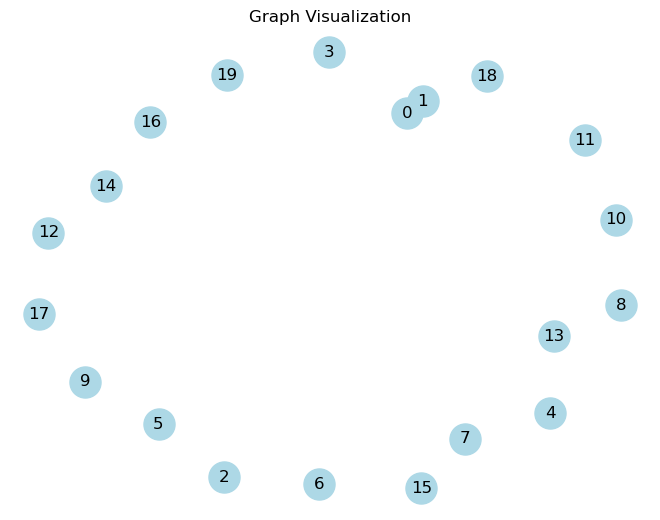

In [29]:
visualize_graph(graphs[3])

In [30]:
!pip install torch_geometric

In [31]:
import networkx as nx
import torch
import numpy as np
import pandas as pd
from torch_geometric.datasets import Planetoid
from torch_geometric.utils.convert import to_networkx

In [32]:
import torch

# Example graph object from the user's data
graph = graphs[3]

# Extracting edge indices
edge_indices = graph.edge_index.t().tolist()

# Extracting node features (assuming each node has a feature vector)
node_features = graph.x.tolist()

# The nodes can be represented as a list of indices from 0 to the number of nodes - 1
node_indices = list(range(len(node_features)))

# Displaying the node indices and edge indices
#node_indices, edge_indices
#print(node_features)

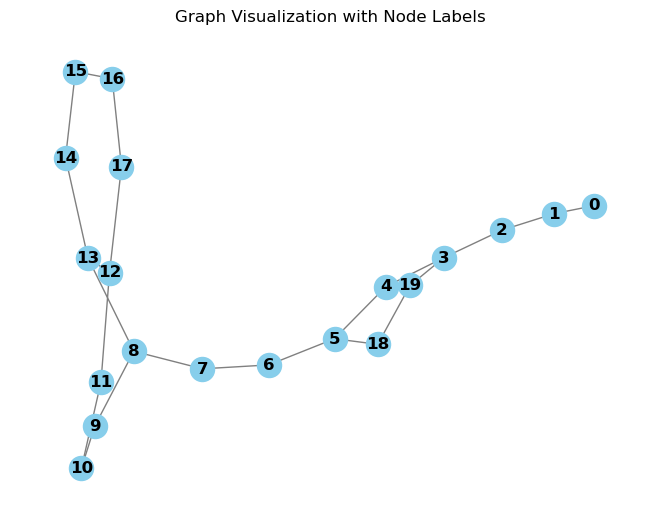

In [33]:
import networkx as nx
import torch_geometric

edge_index = torch.tensor(edge_indices, dtype=torch.long)
x = torch.tensor(node_indices, dtype=torch.float)

data = torch_geometric.data.Data(x=x, edge_index=edge_index)
g = torch_geometric.utils.to_networkx(data, to_undirected=True)

# Draw the graph with node labels
pos = nx.spring_layout(g)  # Compute layout
nx.draw(g, pos, with_labels=True, font_weight='bold', node_color='skyblue', edge_color='gray')
plt.title("Graph Visualization with Node Labels")
plt.show()

In [34]:
# Print the edge indices
print(graphs[3].edge_index.t().tolist())

[[0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 5, 18, 18, 19, 19, 3, 13, 8, 17, 12], [1, 0, 2, 1, 3, 2, 4, 3, 5, 4, 6, 5, 7, 6, 8, 7, 9, 8, 10, 9, 11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15, 17, 16, 18, 5, 19, 18, 3, 19, 8, 13, 12, 17]]


In [35]:
# graphs[0] is a torch_geometric.data.Data object from your graphs list
graph = graphs[3]

# Print node features
print("Len of graph:", len(graph))
print("Node Features:")
print(len(graph.x))
#for i, node_feature in enumerate(graph.x):
    #print(f"Node {i}: {node_feature}")

# Print edge pairs and edge features
print("\nEdge Pairs and Features:")
print(graph.edge_index.t())
for i, edge in enumerate(graph.edge_index.t()):
    src, dest = edge[0].item(), edge[1].item()
    edge_feature = graph.edge_attr[i]
    #print(f"Edge {i} - Source: {src}, Destination: {dest}, Features: {edge_feature}")


Len of graph: 3
Node Features:
20

Edge Pairs and Features:
tensor([[ 0,  1,  1,  2,  2,  3,  3,  4,  4,  5,  5,  6,  6,  7,  7,  8,  8,  9,
          9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17,  5, 18,
         18, 19, 19,  3, 13,  8, 17, 12],
        [ 1,  0,  2,  1,  3,  2,  4,  3,  5,  4,  6,  5,  7,  6,  8,  7,  9,  8,
         10,  9, 11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15, 17, 16, 18,  5,
         19, 18,  3, 19,  8, 13, 12, 17]])


In [36]:
# Extracting edge list and edge features from the provided graph
graph = graphs[5]  

# Extracting edge index
edge_index = graph.edge_index.t()

# Preparing the edge list
edge_list = []
for i in range(edge_index.shape[1]):
    edge = edge_index[:, i]
    edge_list.append((edge[0].item(), edge[1].item()))

edge_list


[(0, 1),
 (1, 0),
 (1, 2),
 (2, 1),
 (2, 3),
 (3, 2),
 (3, 4),
 (4, 3),
 (4, 5),
 (5, 4),
 (5, 6),
 (6, 5),
 (6, 7),
 (7, 6),
 (7, 8),
 (8, 7),
 (7, 9),
 (9, 7),
 (9, 10),
 (10, 9),
 (1, 11),
 (11, 1),
 (11, 12),
 (12, 11),
 (12, 13),
 (13, 12),
 (13, 14),
 (14, 13),
 (14, 15),
 (15, 14),
 (15, 16),
 (16, 15),
 (16, 17),
 (17, 16),
 (17, 18),
 (18, 17),
 (18, 19),
 (19, 18),
 (19, 20),
 (20, 19),
 (20, 21),
 (21, 20),
 (21, 22),
 (22, 21),
 (22, 23),
 (23, 22),
 (14, 24),
 (24, 14),
 (24, 25),
 (25, 24),
 (10, 4),
 (4, 10),
 (25, 11),
 (11, 25),
 (23, 15),
 (15, 23),
 (23, 18),
 (18, 23)]

In [37]:
import torch
from torch_geometric.data import Data

# Assuming graph_data is your list of graph objects
# graph_data[0] is the first graph object

# Select the first graph object
first_graph = graphs[3]

# Convert node features to a floating-point type if they aren't already
node_features_float = first_graph.x.float()

# Inspect node features
print("Node features (x) of the first graph:")
print(node_features_float)
print("Shape of node features:", node_features_float.shape)

# Inspect edge features
print("\nEdge features (edge_attr) of the first graph:")
print(first_graph.edge_attr)
print("Shape of edge features:", first_graph.edge_attr.shape)

# Inspect edge index (connectivity)
print("\nEdge index (edge_index) of the first graph:")
print(first_graph.edge_index)
print("Shape of edge index:", first_graph.edge_index.shape)

# Calculate min and max for each node feature of the first graph
min_values, max_values = node_features_float.min(dim=0)[0], node_features_float.max(dim=0)[0]

print("\nMinimum values of node features:", min_values)
print("Maximum values of node features:", max_values)

# Calculate the standard deviation for each node feature
std_deviation = node_features_float.std(dim=0)
print("\nStandard deviation of node features:", std_deviation)


Node features (x) of the first graph:
tensor([[ 0.0000,  0.0000,  1.0000,  ...,  0.0000,  0.0000, -0.3944],
        [ 1.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0628],
        [ 1.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0658],
        ...,
        [ 1.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0275],
        [ 0.0000,  1.0000,  0.0000,  ...,  0.0000,  0.0000, -0.1335],
        [ 0.0000,  1.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0670]])
Shape of node features: torch.Size([20, 72])

Edge features (edge_attr) of the first graph:
tensor([[1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 1., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 1., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 1., 1.,

In [38]:
smiles_df['SMILES'][3]

'OCCn1cc(CNc2cccc3c2CCCC3)nn1'

In [39]:
mol = Chem.MolFromSmiles(smiles_df['SMILES'][3])
AllChem.ComputeGasteigerCharges(mol)

In [40]:
edge_indices = []
for bond in mol.GetBonds():
    start_idx = bond.GetBeginAtomIdx()
    end_idx = bond.GetEndAtomIdx()
    edge_indices.append((start_idx, end_idx))
    edge_indices.append((end_idx, start_idx))  # Add the reverse direction


In [41]:
edge_indices

[(0, 1),
 (1, 0),
 (1, 2),
 (2, 1),
 (2, 3),
 (3, 2),
 (3, 4),
 (4, 3),
 (4, 5),
 (5, 4),
 (5, 6),
 (6, 5),
 (6, 7),
 (7, 6),
 (7, 8),
 (8, 7),
 (8, 9),
 (9, 8),
 (9, 10),
 (10, 9),
 (10, 11),
 (11, 10),
 (11, 12),
 (12, 11),
 (12, 13),
 (13, 12),
 (13, 14),
 (14, 13),
 (14, 15),
 (15, 14),
 (15, 16),
 (16, 15),
 (16, 17),
 (17, 16),
 (5, 18),
 (18, 5),
 (18, 19),
 (19, 18),
 (19, 3),
 (3, 19),
 (13, 8),
 (8, 13),
 (17, 12),
 (12, 17)]

In [42]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import DataLoader
from sklearn.model_selection import train_test_split
import pandas as pd
from torch_geometric.nn import GCNConv, global_mean_pool
from torch.nn import Linear

In [43]:
print((graphs[0]))
print((smiles_df.head(1)))

Data(x=[25, 72], edge_index=[54, 2], edge_attr=[54, 10])
                                   SMILES
0  CN(c1ccccc1)c1ccccc1C(=O)NCC1(O)CCOCC1


In [44]:
print(len(graphs))
print(len(smiles_df))

50001
50001


In [45]:
# Check lengths after removal
print("Length of smiles_df:", len(smiles_df))


Length of smiles_df: 50001


In [46]:
smiles_df.head(5)

,SMILES
0,CN(c1ccccc1)c1ccccc1C(=O)NCC1(O)CCOCC1
1,CC[NH+](CC)C1CCC([NH2+]C2CC2)(C(=O)[O-])C1
2,COCC(CNC(=O)c1ccc2c(c1)NC(=O)C2)OC
3,OCCn1cc(CNc2cccc3c2CCCC3)nn1
4,CCCCCCc1ccc(C#Cc2ccc(C#CC3=CC=C(CCC)CC3)c(C3CC...


In [47]:
print(type(graphs[3]))

<class 'torch_geometric.data.data.Data'>


In [48]:
# Unsupervised Graph Generative Adversarial Netwrok

In [49]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv

In [50]:
def generate_random_edge_index(num_nodes):
    # Example implementation to generate a random edge_index
    # Here we create a fully connected graph for simplicity
    edge_index = torch.combinations(torch.arange(num_nodes), r=2)
    return torch.cat([edge_index, edge_index.flip([1])], dim=0).t()  # Making it undirected

In [51]:
import torch
from torch_geometric.data import Data
from torch_geometric.data import Data, Batch
from torch_geometric.utils import erdos_renyi_graph

def generate_random_noise(batch_size, node_feature_dim, edge_feature_dim, max_num_nodes):
    """
    Generate random noise for a batch of graphs with variable number of nodes and edges,
    but fixed node feature and edge feature dimensions.

    Args:
    - batch_size (int): Number of random graphs to generate.
    - node_feature_dim (int): Number of features for each node.
    - edge_feature_dim (int): Number of features for each edge.
    - max_num_nodes (int): Maximum number of nodes a graph can have.

    Returns:
    - A list of Data objects containing random noise for node and edge features.
    """
    random_graphs = []

    for _ in range(batch_size):
        # Randomly determine the number of nodes for this graph
        num_nodes = torch.randint(low=1, high=max_num_nodes, size=(1,)).item()

        # Generate random node features
        x = torch.randn(num_nodes, node_feature_dim)

        # Generate a random graph structure (edge_index)
        edge_index = erdos_renyi_graph(num_nodes, edge_prob=0.5)  # p is the probability of an edge

        # Generate random edge features (if needed)
        num_edges = edge_index.size(1)
        edge_attr = torch.randn(num_edges, edge_feature_dim) if edge_feature_dim > 0 else None

        # Create a Data object
        data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
        random_graphs.append(data)

    #return random_graphs
    return Batch.from_data_list(random_graphs)





In [52]:
# Example usage
batch_size = 32
node_feature_dim = 72  # Number of node features
edge_feature_dim = 10  # Number of edge features, adjust as needed
max_num_nodes = 50    # Maximum number of nodes in a graph

random_noise_graphs = generate_random_noise(batch_size, node_feature_dim, edge_feature_dim, max_num_nodes)

In [53]:
random_noise_graphs 

DataBatch(x=[717, 72], edge_index=[2, 11230], edge_attr=[11230, 10], batch=[717], ptr=[33])

In [54]:
# Generator Model
class Generator_v1(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(Generator, self).__init__()
        self.layer1 = GCNConv(input_dim, hidden_dim)
        #print("input_dim")
        self.layer2 = GCNConv(hidden_dim, output_dim)
    
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        #print("x, edge_index gen",type(x), type(edge_index))
        #print("x, edge_index gen",x.size(), edge_index.size())
        #print("x, edge_index gen",x, edge_index)
        x = torch.relu(self.layer1(x, edge_index))
        #print("Generator x layer 1:",x)
        x = torch.sigmoid(self.layer2(x, edge_index))
        #print("Generator x  layer 2:",x)
        return x

In [55]:
# Generator Model
class Generator(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(Generator, self).__init__()
        self.layer1 = GCNConv(input_dim, hidden_dim)
        #print("input_dim")
        self.layer2 = GCNConv(hidden_dim, output_dim)    

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = torch.relu(self.layer1(x, edge_index))
        x = torch.sigmoid(self.layer2(x, edge_index))

        # Generate fake edge_index (simple example, should be improved)
        fake_edge_index = self.generate_fake_edge_index(x.size(0))
        return x, fake_edge_index

    def generate_fake_edge_index(self, num_nodes):
        # Implement logic to generate a plausible edge_index for fake graphs
        # Placeholder logic: create a simple linear chain graph
        edge_index = torch.tensor([[i, i+1] for i in range(num_nodes - 1)], dtype=torch.long).t()
        return edge_index


In [56]:
# Discriminator Model  
class Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Discriminator, self).__init__()
        #print("In discriminator")
        self.layer1 = GCNConv(input_dim, hidden_dim)
        #print("self.layer1",input_dim,hidden_dim)
        self.layer2 = nn.Linear(hidden_dim, 1)
        #print("self.layer2",hidden_dim)
    
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        #print("x, edge_index1",type(x), type(edge_index))
        #print("x, edge_index2",x.size(), edge_index.size())
        #print("x, edge_index3",x, edge_index)
        x = torch.relu(self.layer1(x, edge_index))
        #print("x 2",x)
        x = torch.sigmoid(self.layer2(x))
        #print("x 3",x)
        return x

In [57]:
# Model Initialization
generator_input_dim = 72
generator_hidden_dim = 256
#generator_hidden_dim = 128
generator_output_dim = 72

discriminator_input_dim = 72
discriminator_hidden_dim = 256
#discriminator_hidden_dim = 128

In [58]:
generator = Generator(generator_input_dim, generator_hidden_dim, generator_output_dim)
discriminator = Discriminator(discriminator_input_dim, discriminator_hidden_dim)

In [59]:
import torch.optim as optim
from torch_geometric.data import DataLoader
#from torch_geometric.loader import DataLoader

from torch.utils.data import Dataset

# Sample data loader (replace with your dataset)
#data_loader = DataLoader(graphs, batch_size=32, shuffle=True)
#data_loader = DataLoader(graphs, batch_size=32, shuffle=True, follow_batch=['x', 'edge_index'])
data_loader = DataLoader(graphs, batch_size=32, shuffle=True, follow_batch=[])



# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.001)
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.001)

# Loss function
adversarial_loss = torch.nn.BCELoss()

C:\Users\Malli\anaconda3\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


In [60]:
# Function to calculate discriminator accuracy
def calculate_discriminator_accuracy(discriminator, real_data, fake_data):
    real_predictions = discriminator(real_data).round()
    fake_predictions = discriminator(fake_data).round()
    correct_predictions = (real_predictions == 1).sum() + (fake_predictions == 0).sum()
    total_predictions = real_predictions.numel() + fake_predictions.numel()
    accuracy = 100 * correct_predictions.float() / total_predictions
    return accuracy

In [61]:
print((data_loader))

In [62]:
print((graphs[3].x).shape)
print((graphs[3].edge_index).shape)

torch.Size([20, 72])
torch.Size([44, 2])


In [63]:
print((graphs[0].x).shape)
print((graphs[0].edge_index).shape)

torch.Size([25, 72])
torch.Size([54, 2])


In [64]:
import torch
from torch_geometric.data import Data
from torch_geometric.data import Batch

def custom_graph_data_loader(graph_dataset, batch_size):
    """
    Custom data loader for graph data.
    
    Args:
    - graph_dataset (list of Data): The dataset containing graph Data objects.
    - batch_size (int): The size of each batch.

    Yields:
    - Batched Data object containing a batch of graphs.
    """

    def batch_graphs(graphs):
        """
        Manually batches a list of graphs into a single Batch object.
        """
        batched_edge_index = []
        batched_x = []
        batched_batch = []

        current_node_idx = 0
        for i, graph in enumerate(graphs):
            # Offset the node indices by the current_node_idx and add them to the batched edge index.
            #edge_index_offset = graph.edge_index + current_node_idx
            #batched_edge_index.append(edge_index_offset)
            
            # Offset only the node indices in the edge_index tensor.
            edge_index_offset = graph.edge_index.clone()  # Make a copy to avoid modifying the original graph
            edge_index_offset[0, :] += current_node_idx  # Offset source node indices
            edge_index_offset[1, :] += current_node_idx  # Offset target node indices
            #batched_edge_index.append(edge_index_offset)            
            
            #Tring edge_index
            #batched_edge_index.append(graph.edge_index)
            batched_edge_index.append(graph.edge_index + current_node_idx)

            # Add the current graph's node features to the batched node features.
            batched_x.append(graph.x)

            # Add the graph index to the batch vector for all nodes of this graph.
            batched_batch.append(torch.full((graph.x.size(0),), i, dtype=torch.long))

            # Update the current_node_idx for the next graph.
            current_node_idx += graph.x.size(0)

        # Concatenate all the lists to create tensors.       
        
        batched_edge_index = torch.cat(batched_edge_index, dim=0)
        batched_x = torch.cat(batched_x, dim=0)
        batched_batch = torch.cat(batched_batch, dim=0)
        

        # Create a new Data object to hold the batched graph.
        batched_data = Data(x=batched_x, edge_index=batched_edge_index)
        batched_data.batch = batched_batch

        return batched_data

    # Shuffle dataset at the beginning of each epoch
    indices = torch.randperm(len(graph_dataset))
    
    for start in range(0, len(indices), batch_size):
        end = start + batch_size
        batch_indices = indices[start:end]
        batch_graphs_list = [graph_dataset[i] for i in batch_indices]
        batch = batch_graphs(batch_graphs_list)
        yield batch


In [65]:
import matplotlib.pyplot as plt
import torch

def calculate_accuracy(preds, labels):
    predicted_labels = preds.round()  # Convert probabilities to 0/1
    correct = (predicted_labels == labels).float()  # Convert into float for division 
    accuracy = correct.sum() / len(correct)
    return accuracy

In [66]:
num_epochs = 50
batch_size = 32

# Lists to store metrics
epochs = []
d_losses = []
g_losses = []
real_accuracy_list =[]
fake_accuracy_list=[]
d_accuracies = []


for epoch in range(num_epochs):
    print("epoch", epoch)
    for batch in custom_graph_data_loader(graphs, batch_size):
        # Generate fake data
        random_noise_graphs_batch = generate_random_noise(batch_size, node_feature_dim, edge_feature_dim, max_num_nodes)
        fake_x, fake_edge_index = generator(random_noise_graphs_batch)

        # Ensure the real edge_index is correctly shaped [2, num_edges]
        if batch.edge_index.size(0) != 2:
            batch.edge_index = batch.edge_index.t()  # Transpose if necessary        
        
        # Create fake data batch with both x and edge_index
        fake_data = Data(x=fake_x, edge_index=fake_edge_index)

        # Labels for real and fake data (for each node)
        real_labels = torch.ones(batch.x.size(0), 1)
        fake_labels = torch.zeros(fake_data.x.size(0), 1)

        # Train Discriminator
        optimizer_D.zero_grad()
        real_loss = adversarial_loss(discriminator(batch), real_labels)
        fake_loss = adversarial_loss(discriminator(fake_data), fake_labels)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        # Recompute fake data and perform forward pass through discriminator
        fake_x, fake_edge_index = generator(random_noise_graphs_batch)
        fake_data = Data(x=fake_x, edge_index=fake_edge_index)
        updated_real_labels = torch.ones(fake_data.x.size(0), 1)
        g_loss = adversarial_loss(discriminator(fake_data), updated_real_labels)
        g_loss.backward()
        optimizer_G.step()
        
        
        # Calculate discriminator accuracy
        real_accuracy = calculate_accuracy(discriminator(batch).detach(), real_labels)
        print("real_accuracy",real_accuracy)
        fake_accuracy = calculate_accuracy(discriminator(fake_data).detach(), fake_labels)
        print("fake_accuracy",fake_accuracy)
        d_accuracy = (real_accuracy + fake_accuracy) / 2

        # Store metrics
        d_losses.append(d_loss.item())
        print("d_loss.item()",d_loss.item())
        g_losses.append(g_loss.item())
        print("g_loss.item()",g_loss.item())
        d_accuracies.append(d_accuracy.item())
        real_accuracy_list.append(real_accuracy.item())
        fake_accuracy_list.append(fake_accuracy.item())
        
        epochs.append(epoch)


epoch 0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 1.5079710483551025
g_loss.item() 0.6149992346763611
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 1.426053762435913
g_loss.item() 0.6851738095283508
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.3459194898605347
g_loss.item() 0.7591425776481628
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.2726815938949585
g_loss.item() 0.837112307548523
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.204672932624817
g_loss.item() 0.9158581495285034
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.1480686664581299
g_loss.item() 0.9992089867591858
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.0907114744186401
g_loss.item() 1.0828202962875366
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.0453284978866577
g_loss.item() 1.1674128770828247
real_accuracy tensor(1.)
fake_accuracy tensor(1.)
d_loss.item() 1.0

real_accuracy tensor(1.)
fake_accuracy tensor(0.8592)
d_loss.item() 0.5009864568710327
g_loss.item() 1.841499924659729
real_accuracy tensor(1.)
fake_accuracy tensor(0.9419)
d_loss.item() 0.4801720082759857
g_loss.item() 1.732726812362671
real_accuracy tensor(1.)
fake_accuracy tensor(0.8852)
d_loss.item() 0.5723817944526672
g_loss.item() 1.5748393535614014
real_accuracy tensor(1.)
fake_accuracy tensor(0.8721)
d_loss.item() 0.6644284725189209
g_loss.item() 1.3584610223770142
real_accuracy tensor(1.)
fake_accuracy tensor(0.9427)
d_loss.item() 0.5537309646606445
g_loss.item() 1.6361912488937378
real_accuracy tensor(1.)
fake_accuracy tensor(0.8910)
d_loss.item() 0.6040632724761963
g_loss.item() 1.7175002098083496
real_accuracy tensor(1.)
fake_accuracy tensor(0.9342)
d_loss.item() 0.5359787344932556
g_loss.item() 1.9155889749526978
real_accuracy tensor(1.)
fake_accuracy tensor(0.9388)
d_loss.item() 0.6119551658630371
g_loss.item() 1.6588019132614136
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(0.8318)
fake_accuracy tensor(1.)
d_loss.item() 0.8316407203674316
g_loss.item() 1.3747637271881104
real_accuracy tensor(0.8174)
fake_accuracy tensor(1.)
d_loss.item() 0.8190457820892334
g_loss.item() 1.4053266048431396
real_accuracy tensor(0.8445)
fake_accuracy tensor(1.)
d_loss.item() 0.7827482223510742
g_loss.item() 1.437998652458191
real_accuracy tensor(0.8507)
fake_accuracy tensor(1.)
d_loss.item() 0.7527002692222595
g_loss.item() 1.4724758863449097
real_accuracy tensor(0.8308)
fake_accuracy tensor(1.)
d_loss.item() 0.7610659599304199
g_loss.item() 1.4884074926376343
real_accuracy tensor(0.8456)
fake_accuracy tensor(1.)
d_loss.item() 0.7272762060165405
g_loss.item() 1.5111072063446045
real_accuracy tensor(0.8734)
fake_accuracy tensor(1.)
d_loss.item() 0.6985765695571899
g_loss.item() 1.498284101486206
real_accuracy tensor(0.8776)
fake_accuracy tensor(1.)
d_loss.item() 0.6787431240081787
g_loss.item() 1.5070109367370605
real_accuracy tensor(0.9071)
fake_accuracy

real_accuracy tensor(0.9501)
fake_accuracy tensor(1.)
d_loss.item() 0.6353753805160522
g_loss.item() 1.3722485303878784
real_accuracy tensor(0.9573)
fake_accuracy tensor(0.9734)
d_loss.item() 0.6779481768608093
g_loss.item() 1.3410358428955078
real_accuracy tensor(0.9535)
fake_accuracy tensor(0.9808)
d_loss.item() 0.7154712677001953
g_loss.item() 1.293352484703064
real_accuracy tensor(0.9178)
fake_accuracy tensor(0.9954)
d_loss.item() 0.7056242227554321
g_loss.item() 1.4149508476257324
real_accuracy tensor(0.9586)
fake_accuracy tensor(1.)
d_loss.item() 0.6436061263084412
g_loss.item() 1.4394783973693848
real_accuracy tensor(0.9328)
fake_accuracy tensor(1.)
d_loss.item() 0.6271910667419434
g_loss.item() 1.5708204507827759
real_accuracy tensor(0.9352)
fake_accuracy tensor(1.)
d_loss.item() 0.6396885514259338
g_loss.item() 1.532706618309021
real_accuracy tensor(0.9504)
fake_accuracy tensor(1.)
d_loss.item() 0.5961908102035522
g_loss.item() 1.6519356966018677
real_accuracy tensor(0.9470)
f

real_accuracy tensor(0.8935)
fake_accuracy tensor(0.5297)
d_loss.item() 1.1117963790893555
g_loss.item() 0.6987542510032654
real_accuracy tensor(0.8390)
fake_accuracy tensor(0.3966)
d_loss.item() 1.202402949333191
g_loss.item() 0.6585780382156372
real_accuracy tensor(0.7581)
fake_accuracy tensor(0.4902)
d_loss.item() 1.250950574874878
g_loss.item() 0.6786577105522156
real_accuracy tensor(0.7494)
fake_accuracy tensor(0.5051)
d_loss.item() 1.2636826038360596
g_loss.item() 0.6884890198707581
real_accuracy tensor(0.7790)
fake_accuracy tensor(0.5565)
d_loss.item() 1.2346670627593994
g_loss.item() 0.719465434551239
real_accuracy tensor(0.7619)
fake_accuracy tensor(0.5388)
d_loss.item() 1.2764590978622437
g_loss.item() 0.6949759721755981
real_accuracy tensor(0.7042)
fake_accuracy tensor(0.7222)
d_loss.item() 1.3312325477600098
g_loss.item() 0.7550725340843201
real_accuracy tensor(0.7549)
fake_accuracy tensor(0.4796)
d_loss.item() 1.3580212593078613
g_loss.item() 0.6922392845153809
real_accura

real_accuracy tensor(0.9241)
fake_accuracy tensor(1.)
d_loss.item() 0.3600594401359558
g_loss.item() 2.3601319789886475
real_accuracy tensor(0.9481)
fake_accuracy tensor(1.)
d_loss.item() 0.31417691707611084
g_loss.item() 2.3558900356292725
real_accuracy tensor(0.9689)
fake_accuracy tensor(1.)
d_loss.item() 0.29161497950553894
g_loss.item() 2.2076926231384277
real_accuracy tensor(0.9451)
fake_accuracy tensor(1.)
d_loss.item() 0.3498356342315674
g_loss.item() 2.1551990509033203
real_accuracy tensor(0.9390)
fake_accuracy tensor(1.)
d_loss.item() 0.33767765760421753
g_loss.item() 2.106264114379883
real_accuracy tensor(0.9569)
fake_accuracy tensor(1.)
d_loss.item() 0.33006560802459717
g_loss.item() 1.9063622951507568
real_accuracy tensor(0.9748)
fake_accuracy tensor(1.)
d_loss.item() 0.3192727267742157
g_loss.item() 1.7823814153671265
real_accuracy tensor(0.9522)
fake_accuracy tensor(1.)
d_loss.item() 0.3809913992881775
g_loss.item() 1.7588053941726685
real_accuracy tensor(0.9490)
fake_acc

d_loss.item() 1.0407953262329102
g_loss.item() 1.5106935501098633
real_accuracy tensor(0.6952)
fake_accuracy tensor(1.)
d_loss.item() 0.9339694976806641
g_loss.item() 1.5273327827453613
real_accuracy tensor(0.7075)
fake_accuracy tensor(1.)
d_loss.item() 0.9458943605422974
g_loss.item() 1.5515062808990479
real_accuracy tensor(0.6986)
fake_accuracy tensor(1.)
d_loss.item() 0.9558807015419006
g_loss.item() 1.4415401220321655
real_accuracy tensor(0.7193)
fake_accuracy tensor(1.)
d_loss.item() 0.8472366333007812
g_loss.item() 1.5119410753250122
real_accuracy tensor(0.7443)
fake_accuracy tensor(1.)
d_loss.item() 0.8513237237930298
g_loss.item() 1.4306297302246094
real_accuracy tensor(0.7041)
fake_accuracy tensor(1.)
d_loss.item() 0.9667210578918457
g_loss.item() 1.4535568952560425
real_accuracy tensor(0.7002)
fake_accuracy tensor(0.9989)
d_loss.item() 1.0201342105865479
g_loss.item() 1.2627416849136353
real_accuracy tensor(0.7602)
fake_accuracy tensor(1.)
d_loss.item() 0.8497020602226257
g_l

real_accuracy tensor(0.9132)
fake_accuracy tensor(1.)
d_loss.item() 0.2682555615901947
g_loss.item() 3.5285303592681885
real_accuracy tensor(0.9249)
fake_accuracy tensor(1.)
d_loss.item() 0.24088416993618011
g_loss.item() 3.608210563659668
real_accuracy tensor(0.9326)
fake_accuracy tensor(1.)
d_loss.item() 0.2048734575510025
g_loss.item() 3.6945717334747314
real_accuracy tensor(0.9459)
fake_accuracy tensor(1.)
d_loss.item() 0.16934166848659515
g_loss.item() 3.7824339866638184
real_accuracy tensor(0.9539)
fake_accuracy tensor(1.)
d_loss.item() 0.13739165663719177
g_loss.item() 3.8850793838500977
real_accuracy tensor(0.9199)
fake_accuracy tensor(1.)
d_loss.item() 0.20271974802017212
g_loss.item() 3.8856821060180664
real_accuracy tensor(0.9658)
fake_accuracy tensor(1.)
d_loss.item() 0.1268039047718048
g_loss.item() 3.978914976119995
real_accuracy tensor(0.9556)
fake_accuracy tensor(1.)
d_loss.item() 0.14821062982082367
g_loss.item() 4.028712272644043
real_accuracy tensor(0.9700)
fake_accu

real_accuracy tensor(0.9628)
fake_accuracy tensor(1.)
d_loss.item() 0.21910971403121948
g_loss.item() 2.7785332202911377
real_accuracy tensor(0.9661)
fake_accuracy tensor(1.)
d_loss.item() 0.22199878096580505
g_loss.item() 2.8187732696533203
real_accuracy tensor(0.9756)
fake_accuracy tensor(1.)
d_loss.item() 0.1972925066947937
g_loss.item() 2.8049941062927246
real_accuracy tensor(0.9782)
fake_accuracy tensor(1.)
d_loss.item() 0.19998911023139954
g_loss.item() 2.9314167499542236
real_accuracy tensor(0.9761)
fake_accuracy tensor(1.)
d_loss.item() 0.19390995800495148
g_loss.item() 2.964400053024292
real_accuracy tensor(0.9682)
fake_accuracy tensor(1.)
d_loss.item() 0.2227351814508438
g_loss.item() 2.874786853790283
real_accuracy tensor(0.9668)
fake_accuracy tensor(1.)
d_loss.item() 0.21347501873970032
g_loss.item() 2.985349655151367
real_accuracy tensor(0.9781)
fake_accuracy tensor(1.)
d_loss.item() 0.215743750333786
g_loss.item() 2.833437204360962
real_accuracy tensor(0.9874)
fake_accura

fake_accuracy tensor(1.)
d_loss.item() 0.23163507878780365
g_loss.item() 2.634375810623169
real_accuracy tensor(0.9780)
fake_accuracy tensor(1.)
d_loss.item() 0.22079616785049438
g_loss.item() 2.7438602447509766
real_accuracy tensor(0.9848)
fake_accuracy tensor(1.)
d_loss.item() 0.2560938000679016
g_loss.item() 2.5842275619506836
real_accuracy tensor(0.9797)
fake_accuracy tensor(1.)
d_loss.item() 0.22221817076206207
g_loss.item() 2.796051025390625
real_accuracy tensor(0.9661)
fake_accuracy tensor(1.)
d_loss.item() 0.24557483196258545
g_loss.item() 2.7812769412994385
real_accuracy tensor(0.9470)
fake_accuracy tensor(1.)
d_loss.item() 0.2658390402793884
g_loss.item() 2.736686944961548
real_accuracy tensor(0.9552)
fake_accuracy tensor(1.)
d_loss.item() 0.253515362739563
g_loss.item() 2.761244297027588
real_accuracy tensor(0.9580)
fake_accuracy tensor(1.)
d_loss.item() 0.2622630298137665
g_loss.item() 2.8221218585968018
real_accuracy tensor(0.9587)
fake_accuracy tensor(1.)
d_loss.item() 0.

real_accuracy tensor(0.9733)
fake_accuracy tensor(1.)
d_loss.item() 0.18991024792194366
g_loss.item() 2.955488681793213
real_accuracy tensor(0.9681)
fake_accuracy tensor(1.)
d_loss.item() 0.21155400574207306
g_loss.item() 2.9768660068511963
real_accuracy tensor(0.9836)
fake_accuracy tensor(1.)
d_loss.item() 0.20217910408973694
g_loss.item() 2.922395706176758
real_accuracy tensor(0.9859)
fake_accuracy tensor(1.)
d_loss.item() 0.14457061886787415
g_loss.item() 3.1779067516326904
real_accuracy tensor(0.9871)
fake_accuracy tensor(1.)
d_loss.item() 0.1729937195777893
g_loss.item() 3.179736375808716
real_accuracy tensor(0.9828)
fake_accuracy tensor(1.)
d_loss.item() 0.16135059297084808
g_loss.item() 3.2354040145874023
real_accuracy tensor(0.9821)
fake_accuracy tensor(1.)
d_loss.item() 0.16631625592708588
g_loss.item() 3.2209527492523193
real_accuracy tensor(0.9768)
fake_accuracy tensor(1.)
d_loss.item() 0.15648755431175232
g_loss.item() 3.335736036300659
real_accuracy tensor(0.9774)
fake_acc

real_accuracy tensor(0.9954)
fake_accuracy tensor(1.)
d_loss.item() 0.06172209233045578
g_loss.item() 4.803237438201904
real_accuracy tensor(0.9890)
fake_accuracy tensor(1.)
d_loss.item() 0.07563375681638718
g_loss.item() 4.788120746612549
real_accuracy tensor(0.9939)
fake_accuracy tensor(1.)
d_loss.item() 0.06440117955207825
g_loss.item() 4.8289713859558105
real_accuracy tensor(0.9806)
fake_accuracy tensor(1.)
d_loss.item() 0.07821479439735413
g_loss.item() 4.77710485458374
real_accuracy tensor(0.9960)
fake_accuracy tensor(1.)
d_loss.item() 0.05299566686153412
g_loss.item() 4.803663730621338
real_accuracy tensor(0.9921)
fake_accuracy tensor(1.)
d_loss.item() 0.06320828199386597
g_loss.item() 4.776240825653076
real_accuracy tensor(0.9975)
fake_accuracy tensor(1.)
d_loss.item() 0.05202588066458702
g_loss.item() 4.710663318634033
real_accuracy tensor(0.9924)
fake_accuracy tensor(1.)
d_loss.item() 0.05393023043870926
g_loss.item() 4.671959400177002
real_accuracy tensor(0.9951)
fake_accura

real_accuracy tensor(0.9096)
fake_accuracy tensor(1.)
d_loss.item() 0.27170243859291077
g_loss.item() 3.638309955596924
real_accuracy tensor(0.9131)
fake_accuracy tensor(1.)
d_loss.item() 0.2710680067539215
g_loss.item() 3.74861478805542
real_accuracy tensor(0.8933)
fake_accuracy tensor(1.)
d_loss.item() 0.30756235122680664
g_loss.item() 3.818676233291626
real_accuracy tensor(0.8821)
fake_accuracy tensor(1.)
d_loss.item() 0.31008028984069824
g_loss.item() 3.917165994644165
real_accuracy tensor(0.9126)
fake_accuracy tensor(1.)
d_loss.item() 0.28337591886520386
g_loss.item() 3.896307945251465
real_accuracy tensor(0.9033)
fake_accuracy tensor(1.)
d_loss.item() 0.27751287817955017
g_loss.item() 3.8762545585632324
real_accuracy tensor(0.9175)
fake_accuracy tensor(1.)
d_loss.item() 0.24741922318935394
g_loss.item() 3.8138740062713623
real_accuracy tensor(0.9265)
fake_accuracy tensor(1.)
d_loss.item() 0.2224932760000229
g_loss.item() 3.7646288871765137
real_accuracy tensor(0.9224)
fake_accura

real_accuracy tensor(0.9266)
fake_accuracy tensor(1.)
d_loss.item() 0.3508554697036743
g_loss.item() 2.027650833129883
real_accuracy tensor(0.9211)
fake_accuracy tensor(1.)
d_loss.item() 0.34973418712615967
g_loss.item() 2.136056423187256
real_accuracy tensor(0.8652)
fake_accuracy tensor(1.)
d_loss.item() 0.4339071810245514
g_loss.item() 2.2978622913360596
real_accuracy tensor(0.9277)
fake_accuracy tensor(1.)
d_loss.item() 0.2994900345802307
g_loss.item() 2.4353854656219482
real_accuracy tensor(0.9369)
fake_accuracy tensor(1.)
d_loss.item() 0.28590723872184753
g_loss.item() 2.572765827178955
real_accuracy tensor(0.9357)
fake_accuracy tensor(1.)
d_loss.item() 0.25063374638557434
g_loss.item() 2.6844139099121094
real_accuracy tensor(0.9079)
fake_accuracy tensor(1.)
d_loss.item() 0.288854718208313
g_loss.item() 2.8637776374816895
real_accuracy tensor(0.9038)
fake_accuracy tensor(1.)
d_loss.item() 0.2996473014354706
g_loss.item() 2.971550941467285
real_accuracy tensor(0.9174)
fake_accuracy

real_accuracy tensor(0.9855)
fake_accuracy tensor(1.)
d_loss.item() 0.15028569102287292
g_loss.item() 2.6992435455322266
real_accuracy tensor(0.9845)
fake_accuracy tensor(1.)
d_loss.item() 0.1490248739719391
g_loss.item() 2.6643779277801514
real_accuracy tensor(0.9765)
fake_accuracy tensor(1.)
d_loss.item() 0.15681873261928558
g_loss.item() 2.7560346126556396
real_accuracy tensor(0.9624)
fake_accuracy tensor(1.)
d_loss.item() 0.1620677411556244
g_loss.item() 2.829841375350952
real_accuracy tensor(0.9714)
fake_accuracy tensor(1.)
d_loss.item() 0.16755133867263794
g_loss.item() 2.8254098892211914
real_accuracy tensor(0.9729)
fake_accuracy tensor(1.)
d_loss.item() 0.16339640319347382
g_loss.item() 2.898540735244751
real_accuracy tensor(0.9629)
fake_accuracy tensor(1.)
d_loss.item() 0.16651563346385956
g_loss.item() 2.9755189418792725
real_accuracy tensor(0.9586)
fake_accuracy tensor(1.)
d_loss.item() 0.15546798706054688
g_loss.item() 3.066692590713501
real_accuracy tensor(0.9570)
fake_acc

real_accuracy tensor(0.9746)
fake_accuracy tensor(1.)
d_loss.item() 0.17239265143871307
g_loss.item() 2.7036523818969727
real_accuracy tensor(0.9548)
fake_accuracy tensor(1.)
d_loss.item() 0.18100577592849731
g_loss.item() 2.718712329864502
real_accuracy tensor(0.9669)
fake_accuracy tensor(1.)
d_loss.item() 0.19429448246955872
g_loss.item() 2.5819404125213623
real_accuracy tensor(0.9518)
fake_accuracy tensor(1.)
d_loss.item() 0.20733824372291565
g_loss.item() 2.566291570663452
real_accuracy tensor(0.9702)
fake_accuracy tensor(1.)
d_loss.item() 0.20798933506011963
g_loss.item() 2.6365551948547363
real_accuracy tensor(0.9364)
fake_accuracy tensor(1.)
d_loss.item() 0.2436831295490265
g_loss.item() 2.6701138019561768
real_accuracy tensor(0.9562)
fake_accuracy tensor(0.9960)
d_loss.item() 0.21349725127220154
g_loss.item() 2.638511896133423
real_accuracy tensor(0.9596)
fake_accuracy tensor(1.)
d_loss.item() 0.22821208834648132
g_loss.item() 2.5563907623291016
real_accuracy tensor(0.9548)
fak

real_accuracy tensor(0.9307)
fake_accuracy tensor(1.)
d_loss.item() 0.20868824422359467
g_loss.item() 3.1344008445739746
real_accuracy tensor(0.9122)
fake_accuracy tensor(1.)
d_loss.item() 0.25287926197052
g_loss.item() 3.1957528591156006
real_accuracy tensor(0.9215)
fake_accuracy tensor(1.)
d_loss.item() 0.23311318457126617
g_loss.item() 3.3375258445739746
real_accuracy tensor(0.9476)
fake_accuracy tensor(1.)
d_loss.item() 0.18107107281684875
g_loss.item() 3.384902238845825
real_accuracy tensor(0.9206)
fake_accuracy tensor(1.)
d_loss.item() 0.2143368422985077
g_loss.item() 3.3808376789093018
real_accuracy tensor(0.9132)
fake_accuracy tensor(1.)
d_loss.item() 0.23928067088127136
g_loss.item() 3.421461343765259
real_accuracy tensor(0.9404)
fake_accuracy tensor(1.)
d_loss.item() 0.18595393002033234
g_loss.item() 3.4228639602661133
real_accuracy tensor(0.9517)
fake_accuracy tensor(1.)
d_loss.item() 0.17322641611099243
g_loss.item() 3.5120041370391846
real_accuracy tensor(0.9120)
fake_accu

real_accuracy tensor(0.9871)
fake_accuracy tensor(1.)
d_loss.item() 0.12029753625392914
g_loss.item() 3.1712708473205566
real_accuracy tensor(0.9859)
fake_accuracy tensor(1.)
d_loss.item() 0.11370772123336792
g_loss.item() 3.2203285694122314
real_accuracy tensor(0.9929)
fake_accuracy tensor(1.)
d_loss.item() 0.08919389545917511
g_loss.item() 3.4425439834594727
real_accuracy tensor(0.9697)
fake_accuracy tensor(1.)
d_loss.item() 0.12746849656105042
g_loss.item() 3.580348014831543
real_accuracy tensor(0.9550)
fake_accuracy tensor(1.)
d_loss.item() 0.15720564126968384
g_loss.item() 3.515850782394409
real_accuracy tensor(0.9584)
fake_accuracy tensor(1.)
d_loss.item() 0.13380217552185059
g_loss.item() 3.5605478286743164
real_accuracy tensor(0.9514)
fake_accuracy tensor(1.)
d_loss.item() 0.1371418833732605
g_loss.item() 3.693265676498413
real_accuracy tensor(0.9728)
fake_accuracy tensor(1.)
d_loss.item() 0.11992847919464111
g_loss.item() 3.288729429244995
real_accuracy tensor(0.9523)
fake_acc

real_accuracy tensor(0.9088)
fake_accuracy tensor(1.)
d_loss.item() 0.29081910848617554
g_loss.item() 2.3797295093536377
real_accuracy tensor(0.9414)
fake_accuracy tensor(1.)
d_loss.item() 0.28118887543678284
g_loss.item() 2.2906367778778076
real_accuracy tensor(0.9612)
fake_accuracy tensor(1.)
d_loss.item() 0.23262645304203033
g_loss.item() 2.392660140991211
real_accuracy tensor(0.9762)
fake_accuracy tensor(1.)
d_loss.item() 0.21166019141674042
g_loss.item() 2.3171119689941406
real_accuracy tensor(0.9360)
fake_accuracy tensor(1.)
d_loss.item() 0.2933547794818878
g_loss.item() 2.3643758296966553
real_accuracy tensor(0.9551)
fake_accuracy tensor(1.)
d_loss.item() 0.2336372435092926
g_loss.item() 2.4620816707611084
real_accuracy tensor(0.9566)
fake_accuracy tensor(1.)
d_loss.item() 0.22851186990737915
g_loss.item() 2.4542019367218018
real_accuracy tensor(0.9631)
fake_accuracy tensor(1.)
d_loss.item() 0.22114413976669312
g_loss.item() 2.367349147796631
real_accuracy tensor(0.9523)
fake_ac

real_accuracy tensor(0.8175)
fake_accuracy tensor(0.9871)
d_loss.item() 0.9289539456367493
g_loss.item() 1.332194447517395
real_accuracy tensor(0.7801)
fake_accuracy tensor(0.9610)
d_loss.item() 0.950556755065918
g_loss.item() 1.4368510246276855
real_accuracy tensor(0.8216)
fake_accuracy tensor(0.9920)
d_loss.item() 0.874516487121582
g_loss.item() 1.3665788173675537
real_accuracy tensor(0.7971)
fake_accuracy tensor(0.9986)
d_loss.item() 0.8310627937316895
g_loss.item() 1.5980130434036255
real_accuracy tensor(0.7550)
fake_accuracy tensor(0.9935)
d_loss.item() 0.9959113597869873
g_loss.item() 1.4682049751281738
real_accuracy tensor(0.6974)
fake_accuracy tensor(1.)
d_loss.item() 1.1461105346679688
g_loss.item() 1.6960829496383667
real_accuracy tensor(0.8008)
fake_accuracy tensor(1.)
d_loss.item() 0.9031274914741516
g_loss.item() 1.5888112783432007
real_accuracy tensor(0.8003)
fake_accuracy tensor(1.)
d_loss.item() 0.8623373508453369
g_loss.item() 1.6917178630828857
real_accuracy tensor(0.

real_accuracy tensor(0.9521)
fake_accuracy tensor(1.)
d_loss.item() 0.1714812070131302
g_loss.item() 2.992476224899292
real_accuracy tensor(0.9719)
fake_accuracy tensor(1.)
d_loss.item() 0.16174311935901642
g_loss.item() 2.725130796432495
real_accuracy tensor(0.9627)
fake_accuracy tensor(1.)
d_loss.item() 0.14882522821426392
g_loss.item() 2.954885959625244
real_accuracy tensor(0.9737)
fake_accuracy tensor(1.)
d_loss.item() 0.16417133808135986
g_loss.item() 2.7484421730041504
real_accuracy tensor(0.9741)
fake_accuracy tensor(1.)
d_loss.item() 0.17334400117397308
g_loss.item() 2.5563268661499023
real_accuracy tensor(0.9697)
fake_accuracy tensor(1.)
d_loss.item() 0.18858784437179565
g_loss.item() 2.5060853958129883
real_accuracy tensor(0.9823)
fake_accuracy tensor(1.)
d_loss.item() 0.16620008647441864
g_loss.item() 2.6180951595306396
real_accuracy tensor(0.9743)
fake_accuracy tensor(1.)
d_loss.item() 0.19020482897758484
g_loss.item() 2.4678406715393066
real_accuracy tensor(0.9664)
fake_ac

real_accuracy tensor(0.8872)
fake_accuracy tensor(1.)
d_loss.item() 0.33670246601104736
g_loss.item() 2.6008856296539307
real_accuracy tensor(0.8886)
fake_accuracy tensor(1.)
d_loss.item() 0.3673762381076813
g_loss.item() 2.436786413192749
real_accuracy tensor(0.8371)
fake_accuracy tensor(1.)
d_loss.item() 0.42532145977020264
g_loss.item() 2.7048287391662598
real_accuracy tensor(0.8723)
fake_accuracy tensor(1.)
d_loss.item() 0.3706202805042267
g_loss.item() 2.4314985275268555
real_accuracy tensor(0.8744)
fake_accuracy tensor(1.)
d_loss.item() 0.3575778603553772
g_loss.item() 2.5246965885162354
real_accuracy tensor(0.8591)
fake_accuracy tensor(1.)
d_loss.item() 0.4229488968849182
g_loss.item() 2.396336078643799
real_accuracy tensor(0.8915)
fake_accuracy tensor(1.)
d_loss.item() 0.3301056921482086
g_loss.item() 2.701702356338501
real_accuracy tensor(0.9266)
fake_accuracy tensor(1.)
d_loss.item() 0.2910621464252472
g_loss.item() 2.5473763942718506
real_accuracy tensor(0.9007)
fake_accurac

real_accuracy tensor(0.9588)
fake_accuracy tensor(1.)
d_loss.item() 0.1983332335948944
g_loss.item() 2.6973633766174316
real_accuracy tensor(0.9488)
fake_accuracy tensor(1.)
d_loss.item() 0.20383110642433167
g_loss.item() 2.868596076965332
real_accuracy tensor(0.9557)
fake_accuracy tensor(1.)
d_loss.item() 0.20385117828845978
g_loss.item() 2.726175308227539
real_accuracy tensor(0.9356)
fake_accuracy tensor(1.)
d_loss.item() 0.23768538236618042
g_loss.item() 2.735090970993042
real_accuracy tensor(0.9459)
fake_accuracy tensor(1.)
d_loss.item() 0.18842706084251404
g_loss.item() 2.7881319522857666
real_accuracy tensor(0.9485)
fake_accuracy tensor(1.)
d_loss.item() 0.214858740568161
g_loss.item() 2.8717379570007324
real_accuracy tensor(0.9463)
fake_accuracy tensor(1.)
d_loss.item() 0.2101992666721344
g_loss.item() 2.8805718421936035
real_accuracy tensor(0.9432)
fake_accuracy tensor(1.)
d_loss.item() 0.2139209508895874
g_loss.item() 3.0844037532806396
real_accuracy tensor(0.9426)
fake_accura

real_accuracy tensor(0.9704)
fake_accuracy tensor(1.)
d_loss.item() 0.1430932581424713
g_loss.item() 3.458723306655884
real_accuracy tensor(0.9826)
fake_accuracy tensor(1.)
d_loss.item() 0.15480831265449524
g_loss.item() 3.1139445304870605
real_accuracy tensor(0.9772)
fake_accuracy tensor(0.9855)
d_loss.item() 0.20263762772083282
g_loss.item() 2.81884765625
real_accuracy tensor(0.9788)
fake_accuracy tensor(0.9986)
d_loss.item() 0.1585511714220047
g_loss.item() 3.30403470993042
real_accuracy tensor(0.9586)
fake_accuracy tensor(0.9819)
d_loss.item() 0.32711082696914673
g_loss.item() 2.887742757797241
real_accuracy tensor(0.9504)
fake_accuracy tensor(0.9893)
d_loss.item() 0.24025173485279083
g_loss.item() 3.1056344509124756
real_accuracy tensor(0.9336)
fake_accuracy tensor(0.9762)
d_loss.item() 0.3169074058532715
g_loss.item() 2.966608762741089
real_accuracy tensor(0.9272)
fake_accuracy tensor(0.9873)
d_loss.item() 0.307290256023407
g_loss.item() 3.088484764099121
real_accuracy tensor(0.8

real_accuracy tensor(0.9290)
fake_accuracy tensor(0.9898)
d_loss.item() 0.35659974813461304
g_loss.item() 2.2153589725494385
real_accuracy tensor(0.9203)
fake_accuracy tensor(0.9988)
d_loss.item() 0.34307605028152466
g_loss.item() 2.3758180141448975
real_accuracy tensor(0.9130)
fake_accuracy tensor(0.9989)
d_loss.item() 0.3166152536869049
g_loss.item() 2.5199453830718994
real_accuracy tensor(0.9340)
fake_accuracy tensor(0.9871)
d_loss.item() 0.31381747126579285
g_loss.item() 2.451598882675171
real_accuracy tensor(0.9392)
fake_accuracy tensor(1.)
d_loss.item() 0.2882039546966553
g_loss.item() 2.5300562381744385
real_accuracy tensor(0.9110)
fake_accuracy tensor(0.9944)
d_loss.item() 0.346967875957489
g_loss.item() 2.6413002014160156
real_accuracy tensor(0.9050)
fake_accuracy tensor(0.9874)
d_loss.item() 0.37852323055267334
g_loss.item() 2.3983492851257324
real_accuracy tensor(0.9319)
fake_accuracy tensor(0.9884)
d_loss.item() 0.33051586151123047
g_loss.item() 2.4495182037353516
real_accu

real_accuracy tensor(0.8833)
fake_accuracy tensor(1.)
d_loss.item() 0.38983309268951416
g_loss.item() 2.2753357887268066
real_accuracy tensor(0.8914)
fake_accuracy tensor(1.)
d_loss.item() 0.39032554626464844
g_loss.item() 2.2454323768615723
real_accuracy tensor(0.8811)
fake_accuracy tensor(1.)
d_loss.item() 0.4168431758880615
g_loss.item() 2.257519006729126
real_accuracy tensor(0.8667)
fake_accuracy tensor(1.)
d_loss.item() 0.4180296063423157
g_loss.item() 2.1806931495666504
real_accuracy tensor(0.8985)
fake_accuracy tensor(1.)
d_loss.item() 0.3822270631790161
g_loss.item() 2.1281754970550537
real_accuracy tensor(0.8717)
fake_accuracy tensor(1.)
d_loss.item() 0.4338338375091553
g_loss.item() 2.0737264156341553
real_accuracy tensor(0.8773)
fake_accuracy tensor(1.)
d_loss.item() 0.4258168637752533
g_loss.item() 2.1777310371398926
real_accuracy tensor(0.8903)
fake_accuracy tensor(1.)
d_loss.item() 0.3853152394294739
g_loss.item() 2.165523052215576
real_accuracy tensor(0.9009)
fake_accura

real_accuracy tensor(0.8859)
fake_accuracy tensor(1.)
d_loss.item() 0.41363561153411865
g_loss.item() 2.151611566543579
real_accuracy tensor(0.8107)
fake_accuracy tensor(1.)
d_loss.item() 0.5941210389137268
g_loss.item() 2.1646363735198975
real_accuracy tensor(0.8294)
fake_accuracy tensor(1.)
d_loss.item() 0.5527024269104004
g_loss.item() 2.1530916690826416
real_accuracy tensor(0.8308)
fake_accuracy tensor(1.)
d_loss.item() 0.5563143491744995
g_loss.item() 2.0710413455963135
real_accuracy tensor(0.8466)
fake_accuracy tensor(1.)
d_loss.item() 0.5720703601837158
g_loss.item() 2.0153512954711914
real_accuracy tensor(0.8597)
fake_accuracy tensor(1.)
d_loss.item() 0.48105907440185547
g_loss.item() 2.121098518371582
real_accuracy tensor(0.8542)
fake_accuracy tensor(1.)
d_loss.item() 0.5969380140304565
g_loss.item() 1.8710882663726807
real_accuracy tensor(0.8319)
fake_accuracy tensor(1.)
d_loss.item() 0.5785598158836365
g_loss.item() 1.8295999765396118
real_accuracy tensor(0.8730)
fake_accura

real_accuracy tensor(0.8721)
fake_accuracy tensor(0.9308)
d_loss.item() 0.7110897898674011
g_loss.item() 1.4031810760498047
real_accuracy tensor(0.8204)
fake_accuracy tensor(0.9674)
d_loss.item() 0.7224233150482178
g_loss.item() 1.518912434577942
real_accuracy tensor(0.8049)
fake_accuracy tensor(0.9477)
d_loss.item() 0.8376948237419128
g_loss.item() 1.3067482709884644
real_accuracy tensor(0.7761)
fake_accuracy tensor(0.8098)
d_loss.item() 0.9524130821228027
g_loss.item() 1.260743260383606
real_accuracy tensor(0.7599)
fake_accuracy tensor(0.9687)
d_loss.item() 0.8214345574378967
g_loss.item() 1.450488567352295
real_accuracy tensor(0.6936)
fake_accuracy tensor(0.9348)
d_loss.item() 0.9060226678848267
g_loss.item() 1.5557005405426025
real_accuracy tensor(0.6581)
fake_accuracy tensor(0.9278)
d_loss.item() 0.9923798441886902
g_loss.item() 1.3138693571090698
real_accuracy tensor(0.6484)
fake_accuracy tensor(0.9136)
d_loss.item() 1.0086281299591064
g_loss.item() 1.3267358541488647
real_accura

real_accuracy tensor(0.9864)
fake_accuracy tensor(1.)
d_loss.item() 0.18306216597557068
g_loss.item() 2.46537709236145
real_accuracy tensor(0.9827)
fake_accuracy tensor(1.)
d_loss.item() 0.19158680737018585
g_loss.item() 2.611504316329956
real_accuracy tensor(0.9791)
fake_accuracy tensor(1.)
d_loss.item() 0.16620883345603943
g_loss.item() 2.6357505321502686
real_accuracy tensor(0.9777)
fake_accuracy tensor(1.)
d_loss.item() 0.18513476848602295
g_loss.item() 2.620147466659546
real_accuracy tensor(0.9756)
fake_accuracy tensor(1.)
d_loss.item() 0.1783125251531601
g_loss.item() 2.67038893699646
real_accuracy tensor(0.9812)
fake_accuracy tensor(1.)
d_loss.item() 0.1496220827102661
g_loss.item() 2.7263717651367188
real_accuracy tensor(0.9827)
fake_accuracy tensor(1.)
d_loss.item() 0.16999897360801697
g_loss.item() 2.753385543823242
real_accuracy tensor(0.9797)
fake_accuracy tensor(1.)
d_loss.item() 0.1511307656764984
g_loss.item() 2.7932145595550537
real_accuracy tensor(0.9888)
fake_accuracy

real_accuracy tensor(0.7126)
fake_accuracy tensor(0.9326)
d_loss.item() 1.0035042762756348
g_loss.item() 1.3914830684661865
real_accuracy tensor(0.7022)
fake_accuracy tensor(0.9073)
d_loss.item() 1.0127187967300415
g_loss.item() 1.5544427633285522
real_accuracy tensor(0.6837)
fake_accuracy tensor(0.9875)
d_loss.item() 0.8605219125747681
g_loss.item() 1.7063465118408203
real_accuracy tensor(0.6807)
fake_accuracy tensor(0.9744)
d_loss.item() 0.8815308809280396
g_loss.item() 1.6997166872024536
real_accuracy tensor(0.6717)
fake_accuracy tensor(0.9127)
d_loss.item() 0.9157236218452454
g_loss.item() 1.582059383392334
real_accuracy tensor(0.7099)
fake_accuracy tensor(0.8575)
d_loss.item() 0.9925075769424438
g_loss.item() 1.2898091077804565
real_accuracy tensor(0.6389)
fake_accuracy tensor(0.8037)
d_loss.item() 1.142043113708496
g_loss.item() 1.2950246334075928
real_accuracy tensor(0.7222)
fake_accuracy tensor(0.9496)
d_loss.item() 0.8388108611106873
g_loss.item() 1.6586976051330566
real_accur

real_accuracy tensor(0.9876)
fake_accuracy tensor(1.)
d_loss.item() 0.12390628457069397
g_loss.item() 3.088421583175659
real_accuracy tensor(0.9821)
fake_accuracy tensor(0.9967)
d_loss.item() 0.13446712493896484
g_loss.item() 3.1681344509124756
real_accuracy tensor(0.9880)
fake_accuracy tensor(0.9974)
d_loss.item() 0.13235381245613098
g_loss.item() 2.9950153827667236
real_accuracy tensor(0.9833)
fake_accuracy tensor(0.9953)
d_loss.item() 0.15635304152965546
g_loss.item() 3.0072526931762695
real_accuracy tensor(0.9903)
fake_accuracy tensor(0.9784)
d_loss.item() 0.1479923278093338
g_loss.item() 2.9828832149505615
real_accuracy tensor(0.9946)
fake_accuracy tensor(1.)
d_loss.item() 0.10802194476127625
g_loss.item() 3.22515606880188
real_accuracy tensor(0.9870)
fake_accuracy tensor(0.9987)
d_loss.item() 0.15208713710308075
g_loss.item() 3.032606601715088
real_accuracy tensor(0.9916)
fake_accuracy tensor(0.9986)
d_loss.item() 0.10661984980106354
g_loss.item() 3.3707804679870605
real_accuracy

real_accuracy tensor(0.8867)
fake_accuracy tensor(0.9374)
d_loss.item() 0.5922922492027283
g_loss.item() 1.701288104057312
real_accuracy tensor(0.8860)
fake_accuracy tensor(0.9872)
d_loss.item() 0.5249354243278503
g_loss.item() 1.826844334602356
real_accuracy tensor(0.8967)
fake_accuracy tensor(0.9379)
d_loss.item() 0.5172481536865234
g_loss.item() 1.8427269458770752
real_accuracy tensor(0.9182)
fake_accuracy tensor(0.7857)
d_loss.item() 0.7006258964538574
g_loss.item() 1.6211546659469604
real_accuracy tensor(0.9203)
fake_accuracy tensor(0.9849)
d_loss.item() 0.46606287360191345
g_loss.item() 1.8756272792816162
real_accuracy tensor(0.9132)
fake_accuracy tensor(0.8995)
d_loss.item() 0.6041923761367798
g_loss.item() 1.6920554637908936
real_accuracy tensor(0.8894)
fake_accuracy tensor(0.9369)
d_loss.item() 0.5236806869506836
g_loss.item() 2.033045530319214
real_accuracy tensor(0.8851)
fake_accuracy tensor(0.7513)
d_loss.item() 0.75606369972229
g_loss.item() 1.4952175617218018
real_accurac

real_accuracy tensor(0.9636)
fake_accuracy tensor(1.)
d_loss.item() 0.23457425832748413
g_loss.item() 2.3960134983062744
real_accuracy tensor(0.9677)
fake_accuracy tensor(1.)
d_loss.item() 0.21111279726028442
g_loss.item() 2.5318257808685303
real_accuracy tensor(0.9577)
fake_accuracy tensor(1.)
d_loss.item() 0.2218295782804489
g_loss.item() 2.542567014694214
real_accuracy tensor(0.9572)
fake_accuracy tensor(1.)
d_loss.item() 0.21914252638816833
g_loss.item() 2.5734541416168213
real_accuracy tensor(0.9564)
fake_accuracy tensor(1.)
d_loss.item() 0.23598697781562805
g_loss.item() 2.452822208404541
real_accuracy tensor(0.9472)
fake_accuracy tensor(1.)
d_loss.item() 0.21962903439998627
g_loss.item() 2.5177628993988037
real_accuracy tensor(0.9677)
fake_accuracy tensor(1.)
d_loss.item() 0.22594624757766724
g_loss.item() 2.4599552154541016
real_accuracy tensor(0.9649)
fake_accuracy tensor(1.)
d_loss.item() 0.22206607460975647
g_loss.item() 2.4537463188171387
real_accuracy tensor(0.9581)
fake_a

real_accuracy tensor(0.7984)
fake_accuracy tensor(0.9699)
d_loss.item() 0.6240262985229492
g_loss.item() 1.8655318021774292
real_accuracy tensor(0.8311)
fake_accuracy tensor(0.9913)
d_loss.item() 0.5117447972297668
g_loss.item() 2.0768980979919434
real_accuracy tensor(0.8228)
fake_accuracy tensor(0.9729)
d_loss.item() 0.5615875720977783
g_loss.item() 1.9060070514678955
real_accuracy tensor(0.8711)
fake_accuracy tensor(0.9888)
d_loss.item() 0.5470790266990662
g_loss.item() 1.6385481357574463
real_accuracy tensor(0.8822)
fake_accuracy tensor(0.9974)
d_loss.item() 0.5724537372589111
g_loss.item() 1.5955718755722046
real_accuracy tensor(0.8722)
fake_accuracy tensor(0.9546)
d_loss.item() 0.6470208764076233
g_loss.item() 1.507117748260498
real_accuracy tensor(0.8623)
fake_accuracy tensor(0.9346)
d_loss.item() 0.62551349401474
g_loss.item() 1.5812851190567017
real_accuracy tensor(0.8519)
fake_accuracy tensor(0.9926)
d_loss.item() 0.5985419750213623
g_loss.item() 1.7258944511413574
real_accura

fake_accuracy tensor(0.9580)
d_loss.item() 0.6333286166191101
g_loss.item() 1.9499419927597046
real_accuracy tensor(0.8619)
fake_accuracy tensor(0.9989)
d_loss.item() 0.6369003653526306
g_loss.item() 1.769443154335022
real_accuracy tensor(0.8276)
fake_accuracy tensor(0.9930)
d_loss.item() 0.6673390865325928
g_loss.item() 1.814481496810913
real_accuracy tensor(0.8396)
fake_accuracy tensor(0.9974)
d_loss.item() 0.6545281410217285
g_loss.item() 1.7793736457824707
real_accuracy tensor(0.8552)
fake_accuracy tensor(1.)
d_loss.item() 0.5864574313163757
g_loss.item() 1.9329156875610352
real_accuracy tensor(0.8274)
fake_accuracy tensor(1.)
d_loss.item() 0.6216157674789429
g_loss.item() 1.9371330738067627
real_accuracy tensor(0.8356)
fake_accuracy tensor(0.9952)
d_loss.item() 0.6000868082046509
g_loss.item() 2.0774056911468506
real_accuracy tensor(0.7977)
fake_accuracy tensor(0.9797)
d_loss.item() 0.6692000031471252
g_loss.item() 2.2182247638702393
real_accuracy tensor(0.8377)
fake_accuracy tens

real_accuracy tensor(0.8164)
fake_accuracy tensor(0.9486)
d_loss.item() 0.7135608196258545
g_loss.item() 1.7829864025115967
real_accuracy tensor(0.8136)
fake_accuracy tensor(0.9642)
d_loss.item() 0.7203716039657593
g_loss.item() 1.6532857418060303
real_accuracy tensor(0.8244)
fake_accuracy tensor(0.9727)
d_loss.item() 0.6464057564735413
g_loss.item() 1.8049397468566895
real_accuracy tensor(0.7612)
fake_accuracy tensor(0.9750)
d_loss.item() 0.7630475163459778
g_loss.item() 1.765357255935669
real_accuracy tensor(0.8315)
fake_accuracy tensor(0.9084)
d_loss.item() 0.6576782464981079
g_loss.item() 1.8667709827423096
real_accuracy tensor(0.8073)
fake_accuracy tensor(0.9440)
d_loss.item() 0.7719265222549438
g_loss.item() 1.8309727907180786
real_accuracy tensor(0.7945)
fake_accuracy tensor(0.9045)
d_loss.item() 0.7761094570159912
g_loss.item() 1.745959997177124
real_accuracy tensor(0.7856)
fake_accuracy tensor(0.9939)
d_loss.item() 0.7040694952011108
g_loss.item() 1.735947847366333
real_accura

real_accuracy tensor(0.7543)
fake_accuracy tensor(0.9921)
d_loss.item() 0.6960635185241699
g_loss.item() 1.6587328910827637
real_accuracy tensor(0.7973)
fake_accuracy tensor(0.9345)
d_loss.item() 0.7462206482887268
g_loss.item() 1.374680757522583
real_accuracy tensor(0.7444)
fake_accuracy tensor(0.9635)
d_loss.item() 0.7660077214241028
g_loss.item() 1.6144871711730957
real_accuracy tensor(0.7677)
fake_accuracy tensor(0.9920)
d_loss.item() 0.645713746547699
g_loss.item() 1.6693702936172485
real_accuracy tensor(0.7284)
fake_accuracy tensor(0.9658)
d_loss.item() 0.78787761926651
g_loss.item() 1.5763617753982544
real_accuracy tensor(0.7262)
fake_accuracy tensor(0.9971)
d_loss.item() 0.6840296983718872
g_loss.item() 1.9083079099655151
real_accuracy tensor(0.7208)
fake_accuracy tensor(0.9630)
d_loss.item() 0.7453440427780151
g_loss.item() 1.6901789903640747
real_accuracy tensor(0.7423)
fake_accuracy tensor(0.9843)
d_loss.item() 0.7400861978530884
g_loss.item() 1.4913899898529053
real_accurac

real_accuracy tensor(0.8374)
fake_accuracy tensor(0.8419)
d_loss.item() 0.7335216999053955
g_loss.item() 1.7794384956359863
real_accuracy tensor(0.8379)
fake_accuracy tensor(0.8952)
d_loss.item() 0.6338993906974792
g_loss.item() 1.9931048154830933
real_accuracy tensor(0.8389)
fake_accuracy tensor(0.8753)
d_loss.item() 0.7224216461181641
g_loss.item() 1.6807725429534912
real_accuracy tensor(0.8537)
fake_accuracy tensor(0.9212)
d_loss.item() 0.6187295317649841
g_loss.item() 2.014885425567627
real_accuracy tensor(0.8230)
fake_accuracy tensor(0.9589)
d_loss.item() 0.6177946925163269
g_loss.item() 2.0110833644866943
real_accuracy tensor(0.8424)
fake_accuracy tensor(0.9051)
d_loss.item() 0.6540828943252563
g_loss.item() 2.059983968734741
real_accuracy tensor(0.8649)
fake_accuracy tensor(0.9794)
d_loss.item() 0.4845336377620697
g_loss.item() 2.1953279972076416
real_accuracy tensor(0.8412)
fake_accuracy tensor(0.8966)
d_loss.item() 0.6622357368469238
g_loss.item() 1.890808343887329
real_accura

real_accuracy tensor(0.7639)
fake_accuracy tensor(0.9975)
d_loss.item() 0.7870529890060425
g_loss.item() 1.308727741241455
real_accuracy tensor(0.7350)
fake_accuracy tensor(1.)
d_loss.item() 0.8174502849578857
g_loss.item() 1.350687026977539
real_accuracy tensor(0.7372)
fake_accuracy tensor(1.)
d_loss.item() 0.7977392673492432
g_loss.item() 1.3964390754699707
real_accuracy tensor(0.7393)
fake_accuracy tensor(0.9687)
d_loss.item() 0.7910456657409668
g_loss.item() 1.3829432725906372
real_accuracy tensor(0.7169)
fake_accuracy tensor(1.)
d_loss.item() 0.7615625262260437
g_loss.item() 1.4101170301437378
real_accuracy tensor(0.7210)
fake_accuracy tensor(1.)
d_loss.item() 0.7602986097335815
g_loss.item() 1.4568923711776733
real_accuracy tensor(0.7468)
fake_accuracy tensor(1.)
d_loss.item() 0.7075411677360535
g_loss.item() 1.4867024421691895
real_accuracy tensor(0.6784)
fake_accuracy tensor(1.)
d_loss.item() 0.8339922428131104
g_loss.item() 1.4931550025939941
real_accuracy tensor(0.7605)
fake_

real_accuracy tensor(0.7913)
fake_accuracy tensor(0.9816)
d_loss.item() 0.6410250663757324
g_loss.item() 1.6410126686096191
real_accuracy tensor(0.8047)
fake_accuracy tensor(0.9899)
d_loss.item() 0.6285785436630249
g_loss.item() 1.5807572603225708
real_accuracy tensor(0.8079)
fake_accuracy tensor(0.9626)
d_loss.item() 0.6267362236976624
g_loss.item() 1.6418986320495605
real_accuracy tensor(0.8097)
fake_accuracy tensor(0.9957)
d_loss.item() 0.6661008596420288
g_loss.item() 1.4905891418457031
real_accuracy tensor(0.7987)
fake_accuracy tensor(0.9874)
d_loss.item() 0.6062926054000854
g_loss.item() 1.652366042137146
real_accuracy tensor(0.8402)
fake_accuracy tensor(0.9185)
d_loss.item() 0.796068549156189
g_loss.item() 1.4548689126968384
real_accuracy tensor(0.7736)
fake_accuracy tensor(0.9901)
d_loss.item() 0.6689136028289795
g_loss.item() 1.6445677280426025
real_accuracy tensor(0.8272)
fake_accuracy tensor(0.9644)
d_loss.item() 0.589306116104126
g_loss.item() 1.7131577730178833
real_accura

real_accuracy tensor(0.7787)
fake_accuracy tensor(1.)
d_loss.item() 0.6707935929298401
g_loss.item() 1.661160945892334
real_accuracy tensor(0.8003)
fake_accuracy tensor(1.)
d_loss.item() 0.6205441951751709
g_loss.item() 1.6688477993011475
real_accuracy tensor(0.8090)
fake_accuracy tensor(1.)
d_loss.item() 0.5902434587478638
g_loss.item() 1.6738742589950562
real_accuracy tensor(0.7899)
fake_accuracy tensor(1.)
d_loss.item() 0.659766674041748
g_loss.item() 1.651495337486267
real_accuracy tensor(0.7984)
fake_accuracy tensor(1.)
d_loss.item() 0.630914032459259
g_loss.item() 1.6238036155700684
real_accuracy tensor(0.8604)
fake_accuracy tensor(1.)
d_loss.item() 0.5448051691055298
g_loss.item() 1.615324854850769
real_accuracy tensor(0.8211)
fake_accuracy tensor(1.)
d_loss.item() 0.6060475707054138
g_loss.item() 1.6151410341262817
real_accuracy tensor(0.7973)
fake_accuracy tensor(1.)
d_loss.item() 0.7154508829116821
g_loss.item() 1.5043803453445435
real_accuracy tensor(0.8181)
fake_accuracy te

real_accuracy tensor(0.7798)
fake_accuracy tensor(0.9517)
d_loss.item() 0.6833651065826416
g_loss.item() 1.7067495584487915
real_accuracy tensor(0.7810)
fake_accuracy tensor(0.9988)
d_loss.item() 0.6151487827301025
g_loss.item() 1.850569248199463
real_accuracy tensor(0.7984)
fake_accuracy tensor(1.)
d_loss.item() 0.6093139052391052
g_loss.item() 1.7848341464996338
real_accuracy tensor(0.7837)
fake_accuracy tensor(0.9979)
d_loss.item() 0.6493914127349854
g_loss.item() 1.7771483659744263
real_accuracy tensor(0.7971)
fake_accuracy tensor(0.9987)
d_loss.item() 0.6175603866577148
g_loss.item() 1.7789503335952759
real_accuracy tensor(0.7855)
fake_accuracy tensor(0.9984)
d_loss.item() 0.7294813990592957
g_loss.item() 1.64219069480896
real_accuracy tensor(0.7695)
fake_accuracy tensor(0.9983)
d_loss.item() 0.7001371383666992
g_loss.item() 1.694474220275879
real_accuracy tensor(0.8469)
fake_accuracy tensor(0.9365)
d_loss.item() 0.6580623388290405
g_loss.item() 1.486343264579773
real_accuracy ten

real_accuracy tensor(0.7947)
fake_accuracy tensor(1.)
d_loss.item() 0.6764416694641113
g_loss.item() 1.5127726793289185
real_accuracy tensor(0.7643)
fake_accuracy tensor(0.9842)
d_loss.item() 0.6980715990066528
g_loss.item() 1.5367257595062256
real_accuracy tensor(0.7686)
fake_accuracy tensor(0.9947)
d_loss.item() 0.6901418566703796
g_loss.item() 1.5438282489776611
real_accuracy tensor(0.8047)
fake_accuracy tensor(1.)
d_loss.item() 0.5923380851745605
g_loss.item() 1.5510534048080444
real_accuracy tensor(0.7940)
fake_accuracy tensor(0.9986)
d_loss.item() 0.6359374523162842
g_loss.item() 1.5683026313781738
real_accuracy tensor(0.8029)
fake_accuracy tensor(0.9987)
d_loss.item() 0.6115753650665283
g_loss.item() 1.5660784244537354
real_accuracy tensor(0.8117)
fake_accuracy tensor(0.9937)
d_loss.item() 0.600013017654419
g_loss.item() 1.6714308261871338
real_accuracy tensor(0.8170)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5793496966362
g_loss.item() 1.57991361618042
real_accuracy tensor(0

real_accuracy tensor(0.8173)
fake_accuracy tensor(0.9721)
d_loss.item() 0.6399743556976318
g_loss.item() 1.5876950025558472
real_accuracy tensor(0.7935)
fake_accuracy tensor(0.9870)
d_loss.item() 0.6450622081756592
g_loss.item() 1.6009105443954468
real_accuracy tensor(0.7764)
fake_accuracy tensor(1.)
d_loss.item() 0.6410768032073975
g_loss.item() 1.5781338214874268
real_accuracy tensor(0.8638)
fake_accuracy tensor(0.9228)
d_loss.item() 0.5709264278411865
g_loss.item() 1.5223556756973267
real_accuracy tensor(0.7626)
fake_accuracy tensor(1.)
d_loss.item() 0.662601888179779
g_loss.item() 1.6594475507736206
real_accuracy tensor(0.7946)
fake_accuracy tensor(0.9124)
d_loss.item() 0.7639486789703369
g_loss.item() 1.3581255674362183
real_accuracy tensor(0.7936)
fake_accuracy tensor(0.9403)
d_loss.item() 0.7537659406661987
g_loss.item() 1.5090385675430298
real_accuracy tensor(0.8239)
fake_accuracy tensor(0.9927)
d_loss.item() 0.5849748849868774
g_loss.item() 1.6575876474380493
real_accuracy ten

real_accuracy tensor(0.8288)
fake_accuracy tensor(0.9928)
d_loss.item() 0.5968179702758789
g_loss.item() 1.4983004331588745
real_accuracy tensor(0.7828)
fake_accuracy tensor(0.9301)
d_loss.item() 0.7299764156341553
g_loss.item() 1.3713666200637817
real_accuracy tensor(0.7634)
fake_accuracy tensor(0.9157)
d_loss.item() 0.8120461106300354
g_loss.item() 1.3036212921142578
real_accuracy tensor(0.7654)
fake_accuracy tensor(0.9686)
d_loss.item() 0.7089916467666626
g_loss.item() 1.4814952611923218
real_accuracy tensor(0.7766)
fake_accuracy tensor(0.9925)
d_loss.item() 0.667863667011261
g_loss.item() 1.5350556373596191
real_accuracy tensor(0.8041)
fake_accuracy tensor(0.9951)
d_loss.item() 0.5980669260025024
g_loss.item() 1.7604857683181763
real_accuracy tensor(0.7971)
fake_accuracy tensor(0.9645)
d_loss.item() 0.6583713889122009
g_loss.item() 1.5766494274139404
real_accuracy tensor(0.7843)
fake_accuracy tensor(0.9928)
d_loss.item() 0.6486856341362
g_loss.item() 1.6412522792816162
real_accurac

real_accuracy tensor(0.8054)
fake_accuracy tensor(0.9190)
d_loss.item() 0.6897580623626709
g_loss.item() 1.5060433149337769
real_accuracy tensor(0.7633)
fake_accuracy tensor(0.9456)
d_loss.item() 0.7093213796615601
g_loss.item() 1.6430885791778564
real_accuracy tensor(0.7765)
fake_accuracy tensor(0.9680)
d_loss.item() 0.6489726305007935
g_loss.item() 1.6900300979614258
real_accuracy tensor(0.7995)
fake_accuracy tensor(0.9946)
d_loss.item() 0.5845420956611633
g_loss.item() 1.7927638292312622
real_accuracy tensor(0.8218)
fake_accuracy tensor(0.9220)
d_loss.item() 0.6367133855819702
g_loss.item() 1.701846718788147
real_accuracy tensor(0.7964)
fake_accuracy tensor(0.9873)
d_loss.item() 0.6304963827133179
g_loss.item() 1.7514761686325073
real_accuracy tensor(0.7708)
fake_accuracy tensor(0.9738)
d_loss.item() 0.6565901041030884
g_loss.item() 1.5994415283203125
real_accuracy tensor(0.8048)
fake_accuracy tensor(0.9719)
d_loss.item() 0.5776691436767578
g_loss.item() 1.6840344667434692
real_accu

real_accuracy tensor(0.7828)
fake_accuracy tensor(0.9943)
d_loss.item() 0.6900218725204468
g_loss.item() 1.5181258916854858
real_accuracy tensor(0.7569)
fake_accuracy tensor(0.8834)
d_loss.item() 0.8488461375236511
g_loss.item() 1.3658548593521118
real_accuracy tensor(0.7339)
fake_accuracy tensor(0.9907)
d_loss.item() 0.7298589944839478
g_loss.item() 1.5915392637252808
real_accuracy tensor(0.7830)
fake_accuracy tensor(0.9760)
d_loss.item() 0.6987947225570679
g_loss.item() 1.4752848148345947
real_accuracy tensor(0.7306)
fake_accuracy tensor(0.9415)
d_loss.item() 0.8619625568389893
g_loss.item() 1.4372650384902954
real_accuracy tensor(0.7764)
fake_accuracy tensor(0.9627)
d_loss.item() 0.7736910581588745
g_loss.item() 1.358835220336914
real_accuracy tensor(0.7755)
fake_accuracy tensor(0.9267)
d_loss.item() 0.8231871128082275
g_loss.item() 1.3646825551986694
real_accuracy tensor(0.7958)
fake_accuracy tensor(0.9697)
d_loss.item() 0.6755079030990601
g_loss.item() 1.4273946285247803
real_accu

real_accuracy tensor(0.8134)
fake_accuracy tensor(0.9500)
d_loss.item() 0.7048051953315735
g_loss.item() 1.6104878187179565
real_accuracy tensor(0.7893)
fake_accuracy tensor(0.9857)
d_loss.item() 0.6299335360527039
g_loss.item() 1.6843994855880737
real_accuracy tensor(0.7970)
fake_accuracy tensor(0.9513)
d_loss.item() 0.6937702894210815
g_loss.item() 1.4775058031082153
real_accuracy tensor(0.7596)
fake_accuracy tensor(0.9589)
d_loss.item() 0.737973153591156
g_loss.item() 1.5864131450653076
real_accuracy tensor(0.7787)
fake_accuracy tensor(0.9268)
d_loss.item() 0.7677855491638184
g_loss.item() 1.4539004564285278
real_accuracy tensor(0.7822)
fake_accuracy tensor(0.8320)
d_loss.item() 0.9473958015441895
g_loss.item() 1.379956841468811
real_accuracy tensor(0.8005)
fake_accuracy tensor(0.9762)
d_loss.item() 0.6387448310852051
g_loss.item() 1.5261234045028687
real_accuracy tensor(0.7086)
fake_accuracy tensor(0.9256)
d_loss.item() 0.9664592146873474
g_loss.item() 1.431012511253357
real_accura

real_accuracy tensor(0.8036)
fake_accuracy tensor(0.9154)
d_loss.item() 0.7355027198791504
g_loss.item() 1.5061581134796143
real_accuracy tensor(0.7456)
fake_accuracy tensor(0.9839)
d_loss.item() 0.7384891510009766
g_loss.item() 1.6114981174468994
real_accuracy tensor(0.7529)
fake_accuracy tensor(0.9593)
d_loss.item() 0.753128170967102
g_loss.item() 1.6179758310317993
real_accuracy tensor(0.7479)
fake_accuracy tensor(0.9545)
d_loss.item() 0.787101149559021
g_loss.item() 1.4995379447937012
real_accuracy tensor(0.7200)
fake_accuracy tensor(0.9340)
d_loss.item() 0.8936640620231628
g_loss.item() 1.4984891414642334
real_accuracy tensor(0.7500)
fake_accuracy tensor(0.9503)
d_loss.item() 0.7982009649276733
g_loss.item() 1.4519996643066406
real_accuracy tensor(0.7544)
fake_accuracy tensor(0.9187)
d_loss.item() 0.852615237236023
g_loss.item() 1.383690357208252
real_accuracy tensor(0.7633)
fake_accuracy tensor(0.9589)
d_loss.item() 0.7593165040016174
g_loss.item() 1.4027600288391113
real_accurac

real_accuracy tensor(0.7379)
fake_accuracy tensor(0.9164)
d_loss.item() 0.8441344499588013
g_loss.item() 1.3294110298156738
real_accuracy tensor(0.7383)
fake_accuracy tensor(0.9666)
d_loss.item() 0.8082571029663086
g_loss.item() 1.3651822805404663
real_accuracy tensor(0.7597)
fake_accuracy tensor(0.9686)
d_loss.item() 0.779350757598877
g_loss.item() 1.3625433444976807
real_accuracy tensor(0.7365)
fake_accuracy tensor(0.9150)
d_loss.item() 0.8806597590446472
g_loss.item() 1.2278354167938232
real_accuracy tensor(0.7685)
fake_accuracy tensor(0.9328)
d_loss.item() 0.8390820026397705
g_loss.item() 1.2739217281341553
real_accuracy tensor(0.7171)
fake_accuracy tensor(0.9328)
d_loss.item() 0.8840216398239136
g_loss.item() 1.2647334337234497
real_accuracy tensor(0.7184)
fake_accuracy tensor(0.9192)
d_loss.item() 0.8963029384613037
g_loss.item() 1.3191444873809814
real_accuracy tensor(0.7359)
fake_accuracy tensor(0.9459)
d_loss.item() 0.841115415096283
g_loss.item() 1.3289425373077393
real_accur

real_accuracy tensor(0.7042)
fake_accuracy tensor(0.7814)
d_loss.item() 1.0678707361221313
g_loss.item() 1.2302500009536743
real_accuracy tensor(0.7208)
fake_accuracy tensor(0.9637)
d_loss.item() 0.7993862628936768
g_loss.item() 1.4944682121276855
real_accuracy tensor(0.7315)
fake_accuracy tensor(0.9577)
d_loss.item() 0.8416441679000854
g_loss.item() 1.4924672842025757
real_accuracy tensor(0.7165)
fake_accuracy tensor(0.9618)
d_loss.item() 0.8290826082229614
g_loss.item() 1.6008648872375488
real_accuracy tensor(0.7430)
fake_accuracy tensor(0.9525)
d_loss.item() 0.8260565996170044
g_loss.item() 1.5764451026916504
real_accuracy tensor(0.7513)
fake_accuracy tensor(0.9761)
d_loss.item() 0.7929853200912476
g_loss.item() 1.5593595504760742
real_accuracy tensor(0.7669)
fake_accuracy tensor(0.9317)
d_loss.item() 0.7999597787857056
g_loss.item() 1.4868826866149902
real_accuracy tensor(0.7693)
fake_accuracy tensor(0.9876)
d_loss.item() 0.7562189102172852
g_loss.item() 1.489112138748169
real_accu

real_accuracy tensor(0.7263)
fake_accuracy tensor(0.9375)
d_loss.item() 0.7832096815109253
g_loss.item() 1.3739668130874634
real_accuracy tensor(0.7628)
fake_accuracy tensor(0.9477)
d_loss.item() 0.7450578808784485
g_loss.item() 1.444237470626831
real_accuracy tensor(0.7528)
fake_accuracy tensor(0.9387)
d_loss.item() 0.7572389841079712
g_loss.item() 1.3379319906234741
real_accuracy tensor(0.7628)
fake_accuracy tensor(0.9353)
d_loss.item() 0.7584310173988342
g_loss.item() 1.3748128414154053
real_accuracy tensor(0.7491)
fake_accuracy tensor(0.9343)
d_loss.item() 0.7713695764541626
g_loss.item() 1.3765637874603271
real_accuracy tensor(0.7724)
fake_accuracy tensor(0.9959)
d_loss.item() 0.7360190153121948
g_loss.item() 1.3936666250228882
real_accuracy tensor(0.7828)
fake_accuracy tensor(0.9962)
d_loss.item() 0.7217332124710083
g_loss.item() 1.43937087059021
real_accuracy tensor(0.7811)
fake_accuracy tensor(0.9325)
d_loss.item() 0.7224210500717163
g_loss.item() 1.3109824657440186
real_accura

real_accuracy tensor(0.7287)
fake_accuracy tensor(0.9868)
d_loss.item() 0.7551684379577637
g_loss.item() 1.502997875213623
real_accuracy tensor(0.7179)
fake_accuracy tensor(0.8988)
d_loss.item() 0.9073404669761658
g_loss.item() 1.2169767618179321
real_accuracy tensor(0.7138)
fake_accuracy tensor(0.9881)
d_loss.item() 0.8356732130050659
g_loss.item() 1.3420655727386475
real_accuracy tensor(0.7260)
fake_accuracy tensor(0.9291)
d_loss.item() 0.8101482391357422
g_loss.item() 1.3241162300109863
real_accuracy tensor(0.7235)
fake_accuracy tensor(0.8718)
d_loss.item() 0.9233955144882202
g_loss.item() 1.2496520280838013
real_accuracy tensor(0.7186)
fake_accuracy tensor(0.9500)
d_loss.item() 0.8397371768951416
g_loss.item() 1.3004744052886963
real_accuracy tensor(0.7356)
fake_accuracy tensor(0.9122)
d_loss.item() 0.8293850421905518
g_loss.item() 1.2998449802398682
real_accuracy tensor(0.7078)
fake_accuracy tensor(0.9560)
d_loss.item() 0.8366098403930664
g_loss.item() 1.378921389579773
real_accur

real_accuracy tensor(0.7810)
fake_accuracy tensor(0.9282)
d_loss.item() 0.7676068544387817
g_loss.item() 1.4377809762954712
real_accuracy tensor(0.7642)
fake_accuracy tensor(0.9873)
d_loss.item() 0.6831501126289368
g_loss.item() 1.6752476692199707
real_accuracy tensor(0.7786)
fake_accuracy tensor(0.9330)
d_loss.item() 0.7276453971862793
g_loss.item() 1.5142544507980347
real_accuracy tensor(0.7881)
fake_accuracy tensor(0.9519)
d_loss.item() 0.6984919309616089
g_loss.item() 1.6449134349822998
real_accuracy tensor(0.7870)
fake_accuracy tensor(0.9862)
d_loss.item() 0.658499538898468
g_loss.item() 1.6940933465957642
real_accuracy tensor(0.7836)
fake_accuracy tensor(0.9625)
d_loss.item() 0.7338430881500244
g_loss.item() 1.5174528360366821
real_accuracy tensor(0.7765)
fake_accuracy tensor(0.8929)
d_loss.item() 0.787074625492096
g_loss.item() 1.4101524353027344
real_accuracy tensor(0.7771)
fake_accuracy tensor(0.9493)
d_loss.item() 0.6952290534973145
g_loss.item() 1.5797621011734009
real_accur

real_accuracy tensor(0.7260)
fake_accuracy tensor(0.9263)
d_loss.item() 0.772525429725647
g_loss.item() 1.4831722974777222
real_accuracy tensor(0.7615)
fake_accuracy tensor(0.9798)
d_loss.item() 0.7280057668685913
g_loss.item() 1.5012834072113037
real_accuracy tensor(0.7487)
fake_accuracy tensor(0.9162)
d_loss.item() 0.7323381900787354
g_loss.item() 1.5215486288070679
real_accuracy tensor(0.7509)
fake_accuracy tensor(0.9099)
d_loss.item() 0.7453979253768921
g_loss.item() 1.4221447706222534
real_accuracy tensor(0.7446)
fake_accuracy tensor(0.9695)
d_loss.item() 0.6846038103103638
g_loss.item() 1.621464490890503
real_accuracy tensor(0.7782)
fake_accuracy tensor(0.9782)
d_loss.item() 0.6671843528747559
g_loss.item() 1.5270280838012695
real_accuracy tensor(0.7773)
fake_accuracy tensor(0.8809)
d_loss.item() 0.7499623894691467
g_loss.item() 1.4395662546157837
real_accuracy tensor(0.7726)
fake_accuracy tensor(0.8886)
d_loss.item() 0.7433311939239502
g_loss.item() 1.4063026905059814
real_accur

real_accuracy tensor(0.7884)
fake_accuracy tensor(0.9793)
d_loss.item() 0.6705471873283386
g_loss.item() 1.4868258237838745
real_accuracy tensor(0.7863)
fake_accuracy tensor(0.9915)
d_loss.item() 0.665059506893158
g_loss.item() 1.4669538736343384
real_accuracy tensor(0.7849)
fake_accuracy tensor(0.9913)
d_loss.item() 0.6934795379638672
g_loss.item() 1.3806078433990479
real_accuracy tensor(0.7810)
fake_accuracy tensor(0.9931)
d_loss.item() 0.6965000629425049
g_loss.item() 1.3986119031906128
real_accuracy tensor(0.7841)
fake_accuracy tensor(0.9901)
d_loss.item() 0.6646876335144043
g_loss.item() 1.4757342338562012
real_accuracy tensor(0.7841)
fake_accuracy tensor(1.)
d_loss.item() 0.6726595163345337
g_loss.item() 1.4328302145004272
real_accuracy tensor(0.7987)
fake_accuracy tensor(0.9987)
d_loss.item() 0.6677316427230835
g_loss.item() 1.3993343114852905
real_accuracy tensor(0.8086)
fake_accuracy tensor(0.9871)
d_loss.item() 0.6137010455131531
g_loss.item() 1.5982308387756348
real_accuracy

real_accuracy tensor(0.7854)
fake_accuracy tensor(0.9851)
d_loss.item() 0.661149263381958
g_loss.item() 1.5763403177261353
real_accuracy tensor(0.7600)
fake_accuracy tensor(0.9449)
d_loss.item() 0.7638961672782898
g_loss.item() 1.4378005266189575
real_accuracy tensor(0.7694)
fake_accuracy tensor(0.9683)
d_loss.item() 0.7214442491531372
g_loss.item() 1.5304962396621704
real_accuracy tensor(0.7712)
fake_accuracy tensor(0.9887)
d_loss.item() 0.726728618144989
g_loss.item() 1.4372971057891846
real_accuracy tensor(0.7867)
fake_accuracy tensor(0.9444)
d_loss.item() 0.7547048330307007
g_loss.item() 1.412793755531311
real_accuracy tensor(0.7491)
fake_accuracy tensor(0.9637)
d_loss.item() 0.7512094974517822
g_loss.item() 1.4977476596832275
real_accuracy tensor(0.7497)
fake_accuracy tensor(0.9798)
d_loss.item() 0.7434690594673157
g_loss.item() 1.464455008506775
real_accuracy tensor(0.7706)
fake_accuracy tensor(0.9706)
d_loss.item() 0.7443792819976807
g_loss.item() 1.4308000802993774
real_accurac

real_accuracy tensor(0.8063)
fake_accuracy tensor(0.8947)
d_loss.item() 0.642539381980896
g_loss.item() 1.7353368997573853
real_accuracy tensor(0.7718)
fake_accuracy tensor(0.9958)
d_loss.item() 0.6439642310142517
g_loss.item() 1.6895726919174194
real_accuracy tensor(0.7804)
fake_accuracy tensor(0.9762)
d_loss.item() 0.6202139854431152
g_loss.item() 1.8416029214859009
real_accuracy tensor(0.7946)
fake_accuracy tensor(0.9457)
d_loss.item() 0.6881754398345947
g_loss.item() 1.5916012525558472
real_accuracy tensor(0.7812)
fake_accuracy tensor(0.9386)
d_loss.item() 0.6750542521476746
g_loss.item() 1.69620943069458
real_accuracy tensor(0.7608)
fake_accuracy tensor(0.9776)
d_loss.item() 0.6572046875953674
g_loss.item() 1.7280598878860474
real_accuracy tensor(0.7917)
fake_accuracy tensor(0.9278)
d_loss.item() 0.6854075193405151
g_loss.item() 1.5486105680465698
real_accuracy tensor(0.7695)
fake_accuracy tensor(0.9292)
d_loss.item() 0.7057187557220459
g_loss.item() 1.591635823249817
real_accurac

real_accuracy tensor(0.7954)
fake_accuracy tensor(0.9347)
d_loss.item() 0.7023557424545288
g_loss.item() 1.3923457860946655
real_accuracy tensor(0.7786)
fake_accuracy tensor(0.9938)
d_loss.item() 0.6770745515823364
g_loss.item() 1.4277352094650269
real_accuracy tensor(0.7799)
fake_accuracy tensor(0.9444)
d_loss.item() 0.7301228046417236
g_loss.item() 1.3017406463623047
real_accuracy tensor(0.7683)
fake_accuracy tensor(0.9767)
d_loss.item() 0.6566373109817505
g_loss.item() 1.6006431579589844
real_accuracy tensor(0.7705)
fake_accuracy tensor(0.9780)
d_loss.item() 0.6932116746902466
g_loss.item() 1.4815020561218262
real_accuracy tensor(0.7774)
fake_accuracy tensor(0.9977)
d_loss.item() 0.6878352165222168
g_loss.item() 1.5145323276519775
real_accuracy tensor(0.7676)
fake_accuracy tensor(0.9855)
d_loss.item() 0.6980913281440735
g_loss.item() 1.4994357824325562
real_accuracy tensor(0.7752)
fake_accuracy tensor(0.9973)
d_loss.item() 0.6812896728515625
g_loss.item() 1.4611847400665283
real_acc

real_accuracy tensor(0.8132)
fake_accuracy tensor(0.9529)
d_loss.item() 0.6326857805252075
g_loss.item() 1.661194920539856
real_accuracy tensor(0.8316)
fake_accuracy tensor(1.)
d_loss.item() 0.5718711018562317
g_loss.item() 1.6025522947311401
real_accuracy tensor(0.8221)
fake_accuracy tensor(0.9798)
d_loss.item() 0.5822616815567017
g_loss.item() 1.7254524230957031
real_accuracy tensor(0.7797)
fake_accuracy tensor(0.9851)
d_loss.item() 0.6399182081222534
g_loss.item() 1.6703227758407593
real_accuracy tensor(0.8017)
fake_accuracy tensor(0.9660)
d_loss.item() 0.6430605053901672
g_loss.item() 1.5821361541748047
real_accuracy tensor(0.8303)
fake_accuracy tensor(0.9822)
d_loss.item() 0.6086483001708984
g_loss.item() 1.5791726112365723
real_accuracy tensor(0.8165)
fake_accuracy tensor(0.9452)
d_loss.item() 0.6816331148147583
g_loss.item() 1.5211704969406128
real_accuracy tensor(0.8208)
fake_accuracy tensor(0.9977)
d_loss.item() 0.6107628345489502
g_loss.item() 1.5993725061416626
real_accuracy

real_accuracy tensor(0.7312)
fake_accuracy tensor(1.)
d_loss.item() 0.7217724919319153
g_loss.item() 1.5538774728775024
real_accuracy tensor(0.7607)
fake_accuracy tensor(0.9972)
d_loss.item() 0.7173595428466797
g_loss.item() 1.3414254188537598
real_accuracy tensor(0.7811)
fake_accuracy tensor(1.)
d_loss.item() 0.6579629778862
g_loss.item() 1.5192337036132812
real_accuracy tensor(0.8112)
fake_accuracy tensor(1.)
d_loss.item() 0.6049593687057495
g_loss.item() 1.5800490379333496
real_accuracy tensor(0.7658)
fake_accuracy tensor(0.9987)
d_loss.item() 0.6225708723068237
g_loss.item() 1.5936661958694458
real_accuracy tensor(0.7793)
fake_accuracy tensor(1.)
d_loss.item() 0.6502747535705566
g_loss.item() 1.4929856061935425
real_accuracy tensor(0.7756)
fake_accuracy tensor(1.)
d_loss.item() 0.6474736928939819
g_loss.item() 1.525235652923584
real_accuracy tensor(0.7892)
fake_accuracy tensor(0.9983)
d_loss.item() 0.6151153445243835
g_loss.item() 1.6055718660354614
real_accuracy tensor(0.7852)
fak

real_accuracy tensor(0.7984)
fake_accuracy tensor(0.9701)
d_loss.item() 0.5820513963699341
g_loss.item() 1.8346210718154907
real_accuracy tensor(0.8220)
fake_accuracy tensor(0.9852)
d_loss.item() 0.5901843309402466
g_loss.item() 1.6931816339492798
real_accuracy tensor(0.7949)
fake_accuracy tensor(0.9602)
d_loss.item() 0.6160527467727661
g_loss.item() 1.8997981548309326
real_accuracy tensor(0.7938)
fake_accuracy tensor(0.9920)
d_loss.item() 0.6003611087799072
g_loss.item() 1.7766894102096558
real_accuracy tensor(0.8592)
fake_accuracy tensor(0.9583)
d_loss.item() 0.5747596025466919
g_loss.item() 1.7339178323745728
real_accuracy tensor(0.8737)
fake_accuracy tensor(0.9433)
d_loss.item() 0.5702728033065796
g_loss.item() 1.7214529514312744
real_accuracy tensor(0.8516)
fake_accuracy tensor(0.9239)
d_loss.item() 0.6671114563941956
g_loss.item() 1.477900743484497
real_accuracy tensor(0.8554)
fake_accuracy tensor(0.9760)
d_loss.item() 0.5392560958862305
g_loss.item() 1.9142063856124878
real_accu

real_accuracy tensor(0.7456)
fake_accuracy tensor(0.9829)
d_loss.item() 0.6948351860046387
g_loss.item() 1.5871132612228394
real_accuracy tensor(0.7548)
fake_accuracy tensor(0.9198)
d_loss.item() 0.7568162083625793
g_loss.item() 1.417619228363037
real_accuracy tensor(0.7488)
fake_accuracy tensor(0.9591)
d_loss.item() 0.7020461559295654
g_loss.item() 1.579149842262268
real_accuracy tensor(0.7760)
fake_accuracy tensor(0.9855)
d_loss.item() 0.6458706855773926
g_loss.item() 1.5372071266174316
real_accuracy tensor(0.8074)
fake_accuracy tensor(0.9988)
d_loss.item() 0.6006029844284058
g_loss.item() 1.553147554397583
real_accuracy tensor(0.7807)
fake_accuracy tensor(0.9913)
d_loss.item() 0.6642516255378723
g_loss.item() 1.5237410068511963
real_accuracy tensor(0.7681)
fake_accuracy tensor(0.9622)
d_loss.item() 0.649605393409729
g_loss.item() 1.6010640859603882
real_accuracy tensor(0.7875)
fake_accuracy tensor(0.8589)
d_loss.item() 0.7080623507499695
g_loss.item() 1.4496393203735352
real_accurac

real_accuracy tensor(0.8229)
fake_accuracy tensor(0.9590)
d_loss.item() 0.6116986274719238
g_loss.item() 1.665331482887268
real_accuracy tensor(0.7855)
fake_accuracy tensor(0.9829)
d_loss.item() 0.5900326371192932
g_loss.item() 1.8498814105987549
real_accuracy tensor(0.8127)
fake_accuracy tensor(0.9729)
d_loss.item() 0.6101590991020203
g_loss.item() 1.666145920753479
real_accuracy tensor(0.8047)
fake_accuracy tensor(0.9187)
d_loss.item() 0.662334680557251
g_loss.item() 1.561081886291504
real_accuracy tensor(0.8583)
fake_accuracy tensor(1.)
d_loss.item() 0.5547758340835571
g_loss.item() 1.5966578722000122
real_accuracy tensor(0.8297)
fake_accuracy tensor(0.9838)
d_loss.item() 0.6069433093070984
g_loss.item() 1.5096813440322876
real_accuracy tensor(0.8229)
fake_accuracy tensor(0.9536)
d_loss.item() 0.667426586151123
g_loss.item() 1.4298408031463623
real_accuracy tensor(0.7957)
fake_accuracy tensor(0.9583)
d_loss.item() 0.6475001573562622
g_loss.item() 1.5743153095245361
real_accuracy ten

real_accuracy tensor(0.7978)
fake_accuracy tensor(0.9927)
d_loss.item() 0.5719376802444458
g_loss.item() 1.7192341089248657
real_accuracy tensor(0.8093)
fake_accuracy tensor(0.9899)
d_loss.item() 0.6140769124031067
g_loss.item() 1.6293153762817383
real_accuracy tensor(0.7925)
fake_accuracy tensor(0.9476)
d_loss.item() 0.6047715544700623
g_loss.item() 1.6878349781036377
real_accuracy tensor(0.7980)
fake_accuracy tensor(1.)
d_loss.item() 0.6325251460075378
g_loss.item() 1.5849394798278809
real_accuracy tensor(0.8304)
fake_accuracy tensor(0.9779)
d_loss.item() 0.5917227268218994
g_loss.item() 1.5787607431411743
real_accuracy tensor(0.7764)
fake_accuracy tensor(0.9955)
d_loss.item() 0.6094756722450256
g_loss.item() 1.6737366914749146
real_accuracy tensor(0.7689)
fake_accuracy tensor(0.9884)
d_loss.item() 0.6769238114356995
g_loss.item() 1.5636006593704224
real_accuracy tensor(0.8106)
fake_accuracy tensor(0.9933)
d_loss.item() 0.5552822351455688
g_loss.item() 1.6679500341415405
real_accurac

real_accuracy tensor(0.7752)
fake_accuracy tensor(1.)
d_loss.item() 0.5599427819252014
g_loss.item() 1.8507115840911865
real_accuracy tensor(0.7554)
fake_accuracy tensor(0.9823)
d_loss.item() 0.6395450830459595
g_loss.item() 1.7078601121902466
real_accuracy tensor(0.7583)
fake_accuracy tensor(0.9940)
d_loss.item() 0.6022622585296631
g_loss.item() 1.836387038230896
real_accuracy tensor(0.7668)
fake_accuracy tensor(0.9978)
d_loss.item() 0.5773580074310303
g_loss.item() 1.8691514730453491
real_accuracy tensor(0.7895)
fake_accuracy tensor(1.)
d_loss.item() 0.5714331865310669
g_loss.item() 1.8536378145217896
real_accuracy tensor(0.7921)
fake_accuracy tensor(1.)
d_loss.item() 0.5775787234306335
g_loss.item() 1.7237107753753662
real_accuracy tensor(0.7707)
fake_accuracy tensor(0.9986)
d_loss.item() 0.609391987323761
g_loss.item() 1.6973514556884766
real_accuracy tensor(0.7656)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5923734903335571
g_loss.item() 1.7344244718551636
real_accuracy tensor(0

real_accuracy tensor(0.8086)
fake_accuracy tensor(1.)
d_loss.item() 0.5766096711158752
g_loss.item() 1.6262601613998413
real_accuracy tensor(0.7915)
fake_accuracy tensor(1.)
d_loss.item() 0.5764038562774658
g_loss.item() 1.6600890159606934
real_accuracy tensor(0.7826)
fake_accuracy tensor(1.)
d_loss.item() 0.5845378637313843
g_loss.item() 1.6421775817871094
real_accuracy tensor(0.8029)
fake_accuracy tensor(0.9974)
d_loss.item() 0.5648910999298096
g_loss.item() 1.6717759370803833
real_accuracy tensor(0.7797)
fake_accuracy tensor(1.)
d_loss.item() 0.6083770394325256
g_loss.item() 1.6399998664855957
real_accuracy tensor(0.7686)
fake_accuracy tensor(0.9926)
d_loss.item() 0.6360570192337036
g_loss.item() 1.5288207530975342
real_accuracy tensor(0.7878)
fake_accuracy tensor(1.)
d_loss.item() 0.6288648843765259
g_loss.item() 1.5389111042022705
real_accuracy tensor(0.7875)
fake_accuracy tensor(1.)
d_loss.item() 0.5536248087882996
g_loss.item() 1.7102272510528564
real_accuracy tensor(0.7948)
fak

real_accuracy tensor(0.8121)
fake_accuracy tensor(0.9895)
d_loss.item() 0.5389605760574341
g_loss.item() 1.621475338935852
real_accuracy tensor(0.8220)
fake_accuracy tensor(0.9973)
d_loss.item() 0.5805010199546814
g_loss.item() 1.5622947216033936
real_accuracy tensor(0.7786)
fake_accuracy tensor(0.9988)
d_loss.item() 0.5881365537643433
g_loss.item() 1.7104949951171875
real_accuracy tensor(0.8024)
fake_accuracy tensor(0.9657)
d_loss.item() 0.5862796306610107
g_loss.item() 1.6462117433547974
real_accuracy tensor(0.7837)
fake_accuracy tensor(1.)
d_loss.item() 0.5724778771400452
g_loss.item() 1.6851099729537964
real_accuracy tensor(0.8018)
fake_accuracy tensor(0.9502)
d_loss.item() 0.5922911763191223
g_loss.item() 1.6766396760940552
real_accuracy tensor(0.7648)
fake_accuracy tensor(0.9976)
d_loss.item() 0.602790892124176
g_loss.item() 1.6712747812271118
real_accuracy tensor(0.7935)
fake_accuracy tensor(0.9954)
d_loss.item() 0.6258314847946167
g_loss.item() 1.5888820886611938
real_accuracy 

real_accuracy tensor(0.8388)
fake_accuracy tensor(0.9577)
d_loss.item() 0.532914400100708
g_loss.item() 1.6789264678955078
real_accuracy tensor(0.7939)
fake_accuracy tensor(0.9884)
d_loss.item() 0.5747493505477905
g_loss.item() 1.719799518585205
real_accuracy tensor(0.8454)
fake_accuracy tensor(0.9911)
d_loss.item() 0.5231537222862244
g_loss.item() 1.6198010444641113
real_accuracy tensor(0.8342)
fake_accuracy tensor(0.9485)
d_loss.item() 0.5624222755432129
g_loss.item() 1.5403761863708496
real_accuracy tensor(0.8340)
fake_accuracy tensor(0.9533)
d_loss.item() 0.555085301399231
g_loss.item() 1.6297006607055664
real_accuracy tensor(0.8510)
fake_accuracy tensor(0.9947)
d_loss.item() 0.5331593751907349
g_loss.item() 1.623957872390747
real_accuracy tensor(0.7820)
fake_accuracy tensor(0.9905)
d_loss.item() 0.6060789227485657
g_loss.item() 1.6282110214233398
real_accuracy tensor(0.8434)
fake_accuracy tensor(0.9474)
d_loss.item() 0.5802975296974182
g_loss.item() 1.5511138439178467
real_accurac

real_accuracy tensor(0.7679)
fake_accuracy tensor(0.9720)
d_loss.item() 0.6050899028778076
g_loss.item() 1.75775146484375
real_accuracy tensor(0.7823)
fake_accuracy tensor(0.9761)
d_loss.item() 0.6076922416687012
g_loss.item() 1.7236467599868774
real_accuracy tensor(0.7699)
fake_accuracy tensor(0.9960)
d_loss.item() 0.5754889249801636
g_loss.item() 1.7874507904052734
real_accuracy tensor(0.7671)
fake_accuracy tensor(0.9956)
d_loss.item() 0.5868196487426758
g_loss.item() 1.706478476524353
real_accuracy tensor(0.7993)
fake_accuracy tensor(0.9850)
d_loss.item() 0.5592876076698303
g_loss.item() 1.6451890468597412
real_accuracy tensor(0.7885)
fake_accuracy tensor(1.)
d_loss.item() 0.5699573755264282
g_loss.item() 1.6101086139678955
real_accuracy tensor(0.8142)
fake_accuracy tensor(0.9568)
d_loss.item() 0.6096286773681641
g_loss.item() 1.500293254852295
real_accuracy tensor(0.7956)
fake_accuracy tensor(1.)
d_loss.item() 0.5642690062522888
g_loss.item() 1.5786834955215454
real_accuracy tensor

real_accuracy tensor(0.7867)
fake_accuracy tensor(1.)
d_loss.item() 0.6009016633033752
g_loss.item() 1.6570199728012085
real_accuracy tensor(0.8082)
fake_accuracy tensor(0.9483)
d_loss.item() 0.6393389701843262
g_loss.item() 1.558650016784668
real_accuracy tensor(0.7946)
fake_accuracy tensor(0.9823)
d_loss.item() 0.6127753853797913
g_loss.item() 1.5561113357543945
real_accuracy tensor(0.8021)
fake_accuracy tensor(0.9745)
d_loss.item() 0.5760078430175781
g_loss.item() 1.5923993587493896
real_accuracy tensor(0.8007)
fake_accuracy tensor(0.9793)
d_loss.item() 0.6039364337921143
g_loss.item() 1.5238105058670044
real_accuracy tensor(0.8221)
fake_accuracy tensor(0.9506)
d_loss.item() 0.5785928964614868
g_loss.item() 1.6194431781768799
real_accuracy tensor(0.7963)
fake_accuracy tensor(0.9666)
d_loss.item() 0.6058828830718994
g_loss.item() 1.590063214302063
real_accuracy tensor(0.8195)
fake_accuracy tensor(0.9380)
d_loss.item() 0.5897740125656128
g_loss.item() 1.5628912448883057
real_accuracy 

real_accuracy tensor(0.7858)
fake_accuracy tensor(1.)
d_loss.item() 0.5220909714698792
g_loss.item() 1.8256582021713257
real_accuracy tensor(0.8043)
fake_accuracy tensor(1.)
d_loss.item() 0.49760377407073975
g_loss.item() 1.8652794361114502
real_accuracy tensor(0.8137)
fake_accuracy tensor(0.9988)
d_loss.item() 0.5123143196105957
g_loss.item() 1.8105401992797852
real_accuracy tensor(0.8194)
fake_accuracy tensor(0.9971)
d_loss.item() 0.508525013923645
g_loss.item() 1.7056821584701538
real_accuracy tensor(0.8070)
fake_accuracy tensor(0.9611)
d_loss.item() 0.5506755113601685
g_loss.item() 1.6393293142318726
real_accuracy tensor(0.8172)
fake_accuracy tensor(0.9698)
d_loss.item() 0.5269818902015686
g_loss.item() 1.6188745498657227
real_accuracy tensor(0.8220)
fake_accuracy tensor(0.9893)
d_loss.item() 0.5302462577819824
g_loss.item() 1.6563644409179688
real_accuracy tensor(0.8177)
fake_accuracy tensor(0.9786)
d_loss.item() 0.5534965991973877
g_loss.item() 1.5873883962631226
real_accuracy te

real_accuracy tensor(0.8110)
fake_accuracy tensor(1.)
d_loss.item() 0.5077699422836304
g_loss.item() 1.6955225467681885
real_accuracy tensor(0.8106)
fake_accuracy tensor(1.)
d_loss.item() 0.5100103616714478
g_loss.item() 1.7063525915145874
real_accuracy tensor(0.8095)
fake_accuracy tensor(1.)
d_loss.item() 0.4829881191253662
g_loss.item() 1.844723105430603
real_accuracy tensor(0.7929)
fake_accuracy tensor(1.)
d_loss.item() 0.504586935043335
g_loss.item() 1.8651155233383179
real_accuracy tensor(0.7832)
fake_accuracy tensor(1.)
d_loss.item() 0.5487995147705078
g_loss.item() 1.779256820678711
real_accuracy tensor(0.8060)
fake_accuracy tensor(1.)
d_loss.item() 0.5090786218643188
g_loss.item() 1.7647271156311035
real_accuracy tensor(0.8248)
fake_accuracy tensor(1.)
d_loss.item() 0.5201773643493652
g_loss.item() 1.6375045776367188
real_accuracy tensor(0.8286)
fake_accuracy tensor(1.)
d_loss.item() 0.5191155076026917
g_loss.item() 1.661307692527771
real_accuracy tensor(0.8224)
fake_accuracy t

real_accuracy tensor(0.7608)
fake_accuracy tensor(0.9716)
d_loss.item() 0.6802738904953003
g_loss.item() 1.9233553409576416
real_accuracy tensor(0.7597)
fake_accuracy tensor(0.9688)
d_loss.item() 0.7028225660324097
g_loss.item() 2.1370127201080322
real_accuracy tensor(0.7611)
fake_accuracy tensor(1.)
d_loss.item() 0.6640011668205261
g_loss.item() 2.1376423835754395
real_accuracy tensor(0.7932)
fake_accuracy tensor(1.)
d_loss.item() 0.5444473028182983
g_loss.item() 2.4160547256469727
real_accuracy tensor(0.8067)
fake_accuracy tensor(0.9950)
d_loss.item() 0.497880756855011
g_loss.item() 2.455878734588623
real_accuracy tensor(0.7967)
fake_accuracy tensor(0.9873)
d_loss.item() 0.4960091710090637
g_loss.item() 2.6021273136138916
real_accuracy tensor(0.8289)
fake_accuracy tensor(1.)
d_loss.item() 0.4138106107711792
g_loss.item() 2.7659575939178467
real_accuracy tensor(0.8646)
fake_accuracy tensor(0.9987)
d_loss.item() 0.375931978225708
g_loss.item() 2.488980531692505
real_accuracy tensor(0.8

real_accuracy tensor(0.8259)
fake_accuracy tensor(0.9962)
d_loss.item() 0.5604671239852905
g_loss.item() 1.7694438695907593
real_accuracy tensor(0.8000)
fake_accuracy tensor(1.)
d_loss.item() 0.574139416217804
g_loss.item() 1.7646404504776
real_accuracy tensor(0.8171)
fake_accuracy tensor(0.9973)
d_loss.item() 0.6018547415733337
g_loss.item() 1.7862131595611572
real_accuracy tensor(0.8270)
fake_accuracy tensor(1.)
d_loss.item() 0.5409823060035706
g_loss.item() 1.7881669998168945
real_accuracy tensor(0.8182)
fake_accuracy tensor(1.)
d_loss.item() 0.5782922506332397
g_loss.item() 1.7145905494689941
real_accuracy tensor(0.8293)
fake_accuracy tensor(1.)
d_loss.item() 0.5220187902450562
g_loss.item() 1.8018994331359863
real_accuracy tensor(0.8021)
fake_accuracy tensor(1.)
d_loss.item() 0.5344183444976807
g_loss.item() 1.7796353101730347
real_accuracy tensor(0.8515)
fake_accuracy tensor(1.)
d_loss.item() 0.4430079162120819
g_loss.item() 2.007715940475464
real_accuracy tensor(0.8609)
fake_acc

real_accuracy tensor(0.8326)
fake_accuracy tensor(1.)
d_loss.item() 0.541961669921875
g_loss.item() 1.7687128782272339
real_accuracy tensor(0.8411)
fake_accuracy tensor(1.)
d_loss.item() 0.45835065841674805
g_loss.item() 1.9525121450424194
real_accuracy tensor(0.8112)
fake_accuracy tensor(1.)
d_loss.item() 0.5266911387443542
g_loss.item() 1.913655400276184
real_accuracy tensor(0.8134)
fake_accuracy tensor(1.)
d_loss.item() 0.48962223529815674
g_loss.item() 1.9633711576461792
real_accuracy tensor(0.8322)
fake_accuracy tensor(0.9985)
d_loss.item() 0.48661863803863525
g_loss.item() 1.8825047016143799
real_accuracy tensor(0.8344)
fake_accuracy tensor(1.)
d_loss.item() 0.5271557569503784
g_loss.item() 1.889264464378357
real_accuracy tensor(0.8160)
fake_accuracy tensor(1.)
d_loss.item() 0.4870838522911072
g_loss.item() 1.9302968978881836
real_accuracy tensor(0.8286)
fake_accuracy tensor(0.9853)
d_loss.item() 0.4938012957572937
g_loss.item() 1.8483948707580566
real_accuracy tensor(0.8484)
fak

real_accuracy tensor(0.8014)
fake_accuracy tensor(0.9831)
d_loss.item() 0.5809372663497925
g_loss.item() 2.117992877960205
real_accuracy tensor(0.7785)
fake_accuracy tensor(0.9987)
d_loss.item() 0.6157457232475281
g_loss.item() 2.030219316482544
real_accuracy tensor(0.7871)
fake_accuracy tensor(0.9954)
d_loss.item() 0.5869485139846802
g_loss.item() 1.9105900526046753
real_accuracy tensor(0.8168)
fake_accuracy tensor(1.)
d_loss.item() 0.5412824153900146
g_loss.item() 2.110466241836548
real_accuracy tensor(0.7523)
fake_accuracy tensor(1.)
d_loss.item() 0.6217648983001709
g_loss.item() 1.952229619026184
real_accuracy tensor(0.8295)
fake_accuracy tensor(1.)
d_loss.item() 0.5088844299316406
g_loss.item() 1.967252254486084
real_accuracy tensor(0.8106)
fake_accuracy tensor(1.)
d_loss.item() 0.5463337898254395
g_loss.item() 2.083467483520508
real_accuracy tensor(0.7913)
fake_accuracy tensor(1.)
d_loss.item() 0.5577370524406433
g_loss.item() 1.9823590517044067
real_accuracy tensor(0.8139)
fake_

real_accuracy tensor(0.8150)
fake_accuracy tensor(0.9512)
d_loss.item() 0.5646902322769165
g_loss.item() 2.1667022705078125
real_accuracy tensor(0.8112)
fake_accuracy tensor(0.9490)
d_loss.item() 0.61345374584198
g_loss.item() 1.6708383560180664
real_accuracy tensor(0.8164)
fake_accuracy tensor(0.9912)
d_loss.item() 0.5380417108535767
g_loss.item() 1.8589448928833008
real_accuracy tensor(0.7868)
fake_accuracy tensor(0.9829)
d_loss.item() 0.5546057820320129
g_loss.item() 2.069155216217041
real_accuracy tensor(0.8002)
fake_accuracy tensor(0.9987)
d_loss.item() 0.5690312385559082
g_loss.item() 1.7047507762908936
real_accuracy tensor(0.8306)
fake_accuracy tensor(0.9885)
d_loss.item() 0.5266503095626831
g_loss.item() 1.806551456451416
real_accuracy tensor(0.8560)
fake_accuracy tensor(0.9949)
d_loss.item() 0.47188758850097656
g_loss.item() 1.8238977193832397
real_accuracy tensor(0.8411)
fake_accuracy tensor(0.9926)
d_loss.item() 0.5183466672897339
g_loss.item() 1.7606498003005981
real_accura

real_accuracy tensor(0.8232)
fake_accuracy tensor(1.)
d_loss.item() 0.52773118019104
g_loss.item() 1.7844918966293335
real_accuracy tensor(0.8386)
fake_accuracy tensor(1.)
d_loss.item() 0.4712100028991699
g_loss.item() 1.9414734840393066
real_accuracy tensor(0.8200)
fake_accuracy tensor(0.9976)
d_loss.item() 0.5383920073509216
g_loss.item() 1.8799521923065186
real_accuracy tensor(0.8177)
fake_accuracy tensor(1.)
d_loss.item() 0.4983097016811371
g_loss.item() 2.0448451042175293
real_accuracy tensor(0.8015)
fake_accuracy tensor(1.)
d_loss.item() 0.5402219295501709
g_loss.item() 1.9526180028915405
real_accuracy tensor(0.8120)
fake_accuracy tensor(1.)
d_loss.item() 0.5023439526557922
g_loss.item() 2.0683348178863525
real_accuracy tensor(0.8307)
fake_accuracy tensor(1.)
d_loss.item() 0.4790966808795929
g_loss.item() 2.066993236541748
real_accuracy tensor(0.7965)
fake_accuracy tensor(1.)
d_loss.item() 0.484671413898468
g_loss.item() 2.0117969512939453
real_accuracy tensor(0.8577)
fake_accura

real_accuracy tensor(0.8455)
fake_accuracy tensor(0.9625)
d_loss.item() 0.5108252167701721
g_loss.item() 1.9231230020523071
real_accuracy tensor(0.8299)
fake_accuracy tensor(0.9474)
d_loss.item() 0.5510902404785156
g_loss.item() 1.836821436882019
real_accuracy tensor(0.8301)
fake_accuracy tensor(0.9974)
d_loss.item() 0.4413585066795349
g_loss.item() 2.0432615280151367
real_accuracy tensor(0.8568)
fake_accuracy tensor(0.9988)
d_loss.item() 0.4658898115158081
g_loss.item() 1.925413966178894
real_accuracy tensor(0.8295)
fake_accuracy tensor(0.9870)
d_loss.item() 0.5887656211853027
g_loss.item() 1.708038091659546
real_accuracy tensor(0.8501)
fake_accuracy tensor(0.9442)
d_loss.item() 0.5330602526664734
g_loss.item() 1.7040756940841675
real_accuracy tensor(0.8315)
fake_accuracy tensor(0.9961)
d_loss.item() 0.5383726358413696
g_loss.item() 1.7876297235488892
real_accuracy tensor(0.8010)
fake_accuracy tensor(1.)
d_loss.item() 0.5504004955291748
g_loss.item() 1.8816348314285278
real_accuracy t

real_accuracy tensor(0.8748)
fake_accuracy tensor(0.9968)
d_loss.item() 0.3787309229373932
g_loss.item() 2.261608600616455
real_accuracy tensor(0.8426)
fake_accuracy tensor(0.9916)
d_loss.item() 0.40396857261657715
g_loss.item() 2.3548946380615234
real_accuracy tensor(0.8680)
fake_accuracy tensor(0.9975)
d_loss.item() 0.4008714556694031
g_loss.item() 2.2126307487487793
real_accuracy tensor(0.8545)
fake_accuracy tensor(0.9973)
d_loss.item() 0.4419586956501007
g_loss.item() 2.0978477001190186
real_accuracy tensor(0.8508)
fake_accuracy tensor(0.9159)
d_loss.item() 0.47975704073905945
g_loss.item() 2.007460594177246
real_accuracy tensor(0.8678)
fake_accuracy tensor(0.9691)
d_loss.item() 0.4525473117828369
g_loss.item() 1.8964356184005737
real_accuracy tensor(0.8726)
fake_accuracy tensor(0.9666)
d_loss.item() 0.4480195939540863
g_loss.item() 2.02698016166687
real_accuracy tensor(0.8597)
fake_accuracy tensor(0.9943)
d_loss.item() 0.4330815076828003
g_loss.item() 2.1453137397766113
real_accur

real_accuracy tensor(0.8518)
fake_accuracy tensor(1.)
d_loss.item() 0.4223805367946625
g_loss.item() 1.984541893005371
real_accuracy tensor(0.8276)
fake_accuracy tensor(1.)
d_loss.item() 0.4518754482269287
g_loss.item() 1.954561710357666
real_accuracy tensor(0.8734)
fake_accuracy tensor(1.)
d_loss.item() 0.4212622046470642
g_loss.item() 1.8137626647949219
real_accuracy tensor(0.8726)
fake_accuracy tensor(1.)
d_loss.item() 0.38813546299934387
g_loss.item() 2.0761756896972656
real_accuracy tensor(0.8387)
fake_accuracy tensor(1.)
d_loss.item() 0.4270421266555786
g_loss.item() 2.026437282562256
real_accuracy tensor(0.8628)
fake_accuracy tensor(0.9986)
d_loss.item() 0.40127891302108765
g_loss.item() 2.084480047225952
real_accuracy tensor(0.8407)
fake_accuracy tensor(1.)
d_loss.item() 0.4175488352775574
g_loss.item() 2.1381754875183105
real_accuracy tensor(0.8677)
fake_accuracy tensor(1.)
d_loss.item() 0.41934359073638916
g_loss.item() 2.0915110111236572
real_accuracy tensor(0.8622)
fake_acc

real_accuracy tensor(0.8613)
fake_accuracy tensor(0.9988)
d_loss.item() 0.42368578910827637
g_loss.item() 1.9895265102386475
real_accuracy tensor(0.8281)
fake_accuracy tensor(1.)
d_loss.item() 0.4408673048019409
g_loss.item() 2.117067575454712
real_accuracy tensor(0.8725)
fake_accuracy tensor(0.9987)
d_loss.item() 0.38164469599723816
g_loss.item() 2.0976390838623047
real_accuracy tensor(0.8516)
fake_accuracy tensor(0.9977)
d_loss.item() 0.4240548610687256
g_loss.item() 2.091907024383545
real_accuracy tensor(0.8735)
fake_accuracy tensor(0.9953)
d_loss.item() 0.38906270265579224
g_loss.item() 2.0832865238189697
real_accuracy tensor(0.8651)
fake_accuracy tensor(1.)
d_loss.item() 0.41659706830978394
g_loss.item() 1.95203697681427
real_accuracy tensor(0.8694)
fake_accuracy tensor(0.9986)
d_loss.item() 0.3949149250984192
g_loss.item() 2.065819263458252
real_accuracy tensor(0.8849)
fake_accuracy tensor(1.)
d_loss.item() 0.3881605863571167
g_loss.item() 1.9611663818359375
real_accuracy tensor(

real_accuracy tensor(0.8509)
fake_accuracy tensor(1.)
d_loss.item() 0.42577484250068665
g_loss.item() 1.8625726699829102
real_accuracy tensor(0.8655)
fake_accuracy tensor(1.)
d_loss.item() 0.4081558585166931
g_loss.item() 1.9781482219696045
real_accuracy tensor(0.8442)
fake_accuracy tensor(1.)
d_loss.item() 0.4158831834793091
g_loss.item() 2.033766746520996
real_accuracy tensor(0.8265)
fake_accuracy tensor(0.9970)
d_loss.item() 0.4434024691581726
g_loss.item() 2.0872058868408203
real_accuracy tensor(0.8454)
fake_accuracy tensor(0.9946)
d_loss.item() 0.41146910190582275
g_loss.item() 2.0331532955169678
real_accuracy tensor(0.8317)
fake_accuracy tensor(1.)
d_loss.item() 0.4512104392051697
g_loss.item() 2.0246989727020264
real_accuracy tensor(0.8577)
fake_accuracy tensor(0.9932)
d_loss.item() 0.3956129550933838
g_loss.item() 2.103790044784546
real_accuracy tensor(0.8545)
fake_accuracy tensor(0.9860)
d_loss.item() 0.4075688123703003
g_loss.item() 2.0547521114349365
real_accuracy tensor(0.8

real_accuracy tensor(0.8472)
fake_accuracy tensor(1.)
d_loss.item() 0.4283270239830017
g_loss.item() 1.947623610496521
real_accuracy tensor(0.8570)
fake_accuracy tensor(1.)
d_loss.item() 0.4195707440376282
g_loss.item() 2.0010476112365723
real_accuracy tensor(0.8702)
fake_accuracy tensor(1.)
d_loss.item() 0.3859832286834717
g_loss.item() 1.9446442127227783
real_accuracy tensor(0.8393)
fake_accuracy tensor(1.)
d_loss.item() 0.4207777976989746
g_loss.item() 1.8817802667617798
real_accuracy tensor(0.8679)
fake_accuracy tensor(0.9989)
d_loss.item() 0.4035165309906006
g_loss.item() 1.8675330877304077
real_accuracy tensor(0.8695)
fake_accuracy tensor(0.9630)
d_loss.item() 0.42807474732398987
g_loss.item() 1.8003541231155396
real_accuracy tensor(0.8771)
fake_accuracy tensor(1.)
d_loss.item() 0.39208972454071045
g_loss.item() 1.8699873685836792
real_accuracy tensor(0.8246)
fake_accuracy tensor(1.)
d_loss.item() 0.46549904346466064
g_loss.item() 1.8753703832626343
real_accuracy tensor(0.8540)
f

fake_accuracy tensor(0.9976)
d_loss.item() 0.38966092467308044
g_loss.item() 2.13920259475708
real_accuracy tensor(0.8591)
fake_accuracy tensor(0.9937)
d_loss.item() 0.4094281792640686
g_loss.item() 2.0318591594696045
real_accuracy tensor(0.8699)
fake_accuracy tensor(1.)
d_loss.item() 0.37448927760124207
g_loss.item() 2.0634422302246094
real_accuracy tensor(0.8983)
fake_accuracy tensor(0.9942)
d_loss.item() 0.36470872163772583
g_loss.item() 2.0068604946136475
real_accuracy tensor(0.8843)
fake_accuracy tensor(1.)
d_loss.item() 0.3517646789550781
g_loss.item() 2.078078031539917
real_accuracy tensor(0.8614)
fake_accuracy tensor(1.)
d_loss.item() 0.4087563753128052
g_loss.item() 1.9936226606369019
real_accuracy tensor(0.8434)
fake_accuracy tensor(0.9964)
d_loss.item() 0.41694751381874084
g_loss.item() 2.098196506500244
real_accuracy tensor(0.8473)
fake_accuracy tensor(0.9972)
d_loss.item() 0.4180217385292053
g_loss.item() 2.0460798740386963
real_accuracy tensor(0.8596)
fake_accuracy tensor

real_accuracy tensor(0.8348)
fake_accuracy tensor(0.9629)
d_loss.item() 0.5201795697212219
g_loss.item() 1.8743046522140503
real_accuracy tensor(0.8639)
fake_accuracy tensor(0.9893)
d_loss.item() 0.3964608907699585
g_loss.item() 2.0224287509918213
real_accuracy tensor(0.8654)
fake_accuracy tensor(1.)
d_loss.item() 0.37839165329933167
g_loss.item() 2.107034206390381
real_accuracy tensor(0.8465)
fake_accuracy tensor(1.)
d_loss.item() 0.3822442889213562
g_loss.item() 2.1132171154022217
real_accuracy tensor(0.8554)
fake_accuracy tensor(1.)
d_loss.item() 0.4064910411834717
g_loss.item() 2.042495012283325
real_accuracy tensor(0.8274)
fake_accuracy tensor(1.)
d_loss.item() 0.4195558428764343
g_loss.item() 2.1137173175811768
real_accuracy tensor(0.8588)
fake_accuracy tensor(0.9974)
d_loss.item() 0.42237356305122375
g_loss.item() 2.0555315017700195
real_accuracy tensor(0.8675)
fake_accuracy tensor(0.9893)
d_loss.item() 0.38205140829086304
g_loss.item() 2.005877733230591
real_accuracy tensor(0.8

real_accuracy tensor(0.8865)
fake_accuracy tensor(0.9969)
d_loss.item() 0.35549139976501465
g_loss.item() 2.1278553009033203
real_accuracy tensor(0.8856)
fake_accuracy tensor(0.9892)
d_loss.item() 0.38844752311706543
g_loss.item() 1.9307597875595093
real_accuracy tensor(0.8728)
fake_accuracy tensor(0.9832)
d_loss.item() 0.44569864869117737
g_loss.item() 1.8571040630340576
real_accuracy tensor(0.8683)
fake_accuracy tensor(1.)
d_loss.item() 0.38679245114326477
g_loss.item() 1.9537197351455688
real_accuracy tensor(0.8712)
fake_accuracy tensor(1.)
d_loss.item() 0.39351972937583923
g_loss.item() 1.9349675178527832
real_accuracy tensor(0.8658)
fake_accuracy tensor(0.9876)
d_loss.item() 0.43723180890083313
g_loss.item() 1.784952998161316
real_accuracy tensor(0.8485)
fake_accuracy tensor(0.9987)
d_loss.item() 0.3963351845741272
g_loss.item() 2.1231391429901123
real_accuracy tensor(0.8832)
fake_accuracy tensor(0.9987)
d_loss.item() 0.32929080724716187
g_loss.item() 2.374711513519287
real_accura

real_accuracy tensor(0.8685)
fake_accuracy tensor(1.)
d_loss.item() 0.38783979415893555
g_loss.item() 1.966989517211914
real_accuracy tensor(0.8796)
fake_accuracy tensor(1.)
d_loss.item() 0.3681560456752777
g_loss.item() 1.9770292043685913
real_accuracy tensor(0.8601)
fake_accuracy tensor(0.9987)
d_loss.item() 0.40903881192207336
g_loss.item() 1.883209466934204
real_accuracy tensor(0.9063)
fake_accuracy tensor(0.9989)
d_loss.item() 0.365149587392807
g_loss.item() 1.9689247608184814
real_accuracy tensor(0.8675)
fake_accuracy tensor(0.9922)
d_loss.item() 0.3783625364303589
g_loss.item() 2.073357105255127
real_accuracy tensor(0.8748)
fake_accuracy tensor(1.)
d_loss.item() 0.3963426649570465
g_loss.item() 2.013510227203369
real_accuracy tensor(0.8661)
fake_accuracy tensor(1.)
d_loss.item() 0.38584548234939575
g_loss.item() 2.015779972076416
real_accuracy tensor(0.8676)
fake_accuracy tensor(1.)
d_loss.item() 0.36647602915763855
g_loss.item() 2.0637781620025635
real_accuracy tensor(0.8900)
f

real_accuracy tensor(0.8703)
fake_accuracy tensor(1.)
d_loss.item() 0.3478609323501587
g_loss.item() 2.1972947120666504
real_accuracy tensor(0.8744)
fake_accuracy tensor(0.9977)
d_loss.item() 0.38862526416778564
g_loss.item() 2.1411094665527344
real_accuracy tensor(0.8808)
fake_accuracy tensor(0.9935)
d_loss.item() 0.38044071197509766
g_loss.item() 2.062737226486206
real_accuracy tensor(0.8688)
fake_accuracy tensor(1.)
d_loss.item() 0.3941095769405365
g_loss.item() 2.036762237548828
real_accuracy tensor(0.8699)
fake_accuracy tensor(0.9988)
d_loss.item() 0.3725582957267761
g_loss.item() 2.120419502258301
real_accuracy tensor(0.8930)
fake_accuracy tensor(0.9988)
d_loss.item() 0.3498819172382355
g_loss.item() 2.062653064727783
real_accuracy tensor(0.9044)
fake_accuracy tensor(0.9986)
d_loss.item() 0.36200374364852905
g_loss.item() 1.9758994579315186
real_accuracy tensor(0.9074)
fake_accuracy tensor(1.)
d_loss.item() 0.33319708704948425
g_loss.item() 2.0710537433624268
real_accuracy tensor

real_accuracy tensor(0.8867)
fake_accuracy tensor(1.)
d_loss.item() 0.33077824115753174
g_loss.item() 2.1308815479278564
real_accuracy tensor(0.8951)
fake_accuracy tensor(0.9978)
d_loss.item() 0.3397688865661621
g_loss.item() 2.1774775981903076
real_accuracy tensor(0.9010)
fake_accuracy tensor(1.)
d_loss.item() 0.3354698419570923
g_loss.item() 2.199108839035034
real_accuracy tensor(0.8842)
fake_accuracy tensor(0.9987)
d_loss.item() 0.34039777517318726
g_loss.item() 2.15081524848938
real_accuracy tensor(0.8781)
fake_accuracy tensor(1.)
d_loss.item() 0.3561785817146301
g_loss.item() 2.297750473022461
real_accuracy tensor(0.8766)
fake_accuracy tensor(1.)
d_loss.item() 0.36379390954971313
g_loss.item() 2.3021132946014404
real_accuracy tensor(0.8799)
fake_accuracy tensor(0.9989)
d_loss.item() 0.3604568839073181
g_loss.item() 2.1012372970581055
real_accuracy tensor(0.8739)
fake_accuracy tensor(1.)
d_loss.item() 0.34473124146461487
g_loss.item() 2.222611665725708
real_accuracy tensor(0.9018)


fake_accuracy tensor(1.)
d_loss.item() 0.3375921845436096
g_loss.item() 2.0525174140930176
real_accuracy tensor(0.8960)
fake_accuracy tensor(0.9988)
d_loss.item() 0.33762040734291077
g_loss.item() 2.0609652996063232
real_accuracy tensor(0.8512)
fake_accuracy tensor(0.9920)
d_loss.item() 0.38673919439315796
g_loss.item() 2.1124463081359863
real_accuracy tensor(0.8932)
fake_accuracy tensor(0.9748)
d_loss.item() 0.38231655955314636
g_loss.item() 2.0133919715881348
real_accuracy tensor(0.8869)
fake_accuracy tensor(0.9933)
d_loss.item() 0.3667083978652954
g_loss.item() 2.154322385787964
real_accuracy tensor(0.8724)
fake_accuracy tensor(0.9689)
d_loss.item() 0.3776545822620392
g_loss.item() 2.1838746070861816
real_accuracy tensor(0.8511)
fake_accuracy tensor(0.9977)
d_loss.item() 0.38509631156921387
g_loss.item() 2.255150079727173
real_accuracy tensor(0.8472)
fake_accuracy tensor(0.9928)
d_loss.item() 0.4304271936416626
g_loss.item() 2.2523913383483887
real_accuracy tensor(0.8860)
fake_accur

fake_accuracy tensor(0.9989)
d_loss.item() 0.3707202672958374
g_loss.item() 2.1504454612731934
real_accuracy tensor(0.8855)
fake_accuracy tensor(0.9932)
d_loss.item() 0.34680917859077454
g_loss.item() 2.117814302444458
real_accuracy tensor(0.8771)
fake_accuracy tensor(0.9988)
d_loss.item() 0.34500688314437866
g_loss.item() 2.111557960510254
real_accuracy tensor(0.8899)
fake_accuracy tensor(0.9989)
d_loss.item() 0.3231161832809448
g_loss.item() 2.208894968032837
real_accuracy tensor(0.8767)
fake_accuracy tensor(0.9772)
d_loss.item() 0.38861602544784546
g_loss.item() 2.006119966506958
real_accuracy tensor(0.8735)
fake_accuracy tensor(1.)
d_loss.item() 0.33458930253982544
g_loss.item() 2.215177059173584
real_accuracy tensor(0.8953)
fake_accuracy tensor(0.9972)
d_loss.item() 0.3456108272075653
g_loss.item() 2.133671522140503
real_accuracy tensor(0.8410)
fake_accuracy tensor(0.9649)
d_loss.item() 0.434323787689209
g_loss.item() 2.151214122772217
real_accuracy tensor(0.8931)
fake_accuracy te

fake_accuracy tensor(1.)
d_loss.item() 0.39548760652542114
g_loss.item() 2.4319074153900146
real_accuracy tensor(0.9060)
fake_accuracy tensor(1.)
d_loss.item() 0.3080782890319824
g_loss.item() 2.8084559440612793
real_accuracy tensor(0.9115)
fake_accuracy tensor(0.9937)
d_loss.item() 0.2940809428691864
g_loss.item() 2.870901107788086
real_accuracy tensor(0.9032)
fake_accuracy tensor(0.9988)
d_loss.item() 0.2727850675582886
g_loss.item() 2.9914307594299316
real_accuracy tensor(0.8890)
fake_accuracy tensor(0.9903)
d_loss.item() 0.31948018074035645
g_loss.item() 2.468637466430664
real_accuracy tensor(0.9015)
fake_accuracy tensor(0.9951)
d_loss.item() 0.3005138635635376
g_loss.item() 3.008025884628296
real_accuracy tensor(0.8976)
fake_accuracy tensor(1.)
d_loss.item() 0.3440169394016266
g_loss.item() 2.2221927642822266
real_accuracy tensor(0.8778)
fake_accuracy tensor(0.9964)
d_loss.item() 0.32414162158966064
g_loss.item() 2.5002477169036865
real_accuracy tensor(0.8863)
fake_accuracy tensor

real_accuracy tensor(0.8604)
fake_accuracy tensor(0.9844)
d_loss.item() 0.39908021688461304
g_loss.item() 2.1353797912597656
real_accuracy tensor(0.8564)
fake_accuracy tensor(0.9939)
d_loss.item() 0.4093317985534668
g_loss.item() 2.0339736938476562
real_accuracy tensor(0.8822)
fake_accuracy tensor(0.9976)
d_loss.item() 0.34625697135925293
g_loss.item() 2.1306374073028564
real_accuracy tensor(0.8819)
fake_accuracy tensor(0.9802)
d_loss.item() 0.4197307825088501
g_loss.item() 1.8845266103744507
real_accuracy tensor(0.8909)
fake_accuracy tensor(1.)
d_loss.item() 0.31614387035369873
g_loss.item() 2.333695888519287
real_accuracy tensor(0.8879)
fake_accuracy tensor(0.9906)
d_loss.item() 0.36830615997314453
g_loss.item() 2.219601631164551
real_accuracy tensor(0.8919)
fake_accuracy tensor(0.9791)
d_loss.item() 0.3507447838783264
g_loss.item() 2.424647331237793
real_accuracy tensor(0.8564)
fake_accuracy tensor(0.9910)
d_loss.item() 0.39878809452056885
g_loss.item() 2.220076084136963
real_accura

real_accuracy tensor(0.8955)
fake_accuracy tensor(0.9827)
d_loss.item() 0.3353497087955475
g_loss.item() 2.138319492340088
real_accuracy tensor(0.9115)
fake_accuracy tensor(0.9807)
d_loss.item() 0.3525331914424896
g_loss.item() 2.030247926712036
real_accuracy tensor(0.8844)
fake_accuracy tensor(0.9805)
d_loss.item() 0.4058961272239685
g_loss.item() 2.0900259017944336
real_accuracy tensor(0.8941)
fake_accuracy tensor(0.9614)
d_loss.item() 0.40192681550979614
g_loss.item() 2.064055919647217
real_accuracy tensor(0.8923)
fake_accuracy tensor(0.9954)
d_loss.item() 0.3671906590461731
g_loss.item() 2.072803258895874
real_accuracy tensor(0.8787)
fake_accuracy tensor(0.9844)
d_loss.item() 0.34303659200668335
g_loss.item() 2.1644468307495117
real_accuracy tensor(0.8883)
fake_accuracy tensor(0.9840)
d_loss.item() 0.38352423906326294
g_loss.item() 2.157805919647217
real_accuracy tensor(0.8842)
fake_accuracy tensor(0.9932)
d_loss.item() 0.3442103862762451
g_loss.item() 2.3809969425201416
real_accur

real_accuracy tensor(0.8941)
fake_accuracy tensor(1.)
d_loss.item() 0.3174792528152466
g_loss.item() 2.1109201908111572
real_accuracy tensor(0.8647)
fake_accuracy tensor(0.9816)
d_loss.item() 0.3796789050102234
g_loss.item() 2.1110024452209473
real_accuracy tensor(0.8925)
fake_accuracy tensor(0.9810)
d_loss.item() 0.3946755528450012
g_loss.item() 1.8977290391921997
real_accuracy tensor(0.8970)
fake_accuracy tensor(0.9760)
d_loss.item() 0.3633515238761902
g_loss.item() 2.0834507942199707
real_accuracy tensor(0.8675)
fake_accuracy tensor(1.)
d_loss.item() 0.3675720691680908
g_loss.item() 2.2725393772125244
real_accuracy tensor(0.8582)
fake_accuracy tensor(0.9902)
d_loss.item() 0.3709830641746521
g_loss.item() 2.2668731212615967
real_accuracy tensor(0.8686)
fake_accuracy tensor(0.9886)
d_loss.item() 0.36048421263694763
g_loss.item() 2.332881212234497
real_accuracy tensor(0.8476)
fake_accuracy tensor(0.9955)
d_loss.item() 0.3967675268650055
g_loss.item() 2.238908052444458
real_accuracy ten

real_accuracy tensor(0.8999)
fake_accuracy tensor(0.9964)
d_loss.item() 0.33658915758132935
g_loss.item() 2.1159937381744385
real_accuracy tensor(0.8958)
fake_accuracy tensor(0.9957)
d_loss.item() 0.32431989908218384
g_loss.item() 2.136613607406616
real_accuracy tensor(0.8726)
fake_accuracy tensor(0.9926)
d_loss.item() 0.35569584369659424
g_loss.item() 2.160902738571167
real_accuracy tensor(0.8902)
fake_accuracy tensor(0.9962)
d_loss.item() 0.34349843859672546
g_loss.item() 2.1321444511413574
real_accuracy tensor(0.9041)
fake_accuracy tensor(1.)
d_loss.item() 0.31425875425338745
g_loss.item() 2.2089922428131104
real_accuracy tensor(0.8755)
fake_accuracy tensor(0.9988)
d_loss.item() 0.3378340005874634
g_loss.item() 2.237830877304077
real_accuracy tensor(0.8717)
fake_accuracy tensor(0.9916)
d_loss.item() 0.3961593508720398
g_loss.item() 2.1036975383758545
real_accuracy tensor(0.8605)
fake_accuracy tensor(1.)
d_loss.item() 0.3329155743122101
g_loss.item() 2.299706220626831
real_accuracy t

real_accuracy tensor(0.8655)
fake_accuracy tensor(1.)
d_loss.item() 0.3301020860671997
g_loss.item() 2.252913475036621
real_accuracy tensor(0.8848)
fake_accuracy tensor(0.9988)
d_loss.item() 0.36704450845718384
g_loss.item() 2.101311206817627
real_accuracy tensor(0.8910)
fake_accuracy tensor(0.9976)
d_loss.item() 0.32009828090667725
g_loss.item() 2.2057406902313232
real_accuracy tensor(0.8991)
fake_accuracy tensor(1.)
d_loss.item() 0.3109617829322815
g_loss.item() 2.1603989601135254
real_accuracy tensor(0.9193)
fake_accuracy tensor(0.9974)
d_loss.item() 0.3077826201915741
g_loss.item() 2.155442237854004
real_accuracy tensor(0.8982)
fake_accuracy tensor(1.)
d_loss.item() 0.3062022030353546
g_loss.item() 2.245025873184204
real_accuracy tensor(0.8980)
fake_accuracy tensor(1.)
d_loss.item() 0.30544689297676086
g_loss.item() 2.2257206439971924
real_accuracy tensor(0.8803)
fake_accuracy tensor(0.9987)
d_loss.item() 0.31830844283103943
g_loss.item() 2.325230360031128
real_accuracy tensor(0.90

real_accuracy tensor(0.8953)
fake_accuracy tensor(0.9987)
d_loss.item() 0.3055226504802704
g_loss.item() 2.3162636756896973
real_accuracy tensor(0.8941)
fake_accuracy tensor(0.9972)
d_loss.item() 0.29676759243011475
g_loss.item() 2.3801627159118652
real_accuracy tensor(0.9006)
fake_accuracy tensor(0.9904)
d_loss.item() 0.34307217597961426
g_loss.item() 2.209503650665283
real_accuracy tensor(0.9182)
fake_accuracy tensor(0.9987)
d_loss.item() 0.28435224294662476
g_loss.item() 2.289064645767212
real_accuracy tensor(0.8987)
fake_accuracy tensor(1.)
d_loss.item() 0.29324638843536377
g_loss.item() 2.4038290977478027
real_accuracy tensor(0.8695)
fake_accuracy tensor(0.9986)
d_loss.item() 0.3317246437072754
g_loss.item() 2.3832614421844482
real_accuracy tensor(0.8807)
fake_accuracy tensor(0.9986)
d_loss.item() 0.3173808753490448
g_loss.item() 2.3896641731262207
real_accuracy tensor(0.8931)
fake_accuracy tensor(1.)
d_loss.item() 0.32304513454437256
g_loss.item() 2.164839267730713
real_accuracy 

real_accuracy tensor(0.8715)
fake_accuracy tensor(0.9655)
d_loss.item() 0.3810470700263977
g_loss.item() 2.2039906978607178
real_accuracy tensor(0.8859)
fake_accuracy tensor(1.)
d_loss.item() 0.3241604268550873
g_loss.item() 2.2713966369628906
real_accuracy tensor(0.9176)
fake_accuracy tensor(0.9930)
d_loss.item() 0.3041818141937256
g_loss.item() 2.2216572761535645
real_accuracy tensor(0.9001)
fake_accuracy tensor(1.)
d_loss.item() 0.31030750274658203
g_loss.item() 2.3142805099487305
real_accuracy tensor(0.9120)
fake_accuracy tensor(0.9940)
d_loss.item() 0.3051413297653198
g_loss.item() 2.1770429611206055
real_accuracy tensor(0.9017)
fake_accuracy tensor(0.9933)
d_loss.item() 0.31001442670822144
g_loss.item() 2.1610171794891357
real_accuracy tensor(0.9050)
fake_accuracy tensor(0.9930)
d_loss.item() 0.2967143654823303
g_loss.item() 2.310596227645874
real_accuracy tensor(0.9196)
fake_accuracy tensor(1.)
d_loss.item() 0.29448026418685913
g_loss.item() 2.151561975479126
real_accuracy tenso

fake_accuracy tensor(0.9711)
d_loss.item() 0.37905317544937134
g_loss.item() 2.2819178104400635
real_accuracy tensor(0.8958)
fake_accuracy tensor(1.)
d_loss.item() 0.3163449466228485
g_loss.item() 2.2284584045410156
real_accuracy tensor(0.9086)
fake_accuracy tensor(0.9907)
d_loss.item() 0.28180643916130066
g_loss.item() 2.34543514251709
real_accuracy tensor(0.8796)
fake_accuracy tensor(0.9933)
d_loss.item() 0.35374194383621216
g_loss.item() 2.159761905670166
real_accuracy tensor(0.8729)
fake_accuracy tensor(1.)
d_loss.item() 0.3543770909309387
g_loss.item() 2.17169451713562
real_accuracy tensor(0.8844)
fake_accuracy tensor(0.9951)
d_loss.item() 0.2942483127117157
g_loss.item() 2.288628101348877
real_accuracy tensor(0.8952)
fake_accuracy tensor(0.9986)
d_loss.item() 0.306334912776947
g_loss.item() 2.3123958110809326
real_accuracy tensor(0.9084)
fake_accuracy tensor(0.9850)
d_loss.item() 0.3191370964050293
g_loss.item() 2.1784632205963135
real_accuracy tensor(0.9045)
fake_accuracy tensor

real_accuracy tensor(0.8634)
fake_accuracy tensor(0.9717)
d_loss.item() 0.4203149676322937
g_loss.item() 3.092421531677246
real_accuracy tensor(0.9080)
fake_accuracy tensor(1.)
d_loss.item() 0.27150997519493103
g_loss.item() 3.738457202911377
real_accuracy tensor(0.9128)
fake_accuracy tensor(0.9987)
d_loss.item() 0.25143030285835266
g_loss.item() 3.459613084793091
real_accuracy tensor(0.9158)
fake_accuracy tensor(0.9800)
d_loss.item() 0.273501455783844
g_loss.item() 3.4878549575805664
real_accuracy tensor(0.9567)
fake_accuracy tensor(0.9406)
d_loss.item() 0.26870104670524597
g_loss.item() 3.2588961124420166
real_accuracy tensor(0.9743)
fake_accuracy tensor(0.9782)
d_loss.item() 0.191529780626297
g_loss.item() 3.5636837482452393
real_accuracy tensor(0.9828)
fake_accuracy tensor(0.9675)
d_loss.item() 0.20114298164844513
g_loss.item() 3.2482917308807373
real_accuracy tensor(0.9766)
fake_accuracy tensor(0.9440)
d_loss.item() 0.2286980301141739
g_loss.item() 3.3186099529266357
real_accuracy

real_accuracy tensor(0.8982)
fake_accuracy tensor(0.9757)
d_loss.item() 0.3485265374183655
g_loss.item() 2.103022336959839
real_accuracy tensor(0.8806)
fake_accuracy tensor(1.)
d_loss.item() 0.35621291399002075
g_loss.item() 2.184980630874634
real_accuracy tensor(0.8910)
fake_accuracy tensor(0.9749)
d_loss.item() 0.4100196957588196
g_loss.item() 1.8874377012252808
real_accuracy tensor(0.8829)
fake_accuracy tensor(1.)
d_loss.item() 0.36927464604377747
g_loss.item() 2.233926296234131
real_accuracy tensor(0.8702)
fake_accuracy tensor(1.)
d_loss.item() 0.35499584674835205
g_loss.item() 2.2387359142303467
real_accuracy tensor(0.8637)
fake_accuracy tensor(1.)
d_loss.item() 0.38195404410362244
g_loss.item() 2.219076156616211
real_accuracy tensor(0.8812)
fake_accuracy tensor(0.9987)
d_loss.item() 0.35625380277633667
g_loss.item() 2.1977827548980713
real_accuracy tensor(0.8435)
fake_accuracy tensor(0.9973)
d_loss.item() 0.37998372316360474
g_loss.item() 2.3423848152160645
real_accuracy tensor(0

real_accuracy tensor(0.8892)
fake_accuracy tensor(1.)
d_loss.item() 0.32127827405929565
g_loss.item() 2.259931802749634
real_accuracy tensor(0.9163)
fake_accuracy tensor(1.)
d_loss.item() 0.27994030714035034
g_loss.item() 2.2692759037017822
real_accuracy tensor(0.8984)
fake_accuracy tensor(0.9926)
d_loss.item() 0.3085537254810333
g_loss.item() 2.2628912925720215
real_accuracy tensor(0.8871)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2920641601085663
g_loss.item() 2.3894803524017334
real_accuracy tensor(0.9000)
fake_accuracy tensor(0.9986)
d_loss.item() 0.29142725467681885
g_loss.item() 2.3690335750579834
real_accuracy tensor(0.9195)
fake_accuracy tensor(0.9986)
d_loss.item() 0.2624204754829407
g_loss.item() 2.4458537101745605
real_accuracy tensor(0.8924)
fake_accuracy tensor(0.9828)
d_loss.item() 0.29814448952674866
g_loss.item() 2.429365634918213
real_accuracy tensor(0.9066)
fake_accuracy tensor(0.9949)
d_loss.item() 0.2889866232872009
g_loss.item() 2.324683427810669
real_accuracy t

real_accuracy tensor(0.9174)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2748495936393738
g_loss.item() 2.2675905227661133
real_accuracy tensor(0.9020)
fake_accuracy tensor(1.)
d_loss.item() 0.29097944498062134
g_loss.item() 2.355093240737915
real_accuracy tensor(0.8877)
fake_accuracy tensor(0.9671)
d_loss.item() 0.33864036202430725
g_loss.item() 2.245746612548828
real_accuracy tensor(0.9083)
fake_accuracy tensor(0.9975)
d_loss.item() 0.28484046459198
g_loss.item() 2.2295901775360107
real_accuracy tensor(0.9031)
fake_accuracy tensor(0.9955)
d_loss.item() 0.2930518388748169
g_loss.item() 2.251020669937134
real_accuracy tensor(0.9233)
fake_accuracy tensor(0.9971)
d_loss.item() 0.26372313499450684
g_loss.item() 2.3761491775512695
real_accuracy tensor(0.9159)
fake_accuracy tensor(0.9975)
d_loss.item() 0.28399425745010376
g_loss.item() 2.2365124225616455
real_accuracy tensor(0.8843)
fake_accuracy tensor(0.9941)
d_loss.item() 0.29913845658302307
g_loss.item() 2.2860519886016846
real_accurac

real_accuracy tensor(0.9005)
fake_accuracy tensor(0.9974)
d_loss.item() 0.31087756156921387
g_loss.item() 2.2497918605804443
real_accuracy tensor(0.8873)
fake_accuracy tensor(1.)
d_loss.item() 0.312760591506958
g_loss.item() 2.3060147762298584
real_accuracy tensor(0.8984)
fake_accuracy tensor(0.9973)
d_loss.item() 0.2858896851539612
g_loss.item() 2.412353754043579
real_accuracy tensor(0.9316)
fake_accuracy tensor(1.)
d_loss.item() 0.2578994333744049
g_loss.item() 2.361999273300171
real_accuracy tensor(0.9041)
fake_accuracy tensor(0.9950)
d_loss.item() 0.29690617322921753
g_loss.item() 2.3192436695098877
real_accuracy tensor(0.9078)
fake_accuracy tensor(0.9782)
d_loss.item() 0.34909141063690186
g_loss.item() 2.1306300163269043
real_accuracy tensor(0.8944)
fake_accuracy tensor(1.)
d_loss.item() 0.2978200614452362
g_loss.item() 2.338517904281616
real_accuracy tensor(0.8957)
fake_accuracy tensor(0.9988)
d_loss.item() 0.3061913251876831
g_loss.item() 2.3771584033966064
real_accuracy tensor(

real_accuracy tensor(0.9143)
fake_accuracy tensor(0.9935)
d_loss.item() 0.28652581572532654
g_loss.item() 2.3073058128356934
real_accuracy tensor(0.9090)
fake_accuracy tensor(0.9827)
d_loss.item() 0.3163296580314636
g_loss.item() 2.2641091346740723
real_accuracy tensor(0.9017)
fake_accuracy tensor(1.)
d_loss.item() 0.28039801120758057
g_loss.item() 2.3808014392852783
real_accuracy tensor(0.9066)
fake_accuracy tensor(0.9922)
d_loss.item() 0.295796275138855
g_loss.item() 2.3838443756103516
real_accuracy tensor(0.9038)
fake_accuracy tensor(0.9970)
d_loss.item() 0.2787749469280243
g_loss.item() 2.4236273765563965
real_accuracy tensor(0.9079)
fake_accuracy tensor(0.9952)
d_loss.item() 0.31236326694488525
g_loss.item() 2.4135994911193848
real_accuracy tensor(0.8966)
fake_accuracy tensor(1.)
d_loss.item() 0.2884960174560547
g_loss.item() 2.4169187545776367
real_accuracy tensor(0.9134)
fake_accuracy tensor(0.9909)
d_loss.item() 0.2887464165687561
g_loss.item() 2.2931406497955322
real_accuracy 

real_accuracy tensor(0.9203)
fake_accuracy tensor(0.9937)
d_loss.item() 0.2720705568790436
g_loss.item() 2.4010837078094482
real_accuracy tensor(0.9039)
fake_accuracy tensor(0.9988)
d_loss.item() 0.29095131158828735
g_loss.item() 2.4891984462738037
real_accuracy tensor(0.9019)
fake_accuracy tensor(0.9948)
d_loss.item() 0.27823564410209656
g_loss.item() 2.446441173553467
real_accuracy tensor(0.9042)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2835162878036499
g_loss.item() 2.4368975162506104
real_accuracy tensor(0.9067)
fake_accuracy tensor(0.9986)
d_loss.item() 0.2846881151199341
g_loss.item() 2.368755578994751
real_accuracy tensor(0.9038)
fake_accuracy tensor(0.9912)
d_loss.item() 0.27601364254951477
g_loss.item() 2.385110378265381
real_accuracy tensor(0.9026)
fake_accuracy tensor(1.)
d_loss.item() 0.29521769285202026
g_loss.item() 2.2742512226104736
real_accuracy tensor(0.9057)
fake_accuracy tensor(0.9988)
d_loss.item() 0.28000274300575256
g_loss.item() 2.3497769832611084
real_accur

real_accuracy tensor(0.8988)
fake_accuracy tensor(1.)
d_loss.item() 0.2601804733276367
g_loss.item() 2.52082896232605
real_accuracy tensor(0.9089)
fake_accuracy tensor(0.9931)
d_loss.item() 0.2818835973739624
g_loss.item() 2.476609230041504
real_accuracy tensor(0.8983)
fake_accuracy tensor(0.9951)
d_loss.item() 0.30784714221954346
g_loss.item() 2.4027516841888428
real_accuracy tensor(0.9173)
fake_accuracy tensor(0.9988)
d_loss.item() 0.25702598690986633
g_loss.item() 2.406559467315674
real_accuracy tensor(0.9122)
fake_accuracy tensor(0.9975)
d_loss.item() 0.2514786124229431
g_loss.item() 2.4429993629455566
real_accuracy tensor(0.8950)
fake_accuracy tensor(0.9523)
d_loss.item() 0.36354732513427734
g_loss.item() 2.200094223022461
real_accuracy tensor(0.9043)
fake_accuracy tensor(0.9975)
d_loss.item() 0.30626314878463745
g_loss.item() 2.305030107498169
real_accuracy tensor(0.9129)
fake_accuracy tensor(0.9729)
d_loss.item() 0.3300638794898987
g_loss.item() 2.2704999446868896
real_accuracy 

real_accuracy tensor(0.9194)
fake_accuracy tensor(0.9817)
d_loss.item() 0.2834397256374359
g_loss.item() 2.4690325260162354
real_accuracy tensor(0.8808)
fake_accuracy tensor(0.9903)
d_loss.item() 0.33869999647140503
g_loss.item() 2.455594778060913
real_accuracy tensor(0.8780)
fake_accuracy tensor(0.9870)
d_loss.item() 0.34078094363212585
g_loss.item() 2.4716920852661133
real_accuracy tensor(0.8894)
fake_accuracy tensor(0.9838)
d_loss.item() 0.34335944056510925
g_loss.item() 2.4424030780792236
real_accuracy tensor(0.8819)
fake_accuracy tensor(0.9733)
d_loss.item() 0.39025717973709106
g_loss.item() 2.2778632640838623
real_accuracy tensor(0.9024)
fake_accuracy tensor(0.9567)
d_loss.item() 0.4058290719985962
g_loss.item() 2.2573225498199463
real_accuracy tensor(0.8738)
fake_accuracy tensor(0.9816)
d_loss.item() 0.41834184527397156
g_loss.item() 2.1826508045196533
real_accuracy tensor(0.8363)
fake_accuracy tensor(0.9897)
d_loss.item() 0.43926769495010376
g_loss.item() 2.2468862533569336
rea

real_accuracy tensor(0.9323)
fake_accuracy tensor(0.9986)
d_loss.item() 0.21347671747207642
g_loss.item() 2.9886724948883057
real_accuracy tensor(0.9111)
fake_accuracy tensor(0.9969)
d_loss.item() 0.2609076499938965
g_loss.item() 2.618633985519409
real_accuracy tensor(0.9514)
fake_accuracy tensor(0.9934)
d_loss.item() 0.23558449745178223
g_loss.item() 2.661018133163452
real_accuracy tensor(0.9431)
fake_accuracy tensor(0.9929)
d_loss.item() 0.26174014806747437
g_loss.item() 2.3653838634490967
real_accuracy tensor(0.9467)
fake_accuracy tensor(0.9913)
d_loss.item() 0.1948147416114807
g_loss.item() 3.118842124938965
real_accuracy tensor(0.9174)
fake_accuracy tensor(0.9522)
d_loss.item() 0.34624335169792175
g_loss.item() 2.7099313735961914
real_accuracy tensor(0.9103)
fake_accuracy tensor(0.9702)
d_loss.item() 0.3478771448135376
g_loss.item() 3.192810535430908
real_accuracy tensor(0.9062)
fake_accuracy tensor(1.)
d_loss.item() 0.2670229971408844
g_loss.item() 2.721491575241089
real_accuracy

real_accuracy tensor(0.9329)
fake_accuracy tensor(0.9907)
d_loss.item() 0.2340099960565567
g_loss.item() 2.5337181091308594
real_accuracy tensor(0.9242)
fake_accuracy tensor(0.9821)
d_loss.item() 0.2684405744075775
g_loss.item() 2.667370080947876
real_accuracy tensor(0.9307)
fake_accuracy tensor(0.9875)
d_loss.item() 0.23495623469352722
g_loss.item() 2.6852707862854004
real_accuracy tensor(0.9330)
fake_accuracy tensor(0.9943)
d_loss.item() 0.20967969298362732
g_loss.item() 2.7036449909210205
real_accuracy tensor(0.9065)
fake_accuracy tensor(1.)
d_loss.item() 0.2771453261375427
g_loss.item() 2.5411903858184814
real_accuracy tensor(0.9150)
fake_accuracy tensor(0.9946)
d_loss.item() 0.24898146092891693
g_loss.item() 2.678992509841919
real_accuracy tensor(0.9379)
fake_accuracy tensor(1.)
d_loss.item() 0.21459859609603882
g_loss.item() 2.6121997833251953
real_accuracy tensor(0.9339)
fake_accuracy tensor(0.9960)
d_loss.item() 0.2032003104686737
g_loss.item() 2.7818901538848877
real_accuracy 

real_accuracy tensor(0.9288)
fake_accuracy tensor(0.9934)
d_loss.item() 0.25383636355400085
g_loss.item() 2.5135867595672607
real_accuracy tensor(0.8966)
fake_accuracy tensor(0.9912)
d_loss.item() 0.311958372592926
g_loss.item() 2.4164230823516846
epoch 5
real_accuracy tensor(0.8975)
fake_accuracy tensor(0.9874)
d_loss.item() 0.30004414916038513
g_loss.item() 2.531803607940674
real_accuracy tensor(0.9025)
fake_accuracy tensor(1.)
d_loss.item() 0.30797338485717773
g_loss.item() 2.481506586074829
real_accuracy tensor(0.9062)
fake_accuracy tensor(0.9674)
d_loss.item() 0.3347494602203369
g_loss.item() 2.39279842376709
real_accuracy tensor(0.9074)
fake_accuracy tensor(0.9803)
d_loss.item() 0.3096287250518799
g_loss.item() 2.5179083347320557
real_accuracy tensor(0.8900)
fake_accuracy tensor(0.9957)
d_loss.item() 0.337119460105896
g_loss.item() 2.3965439796447754
real_accuracy tensor(0.9035)
fake_accuracy tensor(0.9707)
d_loss.item() 0.39089399576187134
g_loss.item() 2.4129879474639893
real_a

real_accuracy tensor(0.9073)
fake_accuracy tensor(0.9956)
d_loss.item() 0.2695414423942566
g_loss.item() 2.5546329021453857
real_accuracy tensor(0.9143)
fake_accuracy tensor(0.9975)
d_loss.item() 0.25939762592315674
g_loss.item() 2.466705799102783
real_accuracy tensor(0.9120)
fake_accuracy tensor(0.9941)
d_loss.item() 0.2676973342895508
g_loss.item() 2.488840103149414
real_accuracy tensor(0.9059)
fake_accuracy tensor(1.)
d_loss.item() 0.25683650374412537
g_loss.item() 2.625657796859741
real_accuracy tensor(0.9256)
fake_accuracy tensor(1.)
d_loss.item() 0.23564685881137848
g_loss.item() 2.6026718616485596
real_accuracy tensor(0.9083)
fake_accuracy tensor(0.9975)
d_loss.item() 0.28057584166526794
g_loss.item() 2.430781126022339
real_accuracy tensor(0.9302)
fake_accuracy tensor(0.9988)
d_loss.item() 0.26463356614112854
g_loss.item() 2.3674683570861816
real_accuracy tensor(0.9354)
fake_accuracy tensor(1.)
d_loss.item() 0.21831348538398743
g_loss.item() 2.6843857765197754
real_accuracy tens

real_accuracy tensor(0.9168)
fake_accuracy tensor(1.)
d_loss.item() 0.2658204734325409
g_loss.item() 2.4233031272888184
real_accuracy tensor(0.9491)
fake_accuracy tensor(1.)
d_loss.item() 0.22793260216712952
g_loss.item() 2.3150861263275146
real_accuracy tensor(0.9275)
fake_accuracy tensor(0.9986)
d_loss.item() 0.2582709789276123
g_loss.item() 2.424136161804199
real_accuracy tensor(0.9415)
fake_accuracy tensor(0.9988)
d_loss.item() 0.23274311423301697
g_loss.item() 2.4015939235687256
real_accuracy tensor(0.9026)
fake_accuracy tensor(0.9947)
d_loss.item() 0.26471734046936035
g_loss.item() 2.487861156463623
real_accuracy tensor(0.9012)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2559219002723694
g_loss.item() 2.6454620361328125
real_accuracy tensor(0.9203)
fake_accuracy tensor(1.)
d_loss.item() 0.24653202295303345
g_loss.item() 2.6362085342407227
real_accuracy tensor(0.9207)
fake_accuracy tensor(0.9974)
d_loss.item() 0.24773655831813812
g_loss.item() 2.5212697982788086
real_accuracy ten

real_accuracy tensor(0.9342)
fake_accuracy tensor(0.9893)
d_loss.item() 0.25947630405426025
g_loss.item() 2.3692030906677246
real_accuracy tensor(0.9285)
fake_accuracy tensor(0.9856)
d_loss.item() 0.2574755549430847
g_loss.item() 2.374800443649292
real_accuracy tensor(0.9414)
fake_accuracy tensor(1.)
d_loss.item() 0.21311868727207184
g_loss.item() 2.60667085647583
real_accuracy tensor(0.9260)
fake_accuracy tensor(0.9988)
d_loss.item() 0.24580389261245728
g_loss.item() 2.4686717987060547
real_accuracy tensor(0.9151)
fake_accuracy tensor(1.)
d_loss.item() 0.24117636680603027
g_loss.item() 2.5170345306396484
real_accuracy tensor(0.9168)
fake_accuracy tensor(1.)
d_loss.item() 0.24313920736312866
g_loss.item() 2.55922794342041
real_accuracy tensor(0.9346)
fake_accuracy tensor(1.)
d_loss.item() 0.20748630166053772
g_loss.item() 2.6234097480773926
real_accuracy tensor(0.9194)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2516973614692688
g_loss.item() 2.509086847305298
real_accuracy tensor(0.9

real_accuracy tensor(0.9123)
fake_accuracy tensor(1.)
d_loss.item() 0.2444610446691513
g_loss.item() 2.6416079998016357
real_accuracy tensor(0.9260)
fake_accuracy tensor(0.9880)
d_loss.item() 0.2358890175819397
g_loss.item() 2.5250842571258545
real_accuracy tensor(0.9185)
fake_accuracy tensor(0.9959)
d_loss.item() 0.2650400996208191
g_loss.item() 2.500434637069702
real_accuracy tensor(0.9209)
fake_accuracy tensor(0.9901)
d_loss.item() 0.2838208079338074
g_loss.item() 2.366361618041992
real_accuracy tensor(0.9147)
fake_accuracy tensor(1.)
d_loss.item() 0.25106799602508545
g_loss.item() 2.4924607276916504
real_accuracy tensor(0.9242)
fake_accuracy tensor(0.9976)
d_loss.item() 0.26315927505493164
g_loss.item() 2.3193302154541016
real_accuracy tensor(0.9106)
fake_accuracy tensor(0.9986)
d_loss.item() 0.2617553472518921
g_loss.item() 2.4581000804901123
real_accuracy tensor(0.9338)
fake_accuracy tensor(0.9960)
d_loss.item() 0.22285783290863037
g_loss.item() 2.455303907394409
real_accuracy te

real_accuracy tensor(0.9307)
fake_accuracy tensor(0.9910)
d_loss.item() 0.21784663200378418
g_loss.item() 2.612152576446533
real_accuracy tensor(0.9268)
fake_accuracy tensor(0.9932)
d_loss.item() 0.23928231000900269
g_loss.item() 2.4999592304229736
real_accuracy tensor(0.9219)
fake_accuracy tensor(0.9964)
d_loss.item() 0.2352719008922577
g_loss.item() 2.5624144077301025
real_accuracy tensor(0.9302)
fake_accuracy tensor(1.)
d_loss.item() 0.23978030681610107
g_loss.item() 2.43670916557312
real_accuracy tensor(0.9298)
fake_accuracy tensor(0.9925)
d_loss.item() 0.2758931517601013
g_loss.item() 2.356184482574463
real_accuracy tensor(0.9346)
fake_accuracy tensor(0.9885)
d_loss.item() 0.24982666969299316
g_loss.item() 2.5561330318450928
real_accuracy tensor(0.9241)
fake_accuracy tensor(0.9966)
d_loss.item() 0.22106815874576569
g_loss.item() 2.6325128078460693
real_accuracy tensor(0.9038)
fake_accuracy tensor(1.)
d_loss.item() 0.2465154528617859
g_loss.item() 2.716204881668091
real_accuracy te

real_accuracy tensor(0.9234)
fake_accuracy tensor(1.)
d_loss.item() 0.25152361392974854
g_loss.item() 2.427252769470215
real_accuracy tensor(0.9252)
fake_accuracy tensor(1.)
d_loss.item() 0.23587475717067719
g_loss.item() 2.507960557937622
real_accuracy tensor(0.9168)
fake_accuracy tensor(0.9988)
d_loss.item() 0.2526439428329468
g_loss.item() 2.446604013442993
real_accuracy tensor(0.9344)
fake_accuracy tensor(0.9966)
d_loss.item() 0.20338888466358185
g_loss.item() 2.6399059295654297
real_accuracy tensor(0.9253)
fake_accuracy tensor(0.9975)
d_loss.item() 0.23960137367248535
g_loss.item() 2.6822421550750732
real_accuracy tensor(0.9155)
fake_accuracy tensor(1.)
d_loss.item() 0.22612640261650085
g_loss.item() 2.695094347000122
real_accuracy tensor(0.9028)
fake_accuracy tensor(0.9870)
d_loss.item() 0.25758862495422363
g_loss.item() 2.780869483947754
real_accuracy tensor(0.9287)
fake_accuracy tensor(1.)
d_loss.item() 0.23275193572044373
g_loss.item() 2.4976346492767334
real_accuracy tensor(0

real_accuracy tensor(0.9429)
fake_accuracy tensor(1.)
d_loss.item() 0.20556655526161194
g_loss.item() 2.639575242996216
real_accuracy tensor(0.9266)
fake_accuracy tensor(0.9950)
d_loss.item() 0.2366926670074463
g_loss.item() 2.6072466373443604
real_accuracy tensor(0.9108)
fake_accuracy tensor(1.)
d_loss.item() 0.23943057656288147
g_loss.item() 2.6869099140167236
real_accuracy tensor(0.9247)
fake_accuracy tensor(0.9904)
d_loss.item() 0.2476937621831894
g_loss.item() 2.6355319023132324
real_accuracy tensor(0.9099)
fake_accuracy tensor(1.)
d_loss.item() 0.23679299652576447
g_loss.item() 2.6062681674957275
real_accuracy tensor(0.9241)
fake_accuracy tensor(0.9957)
d_loss.item() 0.22408181428909302
g_loss.item() 2.615903854370117
real_accuracy tensor(0.9554)
fake_accuracy tensor(0.9968)
d_loss.item() 0.18138447403907776
g_loss.item() 2.5510754585266113
real_accuracy tensor(0.9334)
fake_accuracy tensor(0.9925)
d_loss.item() 0.25345903635025024
g_loss.item() 2.38279390335083
real_accuracy tens

real_accuracy tensor(0.9243)
fake_accuracy tensor(0.9978)
d_loss.item() 0.22601231932640076
g_loss.item() 2.623779058456421
real_accuracy tensor(0.9186)
fake_accuracy tensor(0.9968)
d_loss.item() 0.24738936126232147
g_loss.item() 2.5434131622314453
real_accuracy tensor(0.9235)
fake_accuracy tensor(0.9930)
d_loss.item() 0.2638742923736572
g_loss.item() 2.4532573223114014
real_accuracy tensor(0.9350)
fake_accuracy tensor(0.9987)
d_loss.item() 0.22128014266490936
g_loss.item() 2.587578535079956
real_accuracy tensor(0.9113)
fake_accuracy tensor(0.9865)
d_loss.item() 0.2634437680244446
g_loss.item() 2.559358835220337
real_accuracy tensor(0.9113)
fake_accuracy tensor(0.9929)
d_loss.item() 0.2535010278224945
g_loss.item() 2.583836793899536
real_accuracy tensor(0.9064)
fake_accuracy tensor(1.)
d_loss.item() 0.2535560131072998
g_loss.item() 2.6310970783233643
real_accuracy tensor(0.9373)
fake_accuracy tensor(0.9985)
d_loss.item() 0.22012174129486084
g_loss.item() 2.6043167114257812
real_accurac

real_accuracy tensor(0.9383)
fake_accuracy tensor(0.9987)
d_loss.item() 0.19491948187351227
g_loss.item() 2.8545806407928467
real_accuracy tensor(0.9242)
fake_accuracy tensor(0.9988)
d_loss.item() 0.21708855032920837
g_loss.item() 2.8047070503234863
real_accuracy tensor(0.9001)
fake_accuracy tensor(0.9967)
d_loss.item() 0.27575919032096863
g_loss.item() 2.5713064670562744
real_accuracy tensor(0.9244)
fake_accuracy tensor(1.)
d_loss.item() 0.22871573269367218
g_loss.item() 2.4866249561309814
real_accuracy tensor(0.9245)
fake_accuracy tensor(1.)
d_loss.item() 0.23371365666389465
g_loss.item() 2.545076370239258
real_accuracy tensor(0.9458)
fake_accuracy tensor(0.9989)
d_loss.item() 0.2036740481853485
g_loss.item() 2.4200780391693115
real_accuracy tensor(0.9178)
fake_accuracy tensor(0.9936)
d_loss.item() 0.24333086609840393
g_loss.item() 2.498417377471924
real_accuracy tensor(0.9326)
fake_accuracy tensor(0.9793)
d_loss.item() 0.25198987126350403
g_loss.item() 2.4084384441375732
real_accura

real_accuracy tensor(0.9332)
fake_accuracy tensor(1.)
d_loss.item() 0.20881134271621704
g_loss.item() 2.6239404678344727
real_accuracy tensor(0.9046)
fake_accuracy tensor(1.)
d_loss.item() 0.2584068179130554
g_loss.item() 2.724492311477661
real_accuracy tensor(0.9004)
fake_accuracy tensor(0.9919)
d_loss.item() 0.24402377009391785
g_loss.item() 2.915745735168457
real_accuracy tensor(0.9268)
fake_accuracy tensor(1.)
d_loss.item() 0.20880722999572754
g_loss.item() 2.917686700820923
real_accuracy tensor(0.8890)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2714564800262451
g_loss.item() 2.720926523208618
real_accuracy tensor(0.9161)
fake_accuracy tensor(0.9973)
d_loss.item() 0.24263879656791687
g_loss.item() 2.577051877975464
real_accuracy tensor(0.9253)
fake_accuracy tensor(1.)
d_loss.item() 0.23559823632240295
g_loss.item() 2.5935328006744385
real_accuracy tensor(0.9286)
fake_accuracy tensor(0.9989)
d_loss.item() 0.20899313688278198
g_loss.item() 2.620009422302246
real_accuracy tensor(0.9

real_accuracy tensor(0.9437)
fake_accuracy tensor(1.)
d_loss.item() 0.18306201696395874
g_loss.item() 2.7708334922790527
real_accuracy tensor(0.9352)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1917874813079834
g_loss.item() 2.8801026344299316
real_accuracy tensor(0.9491)
fake_accuracy tensor(1.)
d_loss.item() 0.18163156509399414
g_loss.item() 2.83687686920166
real_accuracy tensor(0.9166)
fake_accuracy tensor(1.)
d_loss.item() 0.22150284051895142
g_loss.item() 2.7902116775512695
real_accuracy tensor(0.9434)
fake_accuracy tensor(0.9987)
d_loss.item() 0.19980429112911224
g_loss.item() 2.6734325885772705
real_accuracy tensor(0.9307)
fake_accuracy tensor(0.9958)
d_loss.item() 0.21035265922546387
g_loss.item() 2.8354296684265137
real_accuracy tensor(0.9253)
fake_accuracy tensor(0.9973)
d_loss.item() 0.21899046003818512
g_loss.item() 2.664748191833496
real_accuracy tensor(0.9394)
fake_accuracy tensor(1.)
d_loss.item() 0.18676292896270752
g_loss.item() 2.793942451477051
real_accuracy tensor(

real_accuracy tensor(0.9362)
fake_accuracy tensor(0.9932)
d_loss.item() 0.22010266780853271
g_loss.item() 2.5891525745391846
real_accuracy tensor(0.9358)
fake_accuracy tensor(0.9987)
d_loss.item() 0.22030407190322876
g_loss.item() 2.694934368133545
real_accuracy tensor(0.9250)
fake_accuracy tensor(0.9976)
d_loss.item() 0.21573862433433533
g_loss.item() 2.663764476776123
real_accuracy tensor(0.9399)
fake_accuracy tensor(1.)
d_loss.item() 0.20151224732398987
g_loss.item() 2.6752054691314697
real_accuracy tensor(0.9256)
fake_accuracy tensor(0.9987)
d_loss.item() 0.2106887400150299
g_loss.item() 2.81792950630188
real_accuracy tensor(0.9186)
fake_accuracy tensor(0.9975)
d_loss.item() 0.23865097761154175
g_loss.item() 2.628655195236206
real_accuracy tensor(0.9113)
fake_accuracy tensor(0.9977)
d_loss.item() 0.2467900812625885
g_loss.item() 2.6154446601867676
real_accuracy tensor(0.9280)
fake_accuracy tensor(0.9949)
d_loss.item() 0.24634426832199097
g_loss.item() 2.4551756381988525
real_accura

fake_accuracy tensor(1.)
d_loss.item() 0.21299254894256592
g_loss.item() 2.6306393146514893
real_accuracy tensor(0.9339)
fake_accuracy tensor(0.9840)
d_loss.item() 0.22601273655891418
g_loss.item() 2.5704870223999023
real_accuracy tensor(0.9476)
fake_accuracy tensor(1.)
d_loss.item() 0.17820864915847778
g_loss.item() 2.6386072635650635
real_accuracy tensor(0.9463)
fake_accuracy tensor(0.9955)
d_loss.item() 0.18967536091804504
g_loss.item() 2.7242610454559326
real_accuracy tensor(0.9493)
fake_accuracy tensor(1.)
d_loss.item() 0.1635749638080597
g_loss.item() 2.8460171222686768
real_accuracy tensor(0.9214)
fake_accuracy tensor(1.)
d_loss.item() 0.2273426055908203
g_loss.item() 2.753612995147705
real_accuracy tensor(0.9172)
fake_accuracy tensor(1.)
d_loss.item() 0.23131278157234192
g_loss.item() 2.7226486206054688
real_accuracy tensor(0.9076)
fake_accuracy tensor(0.9958)
d_loss.item() 0.2352881133556366
g_loss.item() 2.682246685028076
real_accuracy tensor(0.9255)
fake_accuracy tensor(1.)


real_accuracy tensor(0.9388)
fake_accuracy tensor(1.)
d_loss.item() 0.19994565844535828
g_loss.item() 2.613804817199707
real_accuracy tensor(0.9332)
fake_accuracy tensor(0.9901)
d_loss.item() 0.20868417620658875
g_loss.item() 2.66817569732666
real_accuracy tensor(0.9173)
fake_accuracy tensor(0.9955)
d_loss.item() 0.22237706184387207
g_loss.item() 2.7367002964019775
real_accuracy tensor(0.9212)
fake_accuracy tensor(1.)
d_loss.item() 0.22865760326385498
g_loss.item() 2.704831600189209
real_accuracy tensor(0.9271)
fake_accuracy tensor(1.)
d_loss.item() 0.20479364693164825
g_loss.item() 2.6669368743896484
real_accuracy tensor(0.9263)
fake_accuracy tensor(1.)
d_loss.item() 0.24138587713241577
g_loss.item() 2.6327998638153076
real_accuracy tensor(0.9373)
fake_accuracy tensor(0.9863)
d_loss.item() 0.22361266613006592
g_loss.item() 2.607668876647949
real_accuracy tensor(0.9389)
fake_accuracy tensor(0.9988)
d_loss.item() 0.2027435600757599
g_loss.item() 2.613619565963745
real_accuracy tensor(0.

fake_accuracy tensor(0.9876)
d_loss.item() 0.22386297583580017
g_loss.item() 2.5011894702911377
real_accuracy tensor(0.9388)
fake_accuracy tensor(0.9989)
d_loss.item() 0.20189642906188965
g_loss.item() 2.588256597518921
real_accuracy tensor(0.9227)
fake_accuracy tensor(0.9934)
d_loss.item() 0.23767079412937164
g_loss.item() 2.544893264770508
real_accuracy tensor(0.9237)
fake_accuracy tensor(1.)
d_loss.item() 0.21202965080738068
g_loss.item() 2.6699700355529785
real_accuracy tensor(0.9450)
fake_accuracy tensor(0.9976)
d_loss.item() 0.18990552425384521
g_loss.item() 2.748486042022705
real_accuracy tensor(0.9194)
fake_accuracy tensor(1.)
d_loss.item() 0.21886979043483734
g_loss.item() 2.7163541316986084
real_accuracy tensor(0.9313)
fake_accuracy tensor(1.)
d_loss.item() 0.20300447940826416
g_loss.item() 2.793907403945923
real_accuracy tensor(0.9314)
fake_accuracy tensor(0.9986)
d_loss.item() 0.20009511709213257
g_loss.item() 2.86913800239563
real_accuracy tensor(0.9351)
fake_accuracy tens

real_accuracy tensor(0.9237)
fake_accuracy tensor(1.)
d_loss.item() 0.21925732493400574
g_loss.item() 2.67724871635437
real_accuracy tensor(0.9372)
fake_accuracy tensor(1.)
d_loss.item() 0.1907871663570404
g_loss.item() 2.6407413482666016
real_accuracy tensor(0.9353)
fake_accuracy tensor(1.)
d_loss.item() 0.2070578634738922
g_loss.item() 2.6375303268432617
real_accuracy tensor(0.9320)
fake_accuracy tensor(1.)
d_loss.item() 0.206301748752594
g_loss.item() 2.6218411922454834
real_accuracy tensor(0.9313)
fake_accuracy tensor(0.9875)
d_loss.item() 0.23687148094177246
g_loss.item() 2.4695284366607666
real_accuracy tensor(0.9322)
fake_accuracy tensor(0.9975)
d_loss.item() 0.22532908618450165
g_loss.item() 2.649731159210205
real_accuracy tensor(0.9221)
fake_accuracy tensor(0.9811)
d_loss.item() 0.23190420866012573
g_loss.item() 2.6534712314605713
real_accuracy tensor(0.9232)
fake_accuracy tensor(1.)
d_loss.item() 0.2291056513786316
g_loss.item() 2.847114324569702
real_accuracy tensor(0.9272)


real_accuracy tensor(0.9342)
fake_accuracy tensor(1.)
d_loss.item() 0.2013617306947708
g_loss.item() 2.684154510498047
real_accuracy tensor(0.9237)
fake_accuracy tensor(1.)
d_loss.item() 0.20837372541427612
g_loss.item() 2.700801134109497
real_accuracy tensor(0.9441)
fake_accuracy tensor(1.)
d_loss.item() 0.1983264982700348
g_loss.item() 2.6898722648620605
real_accuracy tensor(0.9281)
fake_accuracy tensor(0.9985)
d_loss.item() 0.2362087368965149
g_loss.item() 2.635441780090332
real_accuracy tensor(0.9336)
fake_accuracy tensor(1.)
d_loss.item() 0.2114189863204956
g_loss.item() 2.776520252227783
real_accuracy tensor(0.9376)
fake_accuracy tensor(1.)
d_loss.item() 0.2106974571943283
g_loss.item() 2.571775197982788
real_accuracy tensor(0.9337)
fake_accuracy tensor(0.9917)
d_loss.item() 0.22367194294929504
g_loss.item() 2.6708996295928955
real_accuracy tensor(0.9380)
fake_accuracy tensor(0.9988)
d_loss.item() 0.20332197844982147
g_loss.item() 2.58170485496521
real_accuracy tensor(0.9332)
fak

real_accuracy tensor(0.9363)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1806192249059677
g_loss.item() 2.7705578804016113
real_accuracy tensor(0.9382)
fake_accuracy tensor(1.)
d_loss.item() 0.18471050262451172
g_loss.item() 2.7700207233428955
real_accuracy tensor(0.9405)
fake_accuracy tensor(1.)
d_loss.item() 0.18882934749126434
g_loss.item() 2.6461098194122314
real_accuracy tensor(0.9432)
fake_accuracy tensor(0.9837)
d_loss.item() 0.19541314244270325
g_loss.item() 2.7334468364715576
real_accuracy tensor(0.9425)
fake_accuracy tensor(1.)
d_loss.item() 0.19266119599342346
g_loss.item() 2.7813186645507812
real_accuracy tensor(0.9255)
fake_accuracy tensor(1.)
d_loss.item() 0.18584856390953064
g_loss.item() 3.0233840942382812
real_accuracy tensor(0.9296)
fake_accuracy tensor(0.9987)
d_loss.item() 0.21085968613624573
g_loss.item() 2.7319207191467285
real_accuracy tensor(0.9178)
fake_accuracy tensor(0.9975)
d_loss.item() 0.23746396601200104
g_loss.item() 2.759183406829834
real_accuracy tens

real_accuracy tensor(0.9355)
fake_accuracy tensor(0.9988)
d_loss.item() 0.19192734360694885
g_loss.item() 2.809882402420044
real_accuracy tensor(0.9470)
fake_accuracy tensor(1.)
d_loss.item() 0.19663259387016296
g_loss.item() 2.6867566108703613
real_accuracy tensor(0.9171)
fake_accuracy tensor(0.9988)
d_loss.item() 0.23381227254867554
g_loss.item() 2.831733226776123
real_accuracy tensor(0.9182)
fake_accuracy tensor(1.)
d_loss.item() 0.217046320438385
g_loss.item() 2.828850030899048
real_accuracy tensor(0.9189)
fake_accuracy tensor(1.)
d_loss.item() 0.21729795634746552
g_loss.item() 2.805227756500244
real_accuracy tensor(0.9319)
fake_accuracy tensor(1.)
d_loss.item() 0.1999053955078125
g_loss.item() 2.687661647796631
real_accuracy tensor(0.9330)
fake_accuracy tensor(1.)
d_loss.item() 0.22289516031742096
g_loss.item() 2.5573673248291016
real_accuracy tensor(0.9439)
fake_accuracy tensor(1.)
d_loss.item() 0.20471614599227905
g_loss.item() 2.4843382835388184
real_accuracy tensor(0.9229)
fak

real_accuracy tensor(0.9466)
fake_accuracy tensor(0.9974)
d_loss.item() 0.18057551980018616
g_loss.item() 2.924849033355713
real_accuracy tensor(0.9328)
fake_accuracy tensor(0.9787)
d_loss.item() 0.307079553604126
g_loss.item() 3.037569284439087
real_accuracy tensor(0.9218)
fake_accuracy tensor(0.9407)
d_loss.item() 0.3767309784889221
g_loss.item() 2.90964674949646
real_accuracy tensor(0.9089)
fake_accuracy tensor(0.9970)
d_loss.item() 0.23708003759384155
g_loss.item() 2.886445999145508
real_accuracy tensor(0.9338)
fake_accuracy tensor(0.9804)
d_loss.item() 0.27128663659095764
g_loss.item() 2.8063719272613525
real_accuracy tensor(0.9281)
fake_accuracy tensor(0.9973)
d_loss.item() 0.21012449264526367
g_loss.item() 2.9024808406829834
real_accuracy tensor(0.9474)
fake_accuracy tensor(1.)
d_loss.item() 0.17671416699886322
g_loss.item() 2.8706483840942383
real_accuracy tensor(0.9383)
fake_accuracy tensor(0.9606)
d_loss.item() 0.33447250723838806
g_loss.item() 2.7509851455688477
real_accurac

real_accuracy tensor(0.9337)
fake_accuracy tensor(1.)
d_loss.item() 0.18548545241355896
g_loss.item() 2.964411497116089
real_accuracy tensor(0.9160)
fake_accuracy tensor(0.9965)
d_loss.item() 0.24219968914985657
g_loss.item() 2.8488080501556396
real_accuracy tensor(0.9272)
fake_accuracy tensor(0.9961)
d_loss.item() 0.21768507361412048
g_loss.item() 2.90912127494812
real_accuracy tensor(0.9478)
fake_accuracy tensor(0.9892)
d_loss.item() 0.2053678035736084
g_loss.item() 2.6597814559936523
real_accuracy tensor(0.9356)
fake_accuracy tensor(0.9925)
d_loss.item() 0.20041003823280334
g_loss.item() 2.868149757385254
real_accuracy tensor(0.9450)
fake_accuracy tensor(0.9951)
d_loss.item() 0.21500949561595917
g_loss.item() 2.70107364654541
real_accuracy tensor(0.9245)
fake_accuracy tensor(0.9986)
d_loss.item() 0.23292316496372223
g_loss.item() 2.7980520725250244
real_accuracy tensor(0.9388)
fake_accuracy tensor(1.)
d_loss.item() 0.18656137585639954
g_loss.item() 2.940110445022583
real_accuracy te

real_accuracy tensor(0.9421)
fake_accuracy tensor(1.)
d_loss.item() 0.2068447768688202
g_loss.item() 2.5399022102355957
real_accuracy tensor(0.9529)
fake_accuracy tensor(0.9923)
d_loss.item() 0.1915360391139984
g_loss.item() 2.6712653636932373
real_accuracy tensor(0.9125)
fake_accuracy tensor(0.9976)
d_loss.item() 0.2746342718601227
g_loss.item() 2.6518678665161133
real_accuracy tensor(0.9563)
fake_accuracy tensor(0.9967)
d_loss.item() 0.17943724989891052
g_loss.item() 2.596240758895874
real_accuracy tensor(0.9440)
fake_accuracy tensor(0.9975)
d_loss.item() 0.19473767280578613
g_loss.item() 2.7150285243988037
real_accuracy tensor(0.9440)
fake_accuracy tensor(0.9787)
d_loss.item() 0.2005472183227539
g_loss.item() 2.9406023025512695
real_accuracy tensor(0.9084)
fake_accuracy tensor(1.)
d_loss.item() 0.23192209005355835
g_loss.item() 2.9829235076904297
real_accuracy tensor(0.9341)
fake_accuracy tensor(0.9988)
d_loss.item() 0.18187914788722992
g_loss.item() 3.111086130142212
real_accuracy 

real_accuracy tensor(0.9205)
fake_accuracy tensor(1.)
d_loss.item() 0.19327664375305176
g_loss.item() 3.0074265003204346
real_accuracy tensor(0.9368)
fake_accuracy tensor(0.9900)
d_loss.item() 0.22420144081115723
g_loss.item() 2.7218799591064453
real_accuracy tensor(0.9463)
fake_accuracy tensor(0.9937)
d_loss.item() 0.1773834526538849
g_loss.item() 2.9016823768615723
real_accuracy tensor(0.9332)
fake_accuracy tensor(1.)
d_loss.item() 0.1809001863002777
g_loss.item() 2.9532997608184814
real_accuracy tensor(0.9272)
fake_accuracy tensor(0.9856)
d_loss.item() 0.23085418343544006
g_loss.item() 2.945343017578125
real_accuracy tensor(0.9220)
fake_accuracy tensor(0.9973)
d_loss.item() 0.23039469122886658
g_loss.item() 2.8662540912628174
real_accuracy tensor(0.9462)
fake_accuracy tensor(0.9977)
d_loss.item() 0.19023868441581726
g_loss.item() 2.740201234817505
real_accuracy tensor(0.9333)
fake_accuracy tensor(1.)
d_loss.item() 0.19325701892375946
g_loss.item() 2.8016769886016846
real_accuracy te

real_accuracy tensor(0.9335)
fake_accuracy tensor(0.9928)
d_loss.item() 0.20108506083488464
g_loss.item() 3.029839277267456
real_accuracy tensor(0.9399)
fake_accuracy tensor(1.)
d_loss.item() 0.1967201828956604
g_loss.item() 2.681443691253662
real_accuracy tensor(0.9421)
fake_accuracy tensor(0.9915)
d_loss.item() 0.18105348944664001
g_loss.item() 2.968740224838257
real_accuracy tensor(0.9497)
fake_accuracy tensor(1.)
d_loss.item() 0.18114587664604187
g_loss.item() 2.9848878383636475
real_accuracy tensor(0.9442)
fake_accuracy tensor(0.9985)
d_loss.item() 0.1886541247367859
g_loss.item() 2.8460731506347656
real_accuracy tensor(0.9362)
fake_accuracy tensor(0.9918)
d_loss.item() 0.20923803746700287
g_loss.item() 2.8788626194000244
real_accuracy tensor(0.9450)
fake_accuracy tensor(1.)
d_loss.item() 0.16088062524795532
g_loss.item() 3.0404107570648193
real_accuracy tensor(0.9436)
fake_accuracy tensor(1.)
d_loss.item() 0.17009246349334717
g_loss.item() 2.9737331867218018
real_accuracy tensor(

real_accuracy tensor(0.9478)
fake_accuracy tensor(0.9985)
d_loss.item() 0.18704764544963837
g_loss.item() 2.850893259048462
real_accuracy tensor(0.9477)
fake_accuracy tensor(0.9988)
d_loss.item() 0.1856512576341629
g_loss.item() 2.621501922607422
real_accuracy tensor(0.9559)
fake_accuracy tensor(0.9960)
d_loss.item() 0.19574102759361267
g_loss.item() 2.778956413269043
real_accuracy tensor(0.9428)
fake_accuracy tensor(0.9987)
d_loss.item() 0.19605416059494019
g_loss.item() 2.959632158279419
real_accuracy tensor(0.9320)
fake_accuracy tensor(0.9909)
d_loss.item() 0.20622014999389648
g_loss.item() 3.1141819953918457
real_accuracy tensor(0.9276)
fake_accuracy tensor(1.)
d_loss.item() 0.19253066182136536
g_loss.item() 2.9910693168640137
real_accuracy tensor(0.9469)
fake_accuracy tensor(1.)
d_loss.item() 0.16826732456684113
g_loss.item() 3.036111831665039
real_accuracy tensor(0.9032)
fake_accuracy tensor(0.9985)
d_loss.item() 0.20014147460460663
g_loss.item() 3.3173985481262207
real_accuracy 

real_accuracy tensor(0.9367)
fake_accuracy tensor(0.9977)
d_loss.item() 0.1730208545923233
g_loss.item() 3.1716248989105225
real_accuracy tensor(0.9460)
fake_accuracy tensor(0.9977)
d_loss.item() 0.15750104188919067
g_loss.item() 3.1087794303894043
real_accuracy tensor(0.9537)
fake_accuracy tensor(0.9988)
d_loss.item() 0.14948543906211853
g_loss.item() 3.2002031803131104
real_accuracy tensor(0.9315)
fake_accuracy tensor(0.9949)
d_loss.item() 0.18581190705299377
g_loss.item() 3.199754238128662
real_accuracy tensor(0.9250)
fake_accuracy tensor(1.)
d_loss.item() 0.18035626411437988
g_loss.item() 3.0189707279205322
real_accuracy tensor(0.9395)
fake_accuracy tensor(0.9928)
d_loss.item() 0.17763613164424896
g_loss.item() 3.123610019683838
real_accuracy tensor(0.9396)
fake_accuracy tensor(1.)
d_loss.item() 0.17612312734127045
g_loss.item() 3.0374374389648438
real_accuracy tensor(0.9350)
fake_accuracy tensor(0.9974)
d_loss.item() 0.2118949443101883
g_loss.item() 2.812514066696167
real_accuracy

real_accuracy tensor(0.9389)
fake_accuracy tensor(1.)
d_loss.item() 0.18098874390125275
g_loss.item() 3.037654399871826
real_accuracy tensor(0.9394)
fake_accuracy tensor(0.9920)
d_loss.item() 0.19190636277198792
g_loss.item() 2.9944422245025635
real_accuracy tensor(0.9551)
fake_accuracy tensor(1.)
d_loss.item() 0.1388484537601471
g_loss.item() 2.9764034748077393
real_accuracy tensor(0.9464)
fake_accuracy tensor(1.)
d_loss.item() 0.16062456369400024
g_loss.item() 2.91184139251709
real_accuracy tensor(0.9446)
fake_accuracy tensor(0.9988)
d_loss.item() 0.16947951912879944
g_loss.item() 2.994758129119873
real_accuracy tensor(0.9402)
fake_accuracy tensor(1.)
d_loss.item() 0.1540696769952774
g_loss.item() 3.1344563961029053
real_accuracy tensor(0.9457)
fake_accuracy tensor(1.)
d_loss.item() 0.16745862364768982
g_loss.item() 2.8749868869781494
real_accuracy tensor(0.9448)
fake_accuracy tensor(1.)
d_loss.item() 0.17668426036834717
g_loss.item() 3.0418779850006104
real_accuracy tensor(0.9368)
f

real_accuracy tensor(0.9590)
fake_accuracy tensor(0.9968)
d_loss.item() 0.1504284143447876
g_loss.item() 2.8724679946899414
real_accuracy tensor(0.9423)
fake_accuracy tensor(0.9967)
d_loss.item() 0.1888439953327179
g_loss.item() 2.7858712673187256
real_accuracy tensor(0.9507)
fake_accuracy tensor(1.)
d_loss.item() 0.17129364609718323
g_loss.item() 2.938211679458618
real_accuracy tensor(0.9373)
fake_accuracy tensor(1.)
d_loss.item() 0.18456622958183289
g_loss.item() 2.955195426940918
real_accuracy tensor(0.9490)
fake_accuracy tensor(0.9968)
d_loss.item() 0.1845138669013977
g_loss.item() 2.8997647762298584
real_accuracy tensor(0.9466)
fake_accuracy tensor(1.)
d_loss.item() 0.16802644729614258
g_loss.item() 2.9626197814941406
real_accuracy tensor(0.9220)
fake_accuracy tensor(0.9986)
d_loss.item() 0.19301369786262512
g_loss.item() 3.001718044281006
real_accuracy tensor(0.9423)
fake_accuracy tensor(1.)
d_loss.item() 0.16730757057666779
g_loss.item() 2.9738411903381348
real_accuracy tensor(0

real_accuracy tensor(0.9511)
fake_accuracy tensor(1.)
d_loss.item() 0.1428350806236267
g_loss.item() 3.031582832336426
real_accuracy tensor(0.9414)
fake_accuracy tensor(1.)
d_loss.item() 0.16467507183551788
g_loss.item() 2.9789280891418457
real_accuracy tensor(0.9352)
fake_accuracy tensor(0.9942)
d_loss.item() 0.1807006299495697
g_loss.item() 2.9799375534057617
real_accuracy tensor(0.9434)
fake_accuracy tensor(1.)
d_loss.item() 0.1633213311433792
g_loss.item() 3.1094703674316406
real_accuracy tensor(0.9355)
fake_accuracy tensor(1.)
d_loss.item() 0.17450687289237976
g_loss.item() 3.024906873703003
real_accuracy tensor(0.9510)
fake_accuracy tensor(1.)
d_loss.item() 0.17440283298492432
g_loss.item() 2.8026599884033203
real_accuracy tensor(0.9372)
fake_accuracy tensor(1.)
d_loss.item() 0.18912658095359802
g_loss.item() 2.823239803314209
real_accuracy tensor(0.9658)
fake_accuracy tensor(0.9949)
d_loss.item() 0.16083335876464844
g_loss.item() 2.7133378982543945
real_accuracy tensor(0.9363)
f

real_accuracy tensor(0.9492)
fake_accuracy tensor(1.)
d_loss.item() 0.14537373185157776
g_loss.item() 2.9263970851898193
real_accuracy tensor(0.9536)
fake_accuracy tensor(1.)
d_loss.item() 0.17618343234062195
g_loss.item() 2.785771608352661
real_accuracy tensor(0.9472)
fake_accuracy tensor(1.)
d_loss.item() 0.15782025456428528
g_loss.item() 2.9540767669677734
real_accuracy tensor(0.9462)
fake_accuracy tensor(1.)
d_loss.item() 0.18517890572547913
g_loss.item() 2.926495313644409
real_accuracy tensor(0.9443)
fake_accuracy tensor(0.9976)
d_loss.item() 0.1719007045030594
g_loss.item() 3.0805752277374268
real_accuracy tensor(0.9175)
fake_accuracy tensor(1.)
d_loss.item() 0.2879510521888733
g_loss.item() 3.1372084617614746
real_accuracy tensor(0.9453)
fake_accuracy tensor(1.)
d_loss.item() 0.1588457226753235
g_loss.item() 3.319077253341675
real_accuracy tensor(0.9314)
fake_accuracy tensor(0.9977)
d_loss.item() 0.2028207927942276
g_loss.item() 3.0229480266571045
real_accuracy tensor(0.9432)
fa

fake_accuracy tensor(0.9956)
d_loss.item() 0.19200721383094788
g_loss.item() 2.818859100341797
real_accuracy tensor(0.9622)
fake_accuracy tensor(1.)
d_loss.item() 0.15910600125789642
g_loss.item() 2.915750741958618
real_accuracy tensor(0.9481)
fake_accuracy tensor(1.)
d_loss.item() 0.15583685040473938
g_loss.item() 3.1318235397338867
real_accuracy tensor(0.9382)
fake_accuracy tensor(1.)
d_loss.item() 0.1570504903793335
g_loss.item() 3.187136173248291
real_accuracy tensor(0.9492)
fake_accuracy tensor(0.9953)
d_loss.item() 0.15588591992855072
g_loss.item() 3.1586174964904785
real_accuracy tensor(0.9315)
fake_accuracy tensor(0.9986)
d_loss.item() 0.17584511637687683
g_loss.item() 3.121664047241211
real_accuracy tensor(0.9416)
fake_accuracy tensor(1.)
d_loss.item() 0.18969306349754333
g_loss.item() 3.0551364421844482
real_accuracy tensor(0.9505)
fake_accuracy tensor(0.9890)
d_loss.item() 0.1589469015598297
g_loss.item() 3.0133328437805176
real_accuracy tensor(0.9293)
fake_accuracy tensor(1

real_accuracy tensor(0.9587)
fake_accuracy tensor(1.)
d_loss.item() 0.13799405097961426
g_loss.item() 2.9563112258911133
real_accuracy tensor(0.9389)
fake_accuracy tensor(1.)
d_loss.item() 0.16218708455562592
g_loss.item() 3.023636817932129
real_accuracy tensor(0.9389)
fake_accuracy tensor(1.)
d_loss.item() 0.17435675859451294
g_loss.item() 3.0365214347839355
real_accuracy tensor(0.9379)
fake_accuracy tensor(1.)
d_loss.item() 0.16445142030715942
g_loss.item() 3.096330165863037
real_accuracy tensor(0.9418)
fake_accuracy tensor(0.9990)
d_loss.item() 0.16818565130233765
g_loss.item() 2.8357181549072266
real_accuracy tensor(0.9460)
fake_accuracy tensor(1.)
d_loss.item() 0.1614176630973816
g_loss.item() 2.936681032180786
real_accuracy tensor(0.9633)
fake_accuracy tensor(1.)
d_loss.item() 0.14608414471149445
g_loss.item() 2.7732694149017334
real_accuracy tensor(0.9452)
fake_accuracy tensor(1.)
d_loss.item() 0.1478835940361023
g_loss.item() 2.934187412261963
real_accuracy tensor(0.9469)
fake_

real_accuracy tensor(0.9308)
fake_accuracy tensor(1.)
d_loss.item() 0.19476354122161865
g_loss.item() 3.118849515914917
real_accuracy tensor(0.9418)
fake_accuracy tensor(0.9987)
d_loss.item() 0.17465001344680786
g_loss.item() 2.885533332824707
real_accuracy tensor(0.9602)
fake_accuracy tensor(0.9988)
d_loss.item() 0.14491669833660126
g_loss.item() 3.068197011947632
real_accuracy tensor(0.9574)
fake_accuracy tensor(1.)
d_loss.item() 0.13727149367332458
g_loss.item() 2.9959871768951416
real_accuracy tensor(0.9475)
fake_accuracy tensor(0.9973)
d_loss.item() 0.15083539485931396
g_loss.item() 2.9880964756011963
real_accuracy tensor(0.9514)
fake_accuracy tensor(1.)
d_loss.item() 0.14802680909633636
g_loss.item() 3.048786163330078
real_accuracy tensor(0.9258)
fake_accuracy tensor(1.)
d_loss.item() 0.18473583459854126
g_loss.item() 2.9602503776550293
real_accuracy tensor(0.9357)
fake_accuracy tensor(0.9962)
d_loss.item() 0.1881917417049408
g_loss.item() 2.9611685276031494
real_accuracy tensor(

real_accuracy tensor(0.9501)
fake_accuracy tensor(1.)
d_loss.item() 0.15203824639320374
g_loss.item() 3.1355698108673096
real_accuracy tensor(0.9579)
fake_accuracy tensor(1.)
d_loss.item() 0.14404438436031342
g_loss.item() 3.092209815979004
real_accuracy tensor(0.9545)
fake_accuracy tensor(0.9785)
d_loss.item() 0.18597857654094696
g_loss.item() 2.838439702987671
real_accuracy tensor(0.9517)
fake_accuracy tensor(0.9971)
d_loss.item() 0.17076534032821655
g_loss.item() 2.844271183013916
real_accuracy tensor(0.9512)
fake_accuracy tensor(1.)
d_loss.item() 0.16399821639060974
g_loss.item() 2.912268877029419
real_accuracy tensor(0.9548)
fake_accuracy tensor(1.)
d_loss.item() 0.15290449559688568
g_loss.item() 2.9449243545532227
real_accuracy tensor(0.9409)
fake_accuracy tensor(0.9970)
d_loss.item() 0.20018264651298523
g_loss.item() 2.833841562271118
real_accuracy tensor(0.9499)
fake_accuracy tensor(1.)
d_loss.item() 0.1609942615032196
g_loss.item() 2.9014573097229004
real_accuracy tensor(0.949

real_accuracy tensor(0.9949)
fake_accuracy tensor(0.)
d_loss.item() 100.01206970214844
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00423431396484
g_loss.item() 0.0
real_accuracy tensor(0.9988)
fake_accuracy tensor(0.)
d_loss.item() 100.00448608398438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00204467773438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00216674804688
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00259399414062
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00129699707031
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00146484375
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00164031982422
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0009765625
g_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000991821289
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0001220703125
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00010681152344
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00009155273438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0001449584961
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00013732910156
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00022888183594
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00021362304688
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00015258789062
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00016021728516
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00010681152344
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00016784667969
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00016784667969
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00020599365234
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00016784667969
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0001220703125
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00016021728516
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00011444091797
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00009155273438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0001220703125
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00009155273438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00012969970703
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00012969970703
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00015258789062
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00008392333984
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0001449584961
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000991821289
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00009155273438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00015258789062
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0001449584961
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000991821289
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00010681152344
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00008392333984
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00013732910156
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00010681152344
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00012969970703
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00008392333984
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00009155273438
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00007629394531
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000991821289
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006866455078
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item(

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00006103515625
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00005340576172
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item()

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003814697266
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00004577636719
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00003051757812
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.ite

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
rea

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.i

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
rea

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0000228881836
g_loss.it

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy te

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
rea

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
rea

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
rea

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00001525878906
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy ten

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_los

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_a

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 12
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.00000762939453
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tenso

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 20
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 23
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 43
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
epoch 48
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_accuracy tensor(0.)
d_loss.item() 100.0
g_loss.item() 0.0
real_accuracy tensor(1.)
fake_ac

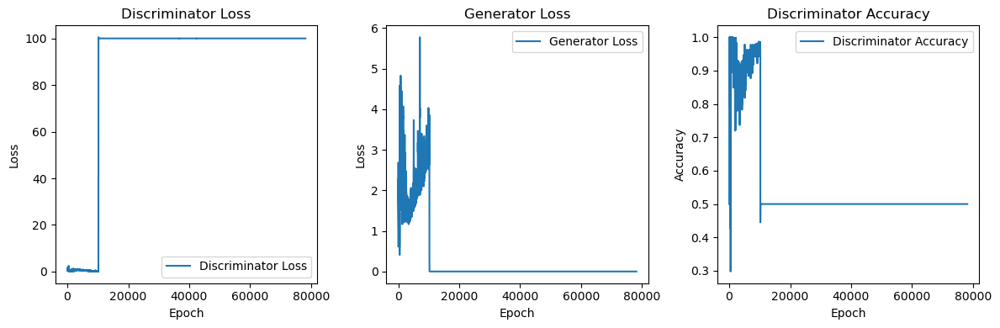

In [67]:
# Plotting
plt.figure(figsize=(12, 4))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(d_losses, label='Discriminator Loss')
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(g_losses, label='Generator Loss')
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(d_accuracies, label='Discriminator Accuracy')
plt.title('Discriminator Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [68]:
# Platting the values again

In [69]:
# Now we can calculate the averages and plot the values as previously done
# Calculate average values per epoch
avg_real_accuracies = []
avg_fake_accuracies = []
avg_d_losses = []
avg_g_losses = []

In [70]:
# Helper function for averaging
def calculate_average(values):
    return np.mean(values) if values else 0

current_epoch = 0
temp_real_acc = []
temp_fake_acc = []
temp_d_loss = []
temp_g_loss = []

In [71]:
for i in range(len(epochs)):
    if epochs[i] != current_epoch:
        # Calculate averages for the current epoch and reset lists
        avg_real_accuracies.append(calculate_average(temp_real_acc))
        avg_fake_accuracies.append(calculate_average(temp_fake_acc))
        avg_d_losses.append(calculate_average(temp_d_loss))
        avg_g_losses.append(calculate_average(temp_g_loss))

        temp_real_acc = []
        temp_fake_acc = []
        temp_d_loss = []
        temp_g_loss = []
        current_epoch = epochs[i]

    # Append current values
    temp_real_acc.append(real_accuracy_list[i])
    temp_fake_acc.append(fake_accuracy_list[i])
    temp_d_loss.append(d_losses[i])
    temp_g_loss.append(g_losses[i])

In [72]:
# Add averages for the last epoch
avg_real_accuracies.append(calculate_average(temp_real_acc))
avg_fake_accuracies.append(calculate_average(temp_fake_acc))
avg_d_losses.append(calculate_average(temp_d_loss))
avg_g_losses.append(calculate_average(temp_g_loss))

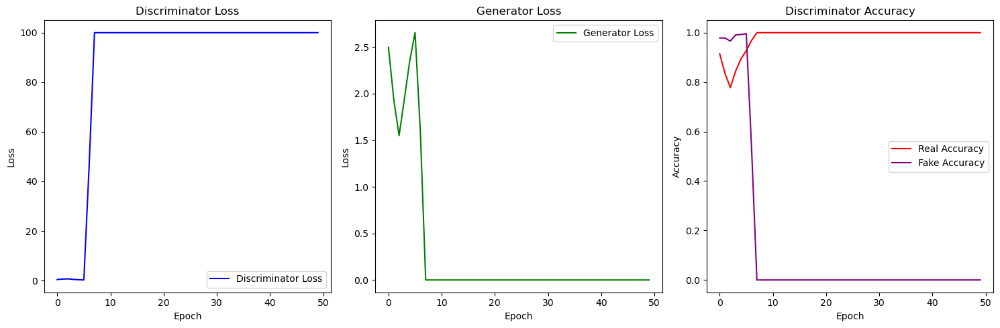

In [73]:
# Unique epochs for plotting
unique_epochs = sorted(list(set(epochs)))

# Plotting the graphs
plt.figure(figsize=(15, 5))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(unique_epochs, avg_d_losses, label='Discriminator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Discriminator Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(unique_epochs, avg_g_losses, label='Generator Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(unique_epochs, avg_real_accuracies, label='Real Accuracy', color='red')
plt.plot(unique_epochs, avg_fake_accuracies, label='Fake Accuracy', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Discriminator Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


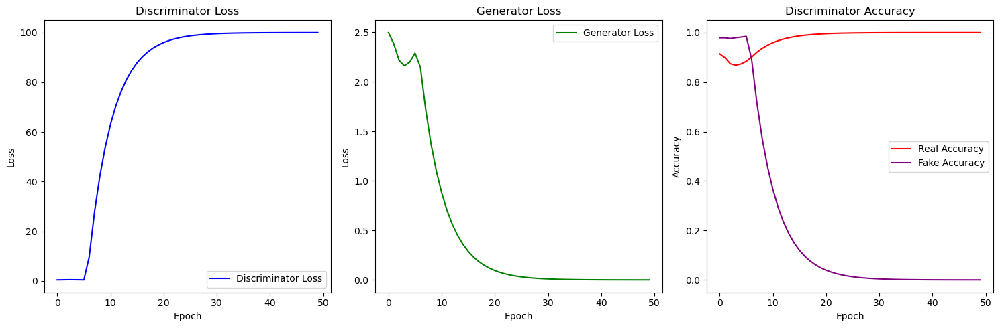

In [74]:
import matplotlib.pyplot as plt
import numpy as np


# Unique epochs for plotting
unique_epochs = sorted(list(set(epochs)))

# Smoothing the lines
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Applying smoothing
smoothed_d_losses = smooth_curve(avg_d_losses)
smoothed_g_losses = smooth_curve(avg_g_losses)
smoothed_real_accuracies = smooth_curve(avg_real_accuracies)
smoothed_fake_accuracies = smooth_curve(avg_fake_accuracies)

# Plotting the graphs with enhanced visualization
plt.figure(figsize=(15, 5))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(unique_epochs, smoothed_d_losses, label='Discriminator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Discriminator Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(unique_epochs, smoothed_g_losses, label='Generator Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(unique_epochs, smoothed_real_accuracies, label='Real Accuracy', color='red')
plt.plot(unique_epochs, smoothed_fake_accuracies, label='Fake Accuracy', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Discriminator Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


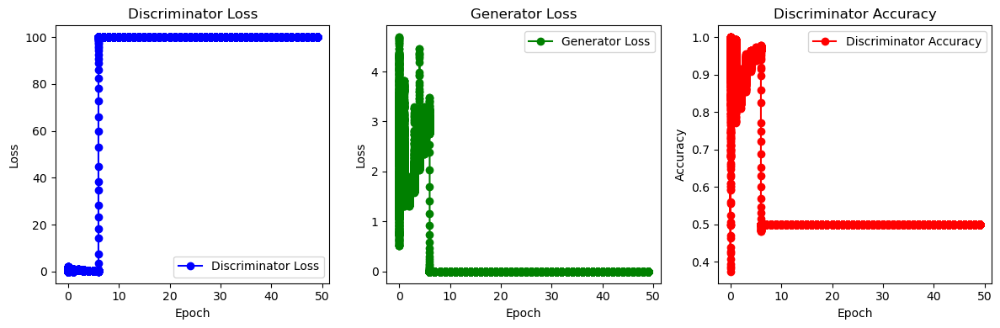

In [75]:
# Applying smoothing to these data as well
smoothed_d_losses1 = smooth_curve(d_losses)
smoothed_g_losses1 = smooth_curve(g_losses)
smoothed_d_accuracies1 = smooth_curve(d_accuracies)

# Enhanced plotting
plt.figure(figsize=(12, 4))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(epochs, smoothed_d_losses1, label='Discriminator Loss', color='blue', marker='o')
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(epochs, smoothed_g_losses1, label='Generator Loss', color='green', marker='o')
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(epochs, smoothed_d_accuracies1, label='Discriminator Accuracy', color='red', marker='o')
plt.title('Discriminator Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


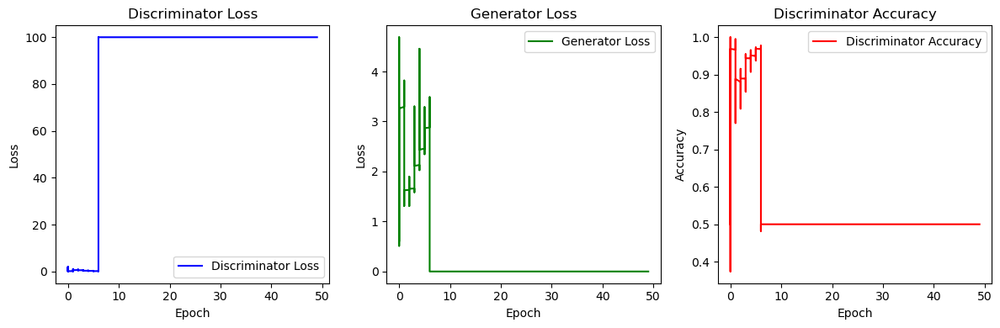

In [76]:
# Applying smoothing to these data as well
smoothed_d_losses1 = smooth_curve(d_losses)
smoothed_g_losses1 = smooth_curve(g_losses)
smoothed_d_accuracies1 = smooth_curve(d_accuracies)

# Enhanced plotting
plt.figure(figsize=(12, 4))

# Plot Discriminator Loss
plt.subplot(1, 3, 1)
plt.plot(epochs, smoothed_d_losses1, label='Discriminator Loss', color='blue')
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Generator Loss
plt.subplot(1, 3, 2)
plt.plot(epochs, smoothed_g_losses1, label='Generator Loss', color='green')
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Discriminator Accuracy
plt.subplot(1, 3, 3)
plt.plot(epochs, smoothed_d_accuracies1, label='Discriminator Accuracy', color='red')
plt.title('Discriminator Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()
